### Importing Libraries

In [11]:
import github3, json
import os
from datetime import date
import dateutil.relativedelta
import pandas as pd                                    # panda's nickname is pd
import numpy as np                                     # numpy as np
from pandas import DataFrame, Series                   # for convenience
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
from fbprophet import Prophet
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tsa.seasonal import seasonal_decompose
from datetime import datetime
import tensorflow as tf
from tensorflow.contrib.timeseries.python.timeseries import  NumpyReader
import time

### Setting Github token

In [12]:
GITHUB_TOKEN = ''#removed my accesstoken

## Req 1 : Retrieve information of the past 2 years for the given 5 repositories

### Fetching from 'angular' repository and creating JSON file

In [13]:
ORG = 'angular'
REPO = 'angular'
FILENAME_ISSUES = REPO + '.json'

f = open(FILENAME_ISSUES, 'w')
f.close()

gh = github3.login(token=GITHUB_TOKEN)

today = date.today()

# since github3 api support max 1000 issue for search, 
# we use a loop to get issues for every month for the past 24 months

for i in range(24):
        
        f = open(FILENAME_ISSUES, 'a')
        
        last_month = today + dateutil.relativedelta.relativedelta(months = -1)
        types = 'type:issue'
        repo = 'repo:angular/angular'
        ranges = 'created:' + str(last_month) + '..' + str(today)
        search_query = types + ' ' + repo + ' ' + ranges
        for issue in gh.search_issues(search_query):
            label_name=[]
            data={}
            current_issue = issue.as_json()
            current_issue = json.loads(current_issue)
            data['issue_number']=current_issue["number"]                          # Get issue number              
            data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
            if current_issue["closed_at"] == None:
                data['closed_at']= current_issue["closed_at"]
            else:
                data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
            for label in current_issue["labels"]:
                label_name.append(label["name"])                                  # Get label name of issue
            data['labels']= label_name
            data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
            data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
            out=json.dumps(data)                                                  # save this all information to a JSON file
            f.write(out+ '\n')
            
        f.close()
        today = last_month
        time.sleep(5)
        
#Reading the JSON file and creating dataframe


INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was re

In [14]:
issues = [json.loads(line) for line in open(FILENAME_ISSUES)]
df_1 = DataFrame(issues)
df_1.head()


,issue_number,created_at,closed_at,labels,State,Author
0,34023,2019-11-24,None,[],open,kolkov
1,34020,2019-11-24,None,[],open,Anderman
2,34018,2019-11-24,None,"[comp: i18n, comp: ivy, severity5: ivy-compat]",open,osnoser1
3,34016,2019-11-23,2019-11-23,"[comp: ngcc, freq2: medium, severity5: ivy-com...",closed,BrayanVG
4,34006,2019-11-23,2019-11-23,[],closed,ishaqueahmed-mev


### Fetching from 'material' repository and creating JSON file

In [15]:
ORG = 'angular'
REPO = 'material'
FILENAME_ISSUES = REPO + '.json'

f = open(FILENAME_ISSUES, 'w')
f.close()

gh = github3.login(token=GITHUB_TOKEN)

today = date.today()

# since github3 api support max 1000 issue for search, 
# we use a loop to get issues for every month for the past 24 months

for i in range(24):
        
        f = open(FILENAME_ISSUES, 'a')
        
        last_month = today + dateutil.relativedelta.relativedelta(months = -1)
        types = 'type:issue'
        repo = 'repo:angular/material'
        ranges = 'created:' + str(last_month) + '..' + str(today)
        search_query = types + ' ' + repo + ' ' + ranges
        for issue in gh.search_issues(search_query):
            label_name=[]
            data={}
            current_issue = issue.as_json()
            current_issue = json.loads(current_issue)
            data['issue_number']=current_issue["number"]                          # Get issue number              
            data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
            if current_issue["closed_at"] == None:
                data['closed_at']= current_issue["closed_at"]
            else:
                data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
            for label in current_issue["labels"]:
                label_name.append(label["name"])                                  # Get label name of issue
            data['labels']= label_name
            data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
            data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
            out=json.dumps(data)                                                  # save this all information to a JSON file
            f.write(out+ '\n')
            
        f.close()
        today = last_month
        time.sleep(5)
        
#Reading the JSON file and creating dataframe
issues = [json.loads(line) for line in open(FILENAME_ISSUES)]
df_2 = DataFrame(issues)
df_2.head()


INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
I

,issue_number,created_at,closed_at,labels,State,Author
0,11824,2019-11-21,None,[],open,sviams
1,11823,2019-11-21,None,[],open,mcurrycl
2,11821,2019-11-13,None,[],open,UoToGK
3,11820,2019-11-12,2019-11-12,[resolution: invalid],closed,Maxstgt
4,11814,2019-10-25,2019-11-02,[resolution: works as expected],closed,GTarifshabbir


### Fetching from 'angular-cli' repository and creating JSON file

In [16]:
ORG = 'angular'
REPO = 'angular-cli'
FILENAME_ISSUES = REPO + '.json'

f = open(FILENAME_ISSUES, 'w')
f.close()

gh = github3.login(token=GITHUB_TOKEN)

today = date.today()

# since github3 api support max 1000 issue for search, 
# we use a loop to get issues for every month for the past 24 months

for i in range(24):
        
        f = open(FILENAME_ISSUES, 'a')
        
        last_month = today + dateutil.relativedelta.relativedelta(months = -1)
        types = 'type:issue'
        repo = 'repo:angular/angular-cli'
        ranges = 'created:' + str(last_month) + '..' + str(today)
        search_query = types + ' ' + repo + ' ' + ranges
        for issue in gh.search_issues(search_query):
            label_name=[]
            data={}
            current_issue = issue.as_json()
            current_issue = json.loads(current_issue)
            data['issue_number']=current_issue["number"]                          # Get issue number              
            data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
            if current_issue["closed_at"] == None:
                data['closed_at']= current_issue["closed_at"]
            else:
                data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
            for label in current_issue["labels"]:
                label_name.append(label["name"])                                  # Get label name of issue
            data['labels']= label_name
            data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
            data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
            out=json.dumps(data)                                                  # save this all information to a JSON file
            f.write(out+ '\n')
            
        f.close()
        today = last_month
        time.sleep(5)

     

INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:g

In [17]:
#Reading the JSON file and creating dataframe
issues = [json.loads(line) for line in open(FILENAME_ISSUES)]
df_3 = DataFrame(issues)
df_3.head()   

,issue_number,created_at,closed_at,labels,State,Author
0,16275,2019-11-24,None,"[comp: devkit/build-angular, freq1: low, sever...",open,joshcomley
1,16272,2019-11-23,None,[],open,kolkov
2,16266,2019-11-22,None,"[comp: devkit/build-angular, freq1: low, sever...",open,mucbits
3,16265,2019-11-22,2019-11-22,[],closed,Dok11
4,16264,2019-11-22,2019-11-22,[],closed,GiridharanGAVS


### Fetching from 'angular-google-maps' repository and creating JSON file

In [18]:
ORG = 'SebastianM'
REPO = 'angular-google-maps'
FILENAME_ISSUES = REPO + '.json'

f = open(FILENAME_ISSUES, 'w')
f.close()

gh = github3.login(token=GITHUB_TOKEN)

today = date.today()

# since github3 api support max 1000 issue for search, 
# we use a loop to get issues for every month for the past 24 months

for i in range(24):
        
        f = open(FILENAME_ISSUES, 'a')
        
        last_month = today + dateutil.relativedelta.relativedelta(months = -1)
        types = 'type:issue'
        repo = 'repo:SebastianM/angular-google-maps'
        ranges = 'created:' + str(last_month) + '..' + str(today)
        search_query = types + ' ' + repo + ' ' + ranges
        for issue in gh.search_issues(search_query):
            label_name=[]
            data={}
            current_issue = issue.as_json()
            current_issue = json.loads(current_issue)
            data['issue_number']=current_issue["number"]                          # Get issue number              
            data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
            if current_issue["closed_at"] == None:
                data['closed_at']= current_issue["closed_at"]
            else:
                data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
            for label in current_issue["labels"]:
                label_name.append(label["name"])                                  # Get label name of issue
            data['labels']= label_name
            data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
            data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
            out=json.dumps(data)                                                  # save this all information to a JSON file
            f.write(out+ '\n')
            
        f.close()
        today = last_month
        time.sleep(5)



INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
I

In [19]:
#Reading the JSON file and creating dataframe
issues = [json.loads(line) for line in open(FILENAME_ISSUES)]
df_4 = DataFrame(issues)
df_4.head()

,issue_number,created_at,closed_at,labels,State,Author
0,1769,2019-11-22,2019-11-23,[],closed,jimmykane
1,1768,2019-11-21,2019-11-21,[],closed,RobertVogt
2,1767,2019-11-21,2019-11-21,[],closed,moayadnajd
3,1766,2019-11-20,None,[],open,BovineEnthusiast
4,1765,2019-11-19,None,[],open,sunojvijayan


### Fetching from 'd3' repository and creating JSON file

In [20]:
ORG = 'd3'
REPO = 'd3'
FILENAME_ISSUES = REPO + '.json'

f = open(FILENAME_ISSUES, 'w')
f.close()

gh = github3.login(token=GITHUB_TOKEN)

today = date.today()

# since github3 api support max 1000 issue for search, 
# we use a loop to get issues for every month for the past 24 months

for i in range(24):
        
        f = open(FILENAME_ISSUES, 'a')
        
        last_month = today + dateutil.relativedelta.relativedelta(months = -1)
        types = 'type:issue'
        repo = 'repo:d3/d3'
        ranges = 'created:' + str(last_month) + '..' + str(today)
        search_query = types + ' ' + repo + ' ' + ranges
        for issue in gh.search_issues(search_query):
            label_name=[]
            data={}
            current_issue = issue.as_json()
            current_issue = json.loads(current_issue)
            data['issue_number']=current_issue["number"]                          # Get issue number              
            data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
            if current_issue["closed_at"] == None:
                data['closed_at']= current_issue["closed_at"]
            else:
                data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
            for label in current_issue["labels"]:
                label_name.append(label["name"])                                  # Get label name of issue
            data['labels']= label_name
            data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
            data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
            out=json.dumps(data)                                                  # save this all information to a JSON file
            f.write(out+ '\n')
            
        f.close()
        today = last_month
        time.sleep(5)



INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
I

In [21]:
#Reading the JSON file and creating dataframe
issues = [json.loads(line) for line in open(FILENAME_ISSUES)]
df_5 = DataFrame(issues)
df_5.head()

,issue_number,created_at,closed_at,labels,State,Author
0,3357,2019-11-21,2019-11-21,[],closed,syedaatif
1,3356,2019-11-18,2019-11-19,[],closed,srikarbobbiganipalli
2,3355,2019-11-15,2019-11-15,[],closed,wudashuaige
3,3354,2019-11-05,2019-11-05,[],closed,znicholasbrown
4,3353,2019-10-23,2019-10-23,[],closed,Sundarcj


### Cleaning data

In [22]:
df_1.fillna(value=pd.np.nan, inplace=True)
df_2.fillna(value=pd.np.nan, inplace=True)
df_3.fillna(value=pd.np.nan, inplace=True)
df_4.fillna(value=pd.np.nan, inplace=True)
df_5.fillna(value=pd.np.nan, inplace=True)

## Req 2 : A Line Chart to plot the issues for every Repo

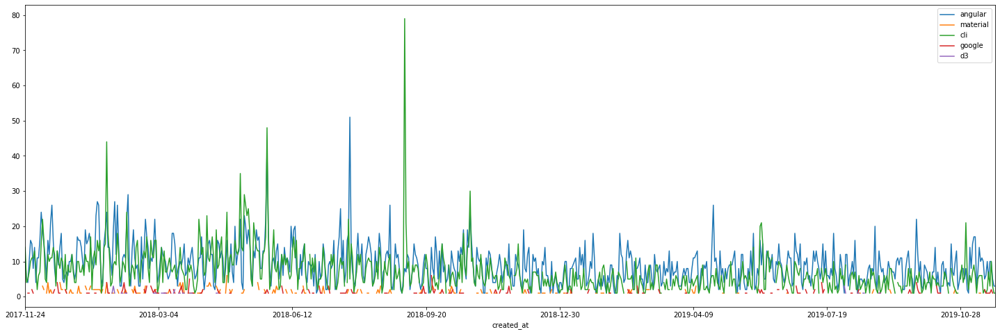

In [23]:
from pandas import DataFrame

issues_df = DataFrame()
issues_df['angular'] = df_1.groupby(['created_at']).created_at.count()
issues_df['material'] = df_2.groupby(['created_at']).created_at.count()
issues_df['cli'] = df_3.groupby(['created_at']).created_at.count()
issues_df['google'] = df_4.groupby(['created_at']).created_at.count()
issues_df['d3'] = df_5.groupby(['created_at']).created_at.count()

issues_df.plot(figsize = (25,8))

## Req 3 : A Bar Chart to plot the issues created for every month for every Repo

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning:


.ix is de

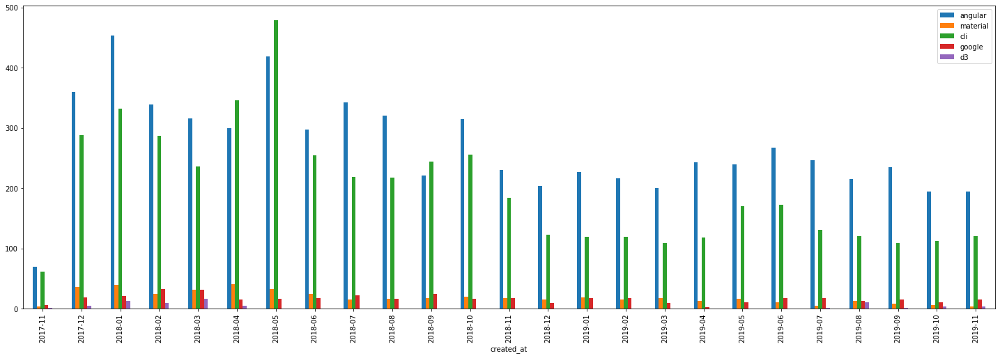

In [24]:
from pandas import DataFrame

issuesM_df = DataFrame()
issuesM_df['angular'] = (df_1.groupby(pd.to_datetime(df_1.created_at).dt.to_period("M")).count()).ix[:,0]
issuesM_df['material'] = (df_2.groupby(pd.to_datetime(df_2.created_at).dt.to_period("M")).count()).ix[:,0]
issuesM_df['cli'] = (df_3.groupby(pd.to_datetime(df_3.created_at).dt.to_period("M")).count()).ix[:,0]
issuesM_df['google'] = (df_4.groupby(pd.to_datetime(df_4.created_at).dt.to_period("M")).count()).ix[:,0]
issuesM_df['d3'] = (df_5.groupby(pd.to_datetime(df_5.created_at).dt.to_period("M")).count()).ix[:,0]
issuesM_df['d3'] = issuesM_df['d3'].replace(np.nan, 0)
issuesM_df

issuesM_df.plot.bar(figsize = (25,8))

## Req 4 : A Bar Chart to plot the starts for every Repo

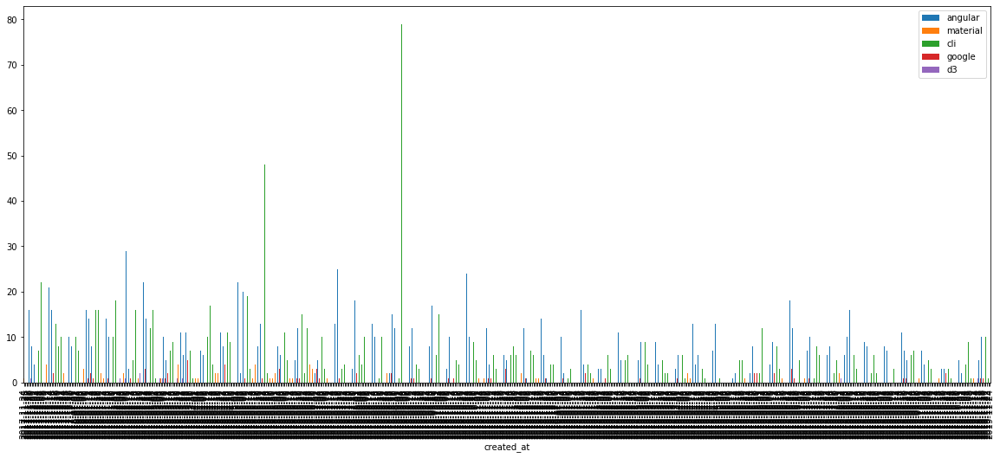

In [25]:
issues_df.plot.bar(figsize = (20,8))

## Req 5 : A Bar Chart to plot the forks for every Repo

INFO:github3:Building a url from ('https://api.github.com', 'repos', 'angular', 'angular')
INFO:github3:Missed the cache building the url
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'repos', 'angular', 'material')
INFO:github3:Missed the cache building the url
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'repos', 'angular', 'angular-cli')
INFO:github3:Missed the cache building the url
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'repos', 'SebastianM', 'angular-google-maps')
INFO:github3:Missed the cache building the url
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'repos', 'd3', 'd3')
INFO:github3:Missed the cache building the url
INFO:github3:JSON was returned


{'angular': 15084, 'material': 3607, 'angular-cli': 7982, 'angular-google-maps': 683, 'd3': 21575}


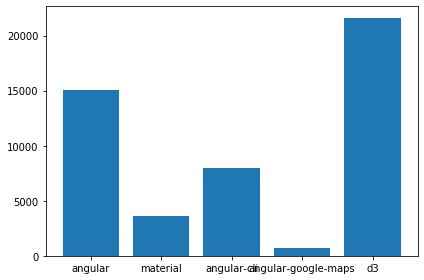

In [26]:
all_repos = ["angular/angular","angular/material","angular/angular-cli","SebastianM/angular-google-maps","d3/d3"]
dic = {}
for repo in all_repos:
    s = repo.split("/")
    gh = github3.login(token=GITHUB_TOKEN)
    repo = gh.repository(s[0],s[1])
    dic[s[1]] = repo.forks_count
print(dic)
names = list(dic.keys())
values = list(dic.values())
plt.bar(range(len(dic)), values, tick_label=names)
plt.tight_layout()
plt.show()

## Req 6 : A Bar Chart to plot the issues closed for every week for every Repo

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning:


.ix is de

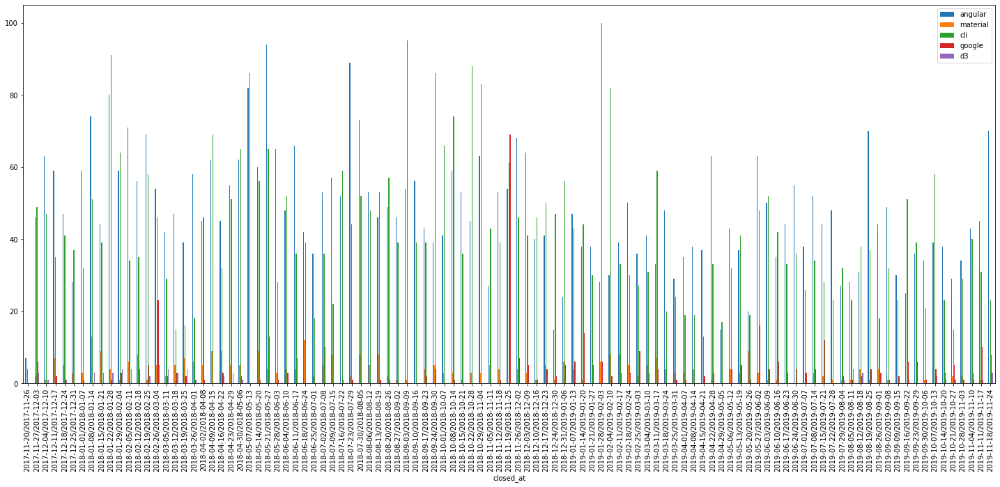

In [27]:
from pandas import DataFrame
issuesW_df = DataFrame()
issuesW_df['angular'] = (df_1.groupby(pd.to_datetime(df_1.closed_at).dt.to_period("W")).count()).ix[:,2]
issuesW_df['material'] = (df_2.groupby(pd.to_datetime(df_2.closed_at).dt.to_period("W")).count()).ix[:,0]
issuesW_df['cli'] = (df_3.groupby(pd.to_datetime(df_3.closed_at).dt.to_period("W")).count()).ix[:,0]
issuesW_df['google'] = (df_4.groupby(pd.to_datetime(df_4.closed_at).dt.to_period("W")).count()).ix[:,0]
issuesW_df['d3'] = (df_5.groupby(pd.to_datetime(df_5.closed_at).dt.to_period("W")).count()).ix[:,0]
issuesW_df
issuesW_df.plot.bar(figsize = (25,10))

## Req 7 : A Stack-Bar Chart to plot the created and closed issues for every Repo

Tuples Created:
6665 459 4929 409 70
Tuples Closed:
4967 356 4400 386 68


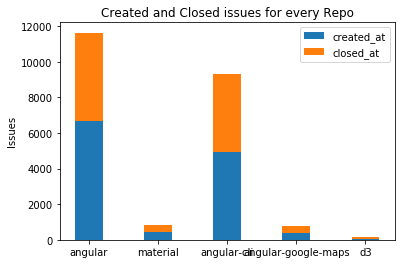

In [28]:
tuple_created = ()
tuple_closed = ()


tuple_created = tuple_created + ((df_1.groupby(['created_at']).created_at.count()).sum(),)
tuple_closed = tuple_closed + ((df_1.groupby(['closed_at']).closed_at.count()).sum(),)

tuple_created = tuple_created + ((df_2.groupby(['created_at']).created_at.count()).sum(),)
tuple_closed = tuple_closed + ((df_2.groupby(['closed_at']).created_at.count()).sum(),)

tuple_created = tuple_created + ((df_3.groupby(['created_at']).created_at.count()).sum(),)
tuple_closed = tuple_closed + ((df_3.groupby(['closed_at']).created_at.count()).sum(),)

tuple_created = tuple_created + ((df_4.groupby(['created_at']).created_at.count()).sum(),)
tuple_closed = tuple_closed + ((df_4.groupby(['closed_at']).created_at.count()).sum(),)

tuple_created = tuple_created + ((df_5.groupby(['created_at']).created_at.count()).sum(),)
tuple_closed = tuple_closed + ((df_5.groupby(['closed_at']).created_at.count()).sum(),)

print('Tuples Created:')
print(tuple_created[0],tuple_created[1],tuple_created[2],tuple_created[3],tuple_created[4])
print('Tuples Closed:')
print(tuple_closed[0],tuple_closed[1],tuple_closed[2],tuple_closed[3],tuple_closed[4])

ind =np.arange(5)    
width = 0.4
created = plt.bar(ind, tuple_created, width)
closed = plt.bar(ind, tuple_closed, width, bottom=tuple_created)

plt.ylabel('Issues')
plt.title('Created and Closed issues for every Repo')
plt.xticks(ind, ('angular','material','angular-cli','angular-google-maps','d3'))
plt.legend((created[0], closed[0]), ('created_at', 'closed_at'))
plt.show()

## Req 8 :

### Facebook/prophet

In [29]:
file_list = ['angular.json','material.json','angular-cli.json','angular-google-maps.json','d3.json']
df_list_new = []
for file in file_list:
    issues = [json.loads(line) for line in open(file)]
    df_new = DataFrame(issues)
    df_list_new.append(df_new)

In [30]:
#Creating csv files
df_list_new[0].to_csv('angular.csv', sep=',', encoding='utf-8', index=False)
df_list_new[1].to_csv('material.csv', sep=',', encoding='utf-8', index=False)
df_list_new[2].to_csv('angular-cli.csv', sep=',', encoding='utf-8', index=False)
df_list_new[3].to_csv('angular-google-maps.csv', sep=',', encoding='utf-8', index=False)
df_list_new[4].to_csv('d3.csv', sep=',', encoding='utf-8', index=False)

#### Req 8.1 : The day of the week maximum number of issues created

In [31]:
import datetime
from datetime import date
import calendar

def most_num_of_issues_created(file):
    df = pd.read_csv(file)
    df1 = df.groupby(['created_at']).count().reset_index()
    data = df1.sort_values('issue_number', ascending=False).head(1).iloc[0]['created_at']
    return data


In [32]:
angular = most_num_of_issues_created('angular.csv')
material = most_num_of_issues_created('material.csv')
angularCli = most_num_of_issues_created('angular-cli.csv')
angularMaps = most_num_of_issues_created('angular-google-maps.csv')
d3 = most_num_of_issues_created('d3.csv')

#Converting date to day
def convert(param):
    year, month, day = (int(x) for x in param.split('-'))    
    ans = datetime.date(year, month, day)
    return ans.strftime("%A")

In [33]:
print("Date and Day with most num of created_issues for repo angular = ", most_num_of_issues_created('angular.csv'),convert(angular))
print("Date and Day with most num of created_issues for repo material = ", most_num_of_issues_created('material.csv'),convert(material))
print("Date and Day with most num of created_issues for repo angular-cli = ", most_num_of_issues_created('angular-cli.csv'),convert(angularCli))
print("Date and Day with most num of created_issues for repo angular-google-maps = ", most_num_of_issues_created('angular-google-maps.csv'),convert(angularMaps))
print("Date and Day with most num of created_issues for repo d3 = ", most_num_of_issues_created('d3.csv'),convert(d3))

Date and Day with most num of created_issues for repo angular =  2018-07-25 Wednesday
Date and Day with most num of created_issues for repo material =  2018-04-24 Tuesday
Date and Day with most num of created_issues for repo angular-cli =  2018-09-04 Tuesday
Date and Day with most num of created_issues for repo angular-google-maps =  2018-09-24 Monday
Date and Day with most num of created_issues for repo d3 =  2019-08-01 Thursday


#### Req 8.2 : The day of the week maximum number of issues closed

In [34]:
from datetime import date

def most_num_of_issues_closed(file):
    df = pd.read_csv(file)
    df1 = df.groupby(['closed_at']).count().reset_index()
    data = df1.sort_values('issue_number', ascending=False).head(1).iloc[0]['closed_at']
    return data

In [35]:
angular = most_num_of_issues_closed('angular.csv')
material = most_num_of_issues_closed('material.csv')
angularCli = most_num_of_issues_closed('angular-cli.csv')
angularMaps = most_num_of_issues_closed('angular-google-maps.csv')
d3 = most_num_of_issues_closed('d3.csv')


#Converting date to day
def convert(param):
    day, month, year = (int(x) for x in param.split('-'))    
    ans = datetime.date(day, month, year)
    return ans.strftime("%A")

In [36]:
print("Date and Day with most num of closed_issues for repo angular = ", most_num_of_issues_closed('angular.csv'),convert(angular))
print("Date and Day with most num of closed_issues for repo material = ", most_num_of_issues_closed('material.csv'),convert(material))
print("Date and Day with most num of closed_issues for repo angular-cli = ", most_num_of_issues_closed('angular-cli.csv'),convert(angularCli))
print("Date and Day with most num of closed_issues for repo angular-google-maps = ", most_num_of_issues_closed('angular-google-maps.csv'),convert(angularMaps))
print("Date and Day with most num of closed_issues for repo d3 = ", most_num_of_issues_closed('d3.csv'),convert(d3))

Date and Day with most num of closed_issues for repo angular =  2018-07-26 Thursday
Date and Day with most num of closed_issues for repo material =  2018-06-22 Friday
Date and Day with most num of closed_issues for repo angular-cli =  2019-01-29 Tuesday
Date and Day with most num of closed_issues for repo angular-google-maps =  2018-11-20 Tuesday
Date and Day with most num of closed_issues for repo d3 =  2018-01-29 Monday


#### Req 8.3 : The month of the year that has maximum number of issues closed

In [37]:
df_list_new[0]['closed_month_year'] = pd.to_datetime(df_list_new[0]['closed_at']).dt.to_period('M')
df_list_new[1]['closed_month_year'] = pd.to_datetime(df_list_new[1]['closed_at']).dt.to_period('M')
df_list_new[2]['closed_month_year'] = pd.to_datetime(df_list_new[2]['closed_at']).dt.to_period('M')
df_list_new[3]['closed_month_year'] = pd.to_datetime(df_list_new[3]['closed_at']).dt.to_period('M')
df_list_new[4]['closed_month_year'] = pd.to_datetime(df_list_new[4]['closed_at']).dt.to_period('M')

In [38]:
Max_angular = df_list_new[0].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_material = df_list_new[1].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_angularCli = df_list_new[2].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_angularmaps = df_list_new[3].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_d3 = df_list_new[4].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)

In [39]:
print("The month of the year that has maximum number of issues closed for angular repository :",Max_angular.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed for material repository :",Max_material.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed angular-cli repository :",Max_angularCli.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed angular-google-maps repository :",Max_angularmaps.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed d3 repository :",Max_d3.strftime('%B %F'))

The month of the year that has maximum number of issues closed for angular repository : May 2018
The month of the year that has maximum number of issues closed for material repository : January 2018
The month of the year that has maximum number of issues closed angular-cli repository : October 2018
The month of the year that has maximum number of issues closed angular-google-maps repository : November 2018
The month of the year that has maximum number of issues closed d3 repository : March 2018


#### Req 8.4 : Plot the created issues forecast by calling the Prophet.plot method and passing in your forecast dataframe.

In [40]:
def predict_plot(file):
    m = Prophet()
    df = pd.read_csv(file)
    df_created = df['created_at'].value_counts().rename_axis('ds').reset_index(name='y')
    m.fit(df_created)
    future = m.make_future_dataframe(periods=200)
    forecast = m.predict(future)
    fig1 = m.plot(forecast)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


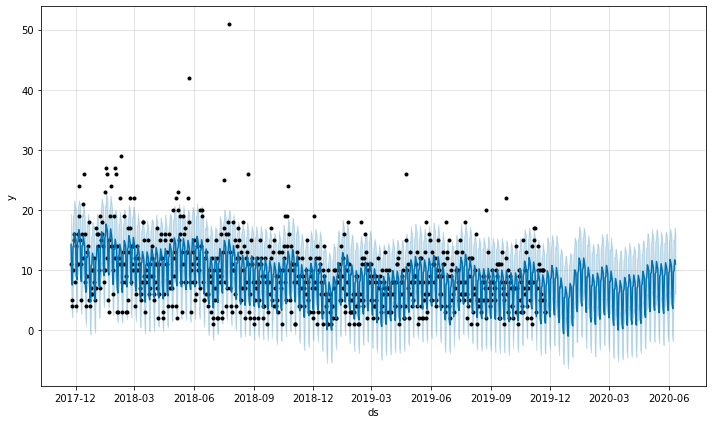

In [41]:
predict_plot('angular.csv')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


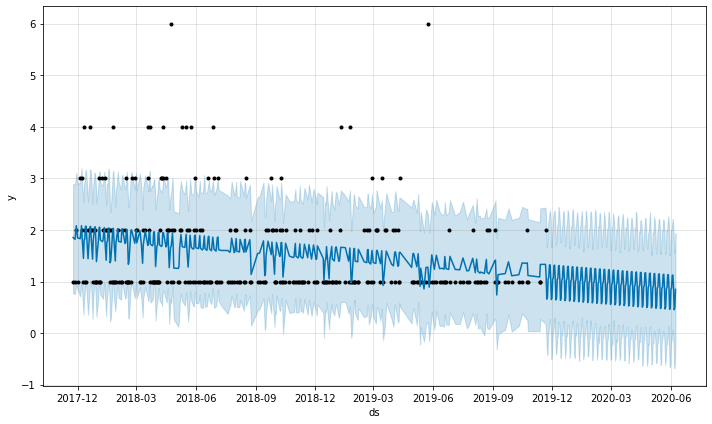

In [42]:
predict_plot('material.csv')

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


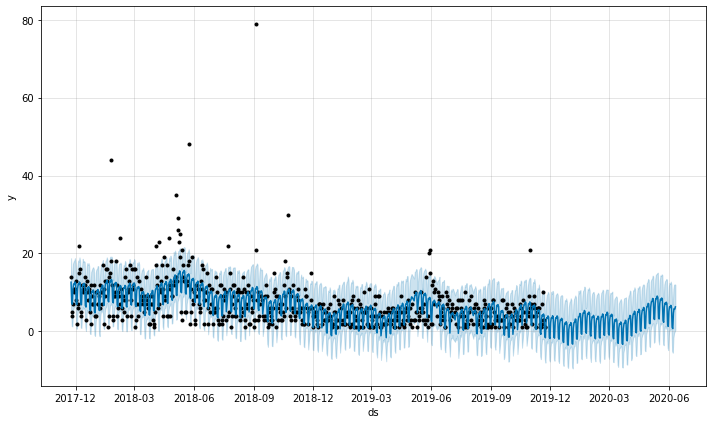

In [43]:
predict_plot('angular-cli.csv')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


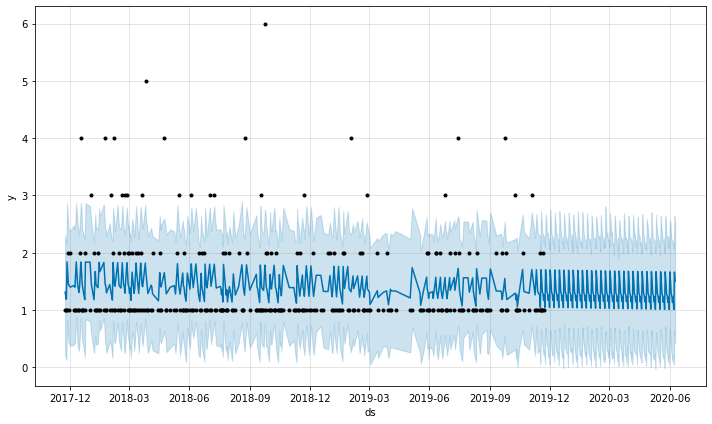

In [44]:
predict_plot('angular-google-maps.csv')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


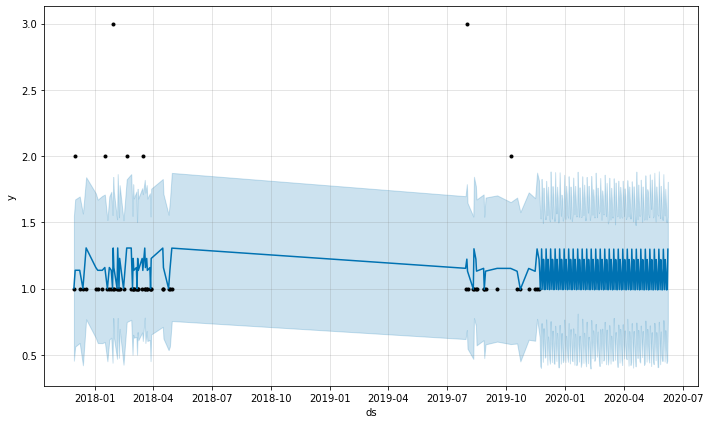

In [45]:
predict_plot('d3.csv')

#### Req 8.5 : Plot the closed issues forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

In [46]:
def predict_plot_closed(file):
    m = Prophet()
    df = pd.read_csv(file)
    df_closed = df['closed_at'].value_counts().rename_axis('ds').reset_index(name='y')
    m.fit(df_closed)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    fig1 = m.plot_components(forecast)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


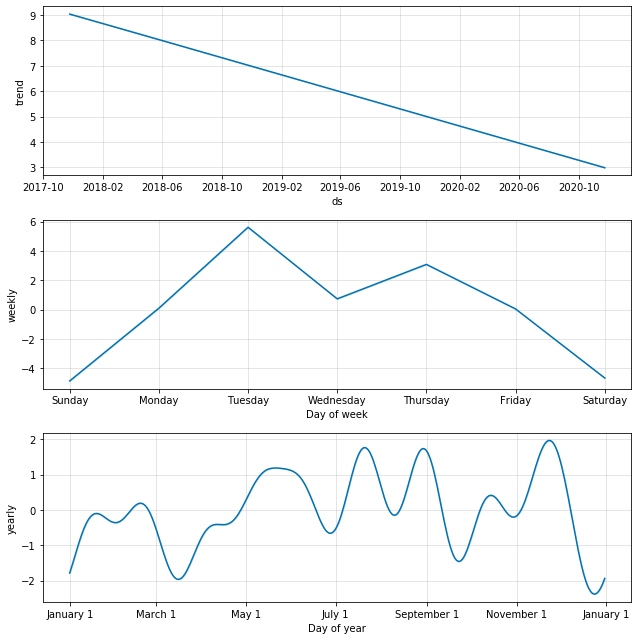

In [47]:
predict_plot_closed('angular.csv')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


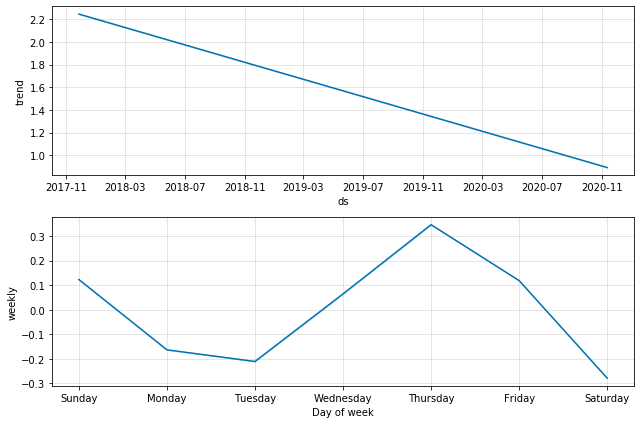

In [48]:
predict_plot_closed('material.csv')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


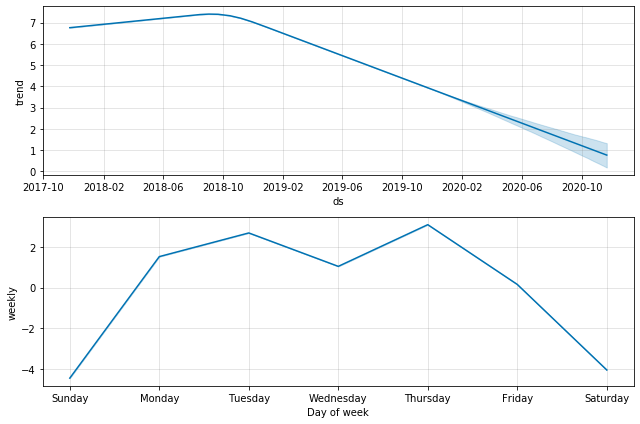

In [49]:
predict_plot_closed('angular-cli.csv')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


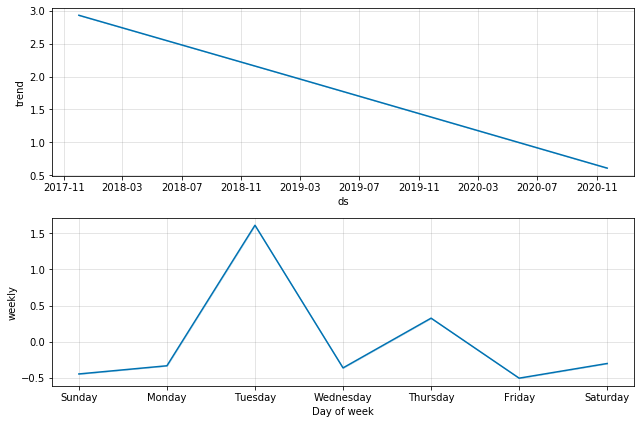

In [50]:
predict_plot_closed('angular-google-maps.csv')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


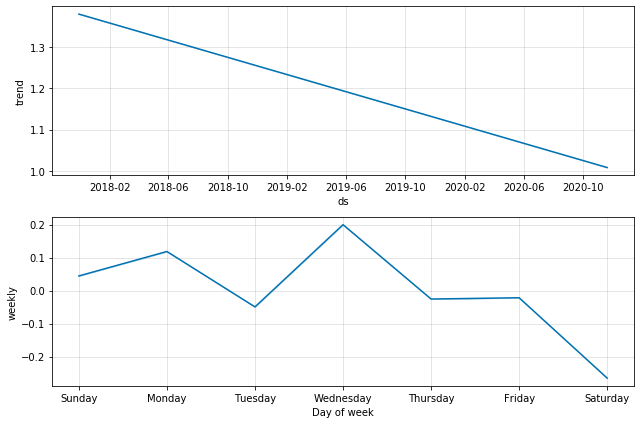

In [51]:
predict_plot_closed('d3.csv')

#### Req 8.6 : Plot the pulls forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

In [52]:
#repo angular
gh = github3.login(token=GITHUB_TOKEN)
REPO = 'angular'
FILENAME_ISSUES = REPO + 'pull.json'
f = open(FILENAME_ISSUES, 'w')
for i in range(24):
    for issue in gh.search_issues('type:pr repo:angular/angular'):        # Find issues from given Repo
        label_name=[]
        data={}
        current = issue.as_json()
        current_issue =json.loads(current)
        data['issue_number']=current_issue["number"]                          # Get issue number              
        data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
        if current_issue["closed_at"] == None:
            data['closed_at']= current_issue["closed_at"]
        else:
            data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
        for label in current_issue["labels"]:
            label_name.append(label["name"])                                  # Get label name of issue
        data['labels']= label_name
        data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
        data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
        out=json.dumps(data)                                                  # save this all information to a JSON file
        f.write(out+ '\n')
f.close()
print('success')

INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSO

ForbiddenError: 403 API rate limit exceeded for user ID 57270900.

In [53]:
list_of_pulls_fb_1 = [json.loads(line) for line in open('angularpull.json')]
df_list_pull_1 = DataFrame(list_of_pulls_fb_1)
df_list_pull_1

,issue_number,created_at,closed_at,labels,State,Author
0,34024,2019-11-24,None,"[PR state: WIP, cla: yes, comp: ivy]",open,AndrewKushnir
1,34022,2019-11-24,None,[cla: yes],open,ajitsinghkaler
2,34021,2019-11-24,None,"[PR action: review, PR target: master & patch,...",open,JoostK
3,34019,2019-11-24,None,"[PR action: review, PR target: master-only, cl...",open,crisbeto
4,34017,2019-11-23,None,"[PR action: review, PR target: master & patch,...",open,AndrewKushnir
...,...,...,...,...,...,...
2991,32362,2019-08-28,2019-09-10,"[PR action: merge, PR target: master & patch, ...",closed,tk3369
2992,32361,2019-08-28,2019-08-30,"[PR action: merge, PR action: merge-assistance...",closed,atscott
2993,32360,2019-08-27,2019-08-30,"[PR action: merge, PR target: master & patch, ...",closed,gkalpak
2994,32359,2019-08-27,2019-08-28,"[PR action: merge, PR target: master & patch, ...",closed,ahasall


In [54]:
listof_pullfb_1 = df_list_pull_1.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb_1.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb_1.head()

,ds,y
24,2019-09-21,3
81,2019-11-17,6
4,2019-09-01,6
39,2019-10-06,9
17,2019-09-14,9


In [56]:
#Adding holidays to the dataframe
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
  'lower_window': 0,
  'upper_window': 1,
})
holidays = superbowls
m = Prophet(yearly_seasonality = True,  holidays = holidays)
m.fit(listof_pullfb_1)
future_1 = m.make_future_dataframe(periods=365)
forecast_1 = m.predict(future_1)
forecast_1[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
449,2020-11-19,192.518718,177.625425,208.608812
450,2020-11-20,184.741819,170.700190,199.529078
451,2020-11-21,168.254659,152.896822,182.843408
452,2020-11-22,160.974600,147.199355,175.783055
453,2020-11-23,183.616218,167.982956,198.741780


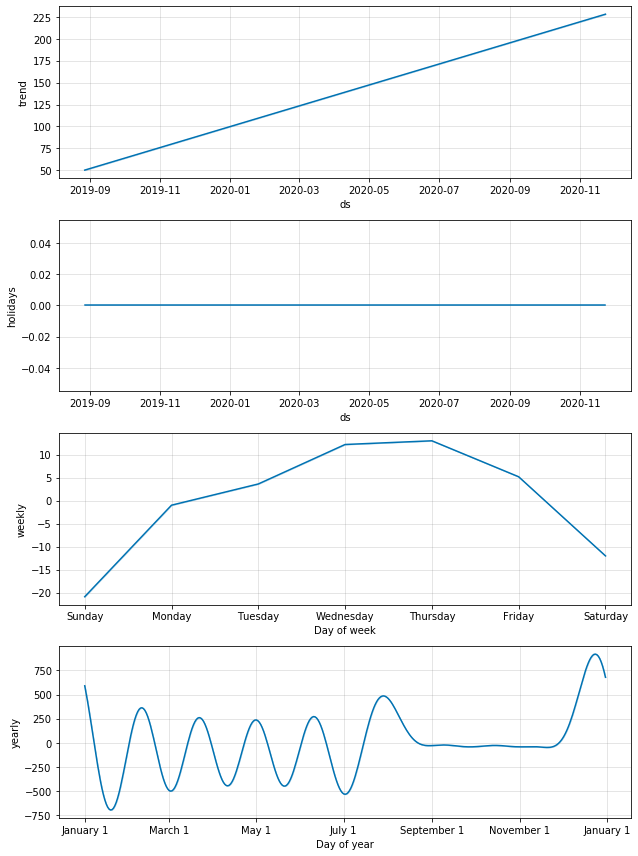

In [57]:
fig_1 = m.plot_components(forecast_1)

In [58]:
#repo material
gh = github3.login(token=GITHUB_TOKEN)
REPO = 'material'
FILENAME_ISSUES = REPO + 'pull.json'
f = open(FILENAME_ISSUES, 'w')
for i in range(24):
    for issue in gh.search_issues('type:pr repo:angular/material'):        # Find issues from given Repo
        label_name=[]
        data={}
        current = issue.as_json()
        current_issue =json.loads(current)
        data['issue_number']=current_issue["number"]                          # Get issue number              
        data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
        if current_issue["closed_at"] == None:
            data['closed_at']= current_issue["closed_at"]
        else:
            data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
        for label in current_issue["labels"]:
            label_name.append(label["name"])                                  # Get label name of issue
        data['labels']= label_name
        data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
        data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
        out=json.dumps(data)                                                  # save this all information to a JSON file
        f.write(out+ '\n')
f.close()
print('success')

INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSO

ForbiddenError: 403 API rate limit exceeded for user ID 57270900.

In [182]:
list_of_pulls_fb_2 = [json.loads(line) for line in open('materialpull.json')]
df_list_pull_2 = DataFrame(list_of_pulls_fb_2)
df_list_pull_2

,issue_number,created_at,closed_at,labels,State,Author
0,11825,2019-11-21,None,[cla: yes],open,sviams
1,11822,2019-11-20,None,"[cla: yes, dependencies]",open,dependabot[bot]
2,11818,2019-11-06,None,[cla: yes],open,qubiack
3,11817,2019-11-03,None,"[P2: required, a11y, cla: yes, g3: reported, g...",open,marosoft
4,11816,2019-11-02,None,"[P2: required, cla: yes, pr: merge ready, pr: ...",open,Splaktar
...,...,...,...,...,...,...
2995,8870,2016-06-27,2016-07-14,[],closed,isaaclyman
2996,8858,2016-06-26,2016-06-28,"[pr: merge ready, type: demos]",closed,devversion
2997,8856,2016-06-26,2016-06-28,[pr: merge ready],closed,devversion
2998,8855,2016-06-26,2016-06-28,[pr: merge ready],closed,bradrich


In [150]:
listof_pullfb_2 = df_list_pull_2.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb_2.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb_2.head()

,ds,y
0,2016-06-25,24
308,2018-03-16,24
306,2018-03-12,24
305,2018-03-11,24
304,2018-03-10,24


In [151]:
#Adding holidays to the dataframe
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
  'lower_window': 0,
  'upper_window': 1,
})
holidays = superbowls
m = Prophet(yearly_seasonality = True,  holidays = holidays)
m.fit(listof_pullfb_2)
future_2 = m.make_future_dataframe(periods=365)
forecast_2 = m1.predict(future_2)
forecast_2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
866,2020-11-16,911.293691,791.635134,1025.794385
867,2020-11-17,954.479539,833.021092,1073.400803
868,2020-11-18,983.999926,864.715426,1103.976781
869,2020-11-19,972.458365,852.539682,1088.025357
870,2020-11-20,877.832400,748.407283,999.634300


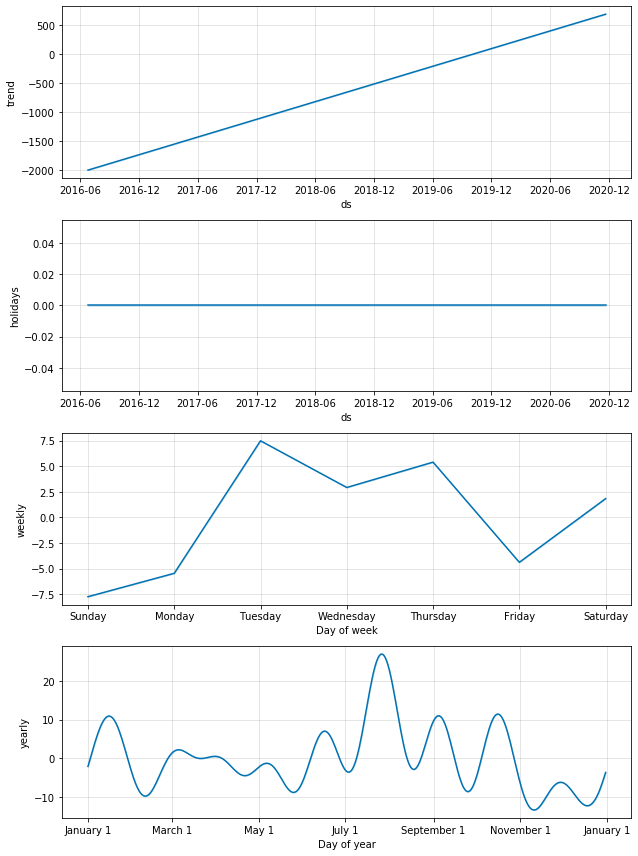

In [152]:
fig_2 = m.plot_components(forecast_2)

In [61]:
#repo angular-cli
gh = github3.login(token=GITHUB_TOKEN)
REPO = 'angular-cli'
FILENAME_ISSUES = REPO + 'pull.json'
f = open(FILENAME_ISSUES, 'w')
for i in range(24):
    for issue in gh.search_issues('type:pr repo:angular/angular-cli'):        # Find issues from given Repo
        label_name=[]
        data={}
        current = issue.as_json()
        current_issue =json.loads(current)
        data['issue_number']=current_issue["number"]                          # Get issue number              
        data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
        if current_issue["closed_at"] == None:
            data['closed_at']= current_issue["closed_at"]
        else:
            data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
        for label in current_issue["labels"]:
            label_name.append(label["name"])                                  # Get label name of issue
        data['labels']= label_name
        data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
        data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
        out=json.dumps(data)                                                  # save this all information to a JSON file
        f.write(out+ '\n')
f.close()
print('success')

INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSO

ForbiddenError: 403 API rate limit exceeded for user ID 57270900.

In [62]:
list_of_pulls_fb_3 = [json.loads(line) for line in open('angular-clipull.json')]
df_list_pull_3 = DataFrame(list_of_pulls_fb_3)
df_list_pull_3

,issue_number,created_at,closed_at,labels,State,Author
0,16276,2019-11-24,None,"[PR target: master & patch, cla: yes]",open,clydin
1,16274,2019-11-23,None,[cla: yes],open,arturovt
2,16273,2019-11-23,None,[cla: yes],open,arturovt
3,16271,2019-11-23,None,"[PR target: master-only, cla: yes]",open,renovate[bot]
4,16270,2019-11-23,None,"[PR target: master-only, cla: yes]",open,renovate[bot]
...,...,...,...,...,...,...
2953,14382,2019-05-09,2019-05-10,"[PR target: master & patch, cla: yes]",closed,clydin
2954,14381,2019-05-09,2019-05-09,"[PR target: master-only, cla: yes]",closed,clydin
2955,14380,2019-05-08,2019-05-10,"[PR target: master & patch, cla: yes]",closed,captaincaius
2956,14377,2019-05-08,2019-05-09,"[PR target: master & patch, cla: yes]",closed,clydin


In [63]:
listof_pullfb_3 = df_list_pull_3.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb_3.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb_3.head()

,ds,y
198,2019-11-24,3
33,2019-06-03,3
52,2019-06-23,3
66,2019-07-08,3
12,2019-05-11,3


In [64]:
#Adding holidays to the dataframe
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
  'lower_window': 0,
  'upper_window': 1,
})
holidays = superbowls
m = Prophet(yearly_seasonality = True,  holidays = holidays)
m.fit(listof_pullfb_3)
future_3 = m.make_future_dataframe(periods=365)
forecast_3 = m.predict(future_3)
forecast_3[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
559,2020-11-19,25.264754,17.048989,33.133243
560,2020-11-20,22.273775,14.338968,30.752510
561,2020-11-21,15.955028,8.254155,23.766816
562,2020-11-22,10.863336,2.915336,18.655065
563,2020-11-23,16.991881,9.360684,24.704143


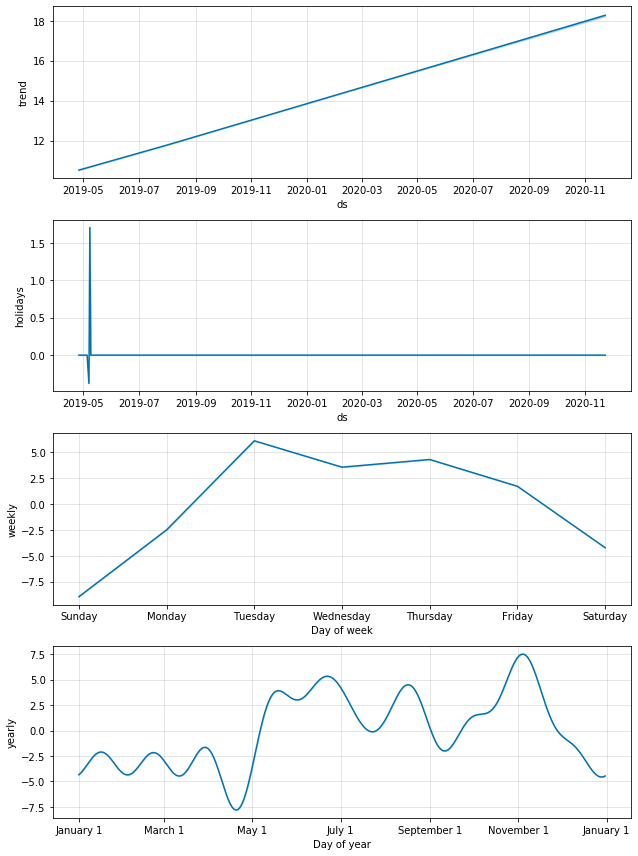

In [65]:
fig_3 = m.plot_components(forecast_3)

In [67]:
#repo angular-google-maps
gh = github3.login(token=GITHUB_TOKEN)
REPO = 'angular-google-maps'
FILENAME_ISSUES = REPO + 'pull.json'
f = open(FILENAME_ISSUES, 'w')
for i in range(24):
    for issue in gh.search_issues('type:pr repo:SebastianM/angular-google-maps'):        # Find issues from given Repo
        label_name=[]
        data={}
        current = issue.as_json()
        current_issue =json.loads(current)
        data['issue_number']=current_issue["number"]                          # Get issue number              
        data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
        if current_issue["closed_at"] == None:
            data['closed_at']= current_issue["closed_at"]
        else:
            data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
        for label in current_issue["labels"]:
            label_name.append(label["name"])                                  # Get label name of issue
        data['labels']= label_name
        data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
        data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
        out=json.dumps(data)                                                  # save this all information to a JSON file
        f.write(out+ '\n')
f.close()
print('success')

INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSO

ForbiddenError: 403 API rate limit exceeded for user ID 57270900.

In [74]:
list_of_pulls_4 = [json.loads(line) for line in open('angular-google-mapspull.json')]
df_list_pull_4 = DataFrame(list_of_pulls_4)
df_list_pull_4

,issue_number,created_at,closed_at,labels,State,Author
0,1754,2019-11-02,2019-11-05,[],closed,doom777
1,1749,2019-10-18,2019-11-05,[],closed,doom777
2,1747,2019-10-14,2019-11-12,[],closed,pertsenga
3,1743,2019-10-11,2019-10-18,[],closed,DefJunx
4,1739,2019-10-01,2019-10-10,[],closed,DefJunx
...,...,...,...,...,...,...
4574,786,2016-12-13,2016-12-15,[greenkeeper],closed,greenkeeperio-bot
4575,785,2016-12-12,2016-12-15,[greenkeeper],closed,greenkeeperio-bot
4576,784,2016-12-12,2016-12-16,[greenkeeper],closed,greenkeeperio-bot
4577,779,2016-12-07,2016-12-15,[greenkeeper],closed,greenkeeperio-bot


In [75]:
listof_pullfb_4 = df_list_pull_4.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb_4.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb_4.head()

,ds,y
0,2015-11-07,5
133,2016-05-26,5
134,2016-05-27,5
135,2016-05-30,5
136,2016-05-31,5


In [76]:
#Adding holidays to the dataframe
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
  'lower_window': 0,
  'upper_window': 1,
})
holidays = superbowls
m = Prophet(yearly_seasonality = True,  holidays = holidays)
m.fit(listof_pullfb_4)
future_4 = m.make_future_dataframe(periods=365)
forecast_4 = m.predict(future_4)
forecast_4[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
816,2020-10-28,3.103198,-5.453690,11.681067
817,2020-10-29,3.362993,-5.302086,11.295288
818,2020-10-30,3.156973,-4.618840,11.164441
819,2020-10-31,2.169598,-6.426872,10.648286
820,2020-11-01,0.955139,-6.719635,8.908331


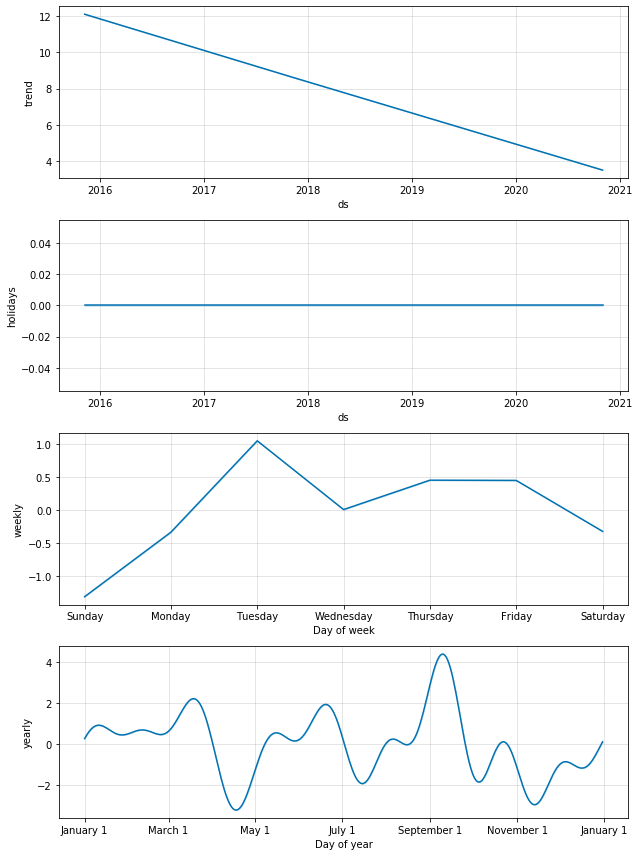

In [77]:
fig_4 = m.plot_components(forecast_4)

In [79]:
#repo d3
gh = github3.login(token=GITHUB_TOKEN)
REPO = 'd3'
FILENAME_ISSUES = REPO + 'pull.json'
f = open(FILENAME_ISSUES, 'w')
for i in range(24):
    for issue in gh.search_issues('type:pr repo:d3/d3'):        # Find issues from given Repo
        label_name=[]
        data={}
        current = issue.as_json()
        current_issue =json.loads(current)
        data['issue_number']=current_issue["number"]                          # Get issue number              
        data['created_at']= current_issue["created_at"][0:10]                 # Get created date of issue
        if current_issue["closed_at"] == None:
            data['closed_at']= current_issue["closed_at"]
        else:
            data['closed_at']= current_issue["closed_at"][0:10]               # Get closed date of issue
        for label in current_issue["labels"]:
            label_name.append(label["name"])                                  # Get label name of issue
        data['labels']= label_name
        data['State'] = current_issue["state"]                                # It gives state of issue like closed or open
        data['Author'] = current_issue["user"]["login"]                       # Get Author of issue
        out=json.dumps(data)                                                  # save this all information to a JSON file
        f.write(out+ '\n')
f.close()
print('success')

INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:Building a url from ('https://api.github.com', 'search', 'issues')
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSON was returned
INFO:github3:JSO

ForbiddenError: 403 API rate limit exceeded for user ID 57270900.

In [80]:
list_of_pulls_fb_5 = [json.loads(line) for line in open('d3pull.json')]
df_list_pull_5 = DataFrame(list_of_pulls_fb_5)
df_list_pull_5

,issue_number,created_at,closed_at,labels,State,Author
0,3349,2019-10-03,2019-10-03,[],closed,EddieKaleb
1,3348,2019-09-24,2019-09-25,[],closed,tmcw
2,3343,2019-08-23,2019-08-30,[],closed,krynv
3,3339,2019-08-12,2019-08-12,[],closed,severo
4,3332,2019-04-25,2019-08-01,[],closed,brettz9
...,...,...,...,...,...,...
5284,1894,2014-05-29,2014-06-12,[],closed,Rich-Harris
5285,1892,2014-05-28,2014-06-30,[],closed,foolip
5286,1891,2014-05-28,2016-05-14,[test],closed,MichaelHilton
5287,1884,2014-05-22,2014-06-30,[],closed,afc163


In [81]:
listof_pullfb_5 = df_list_pull_5.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb_5.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb_5.head()

,ds,y
0,2011-07-07,5
280,2013-03-31,5
278,2013-03-28,5
277,2013-03-27,5
276,2013-03-26,5


In [82]:
#Adding holidays to the dataframe
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
  'lower_window': 0,
  'upper_window': 1,
})
holidays = superbowls
m = Prophet(yearly_seasonality = True,  holidays = holidays)
m.fit(listof_pullfb_5)
future_5 = m.make_future_dataframe(periods=365)
forecast_5 = m.predict(future_5)
forecast_5[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
1044,2020-09-28,7.106135,2.105029,12.444155
1045,2020-09-29,6.871475,1.727199,12.739187
1046,2020-09-30,7.310818,1.782592,12.459144
1047,2020-10-01,6.767305,1.304388,11.955342
1048,2020-10-02,7.139668,1.708096,12.377771


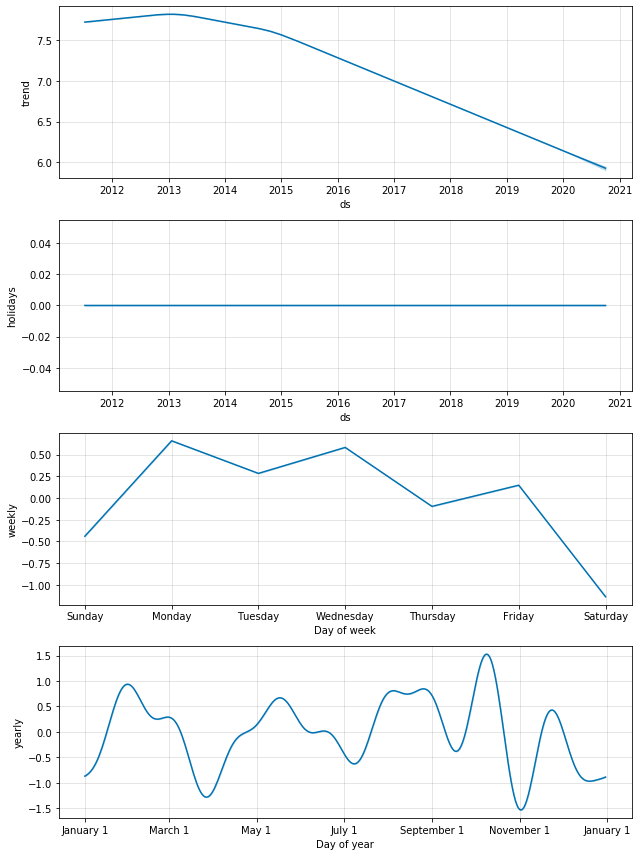

In [83]:
fig_5 = m.plot_components(forecast_5)

#### Req 8.7 : Plot the commits forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

In [85]:
import json
import requests
import numpy as np
import pandas as pd

import requests
from requests.auth import HTTPBasicAuth

from datetime import datetime

#credentials = json.loads(open('credentials.json').read())
authentication = HTTPBasicAuth('MFA19SCM94G', 'Vignesh@19')

In [86]:
data = requests.get('https://api.github.com/users/angular',
                    auth = authentication)
data1 = requests.get('https://api.github.com/users/SebastianM', auth = authentication)
data2 = requests.get('https://api.github.com/users/d3', auth = authentication)
data3 = requests.get('https://api.github.com/users/angular',
                    auth = authentication)
data4 = requests.get('https://api.github.com/users/angular',
                    auth = authentication)
data1 = data1.json()
data2 = data2.json()
data = data.json()
data3 = data3.json()
data4 = data4.json()


In [87]:
url = data['repos_url']
page_no = 1
repos_data = []
while (True):
    response = requests.get(url, auth = authentication)
    response = response.json()
    repos_data = repos_data + response
    repos_fetched = len(response)
    #print("Total repositories fetched: {}".format(repos_fetched))
    if (repos_fetched == 30):
        page_no = page_no + 1
        url = data['repos_url'] + '?page=' + str(page_no)
    else:
        break
repo_req = []
k=0
for i in range(len(repos_data)):
    if ((repos_data[i]['url'] == 'https://api.github.com/repos/angular/angular')):
        repo_req.append(repos_data[i])
        k = k+1
repos_information = []
for i, repo in enumerate(repo_req):
    data = []
    data.append(repo['id'])
    data.append(repo['name'])
    data.append(repo['description'])
    data.append(repo['created_at'])
    data.append(repo['updated_at'])
    data.append(repo['owner']['login'])
    data.append(repo['license']['name'] if repo['license'] != None else None)
    data.append(repo['has_wiki'])
    data.append(repo['forks_count'])
    data.append(repo['open_issues_count'])
    data.append(repo['stargazers_count'])
    data.append(repo['watchers_count'])
    data.append(repo['url'])
    data.append(repo['commits_url'].split("{")[0])
    data.append(repo['url'] + '/branches?')
    data.append(repo['url'] + '/contributors')
    data.append(repo['releases_url'])
    data.append(repo['url'] + '/languages')
    repos_information.append(data)
repos_df = pd.DataFrame(repos_information, columns = ['Id', 'Name', 'Description', 'Created on', 'Updated on', 
                                                      'Owner', 'License', 'Includes wiki', 'Forks count', 
                                                      'Issues count', 'Stars count', 'Watchers count',
                                                      'Repo URL', 'Commits URL','Branches URL','Contributors URL','Releases URL', 'Languages URL'])
#repos_df.head(40)
repos_df['Releases URL']
repos_df.to_csv('repos_info.csv', index = False)

In [88]:
url = data3['repos_url']
page_no = 1
repos_data = []
while (True):
    response = requests.get(url, auth = authentication)
    response = response.json()
    repos_data = repos_data + response
    repos_fetched = len(response)
    print("Total repositories fetched: {}".format(repos_fetched))
    if (repos_fetched == 30):
        page_no = page_no + 1
        url = data3['repos_url'] + '?page=' + str(page_no)
    else:
        break
repo_req = []
k=0
for i in range(len(repos_data)):
    if ((repos_data[i]['url'] == 'https://api.github.com/repos/angular/material')):
        repo_req.append(repos_data[i])
        k = k+1
repos_information = []
for i, repo in enumerate(repo_req):
    data3 = []
    data3.append(repo['id'])
    data3.append(repo['name'])
    data3.append(repo['description'])
    data3.append(repo['created_at'])
    data3.append(repo['updated_at'])
    data3.append(repo['owner']['login'])
    data3.append(repo['license']['name'] if repo['license'] != None else None)
    data3.append(repo['has_wiki'])
    data3.append(repo['forks_count'])
    data3.append(repo['open_issues_count'])
    data3.append(repo['stargazers_count'])
    data3.append(repo['watchers_count'])
    data3.append(repo['url'])
    data3.append(repo['commits_url'].split("{")[0])
    data3.append(repo['url'] + '/branches?')
    data3.append(repo['url'] + '/contributors')
    data3.append(repo['releases_url'])
    data3.append(repo['url'] + '/languages')
    repos_information.append(data3)
repos_dfmaterial = pd.DataFrame(repos_information, columns = ['Id', 'Name', 'Description', 'Created on', 'Updated on', 
                                                      'Owner', 'License', 'Includes wiki', 'Forks count', 
                                                      'Issues count', 'Stars count', 'Watchers count',
                                                      'Repo URL', 'Commits URL','Branches URL','Contributors URL','Releases URL', 'Languages URL'])
#repos_df.head(40)
repos_dfmaterial['Releases URL']
repos_dfmaterial.to_csv('repos_info.csv', index = False)

Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 12


In [89]:
url = data4['repos_url']
page_no = 1
repos_data = []
while (True):
    response = requests.get(url, auth = authentication)
    response = response.json()
    repos_data = repos_data + response
    repos_fetched = len(response)
    print("Total repositories fetched: {}".format(repos_fetched))
    if (repos_fetched == 30):
        page_no = page_no + 1
        url = data4['repos_url'] + '?page=' + str(page_no)
    else:
        break
repo_req = []
k=0
for i in range(len(repos_data)):
    if ((repos_data[i]['url'] == 'https://api.github.com/repos/angular/angular-cli')):
        repo_req.append(repos_data[i])
        k = k+1
repos_information = []
for i, repo in enumerate(repo_req):
    data4 = []
    data4.append(repo['id'])
    data4.append(repo['name'])
    data4.append(repo['description'])
    data4.append(repo['created_at'])
    data4.append(repo['updated_at'])
    data4.append(repo['owner']['login'])
    data4.append(repo['license']['name'] if repo['license'] != None else None)
    data4.append(repo['has_wiki'])
    data4.append(repo['forks_count'])
    data4.append(repo['open_issues_count'])
    data4.append(repo['stargazers_count'])
    data4.append(repo['watchers_count'])
    data4.append(repo['url'])
    data4.append(repo['commits_url'].split("{")[0])
    data4.append(repo['url'] + '/branches?')
    data4.append(repo['url'] + '/contributors')
    data4.append(repo['releases_url'])
    data4.append(repo['url'] + '/languages')
    repos_information.append(data4)
repos_dfangularcli = pd.DataFrame(repos_information, columns = ['Id', 'Name', 'Description', 'Created on', 'Updated on', 
                                                      'Owner', 'License', 'Includes wiki', 'Forks count', 
                                                      'Issues count', 'Stars count', 'Watchers count',
                                                      'Repo URL', 'Commits URL','Branches URL','Contributors URL','Releases URL', 'Languages URL'])
#repos_df.head(40)
repos_dfangularcli['Releases URL']
repos_dfangularcli.to_csv('repos_info.csv', index = False)

Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 30
Total repositories fetched: 12


In [90]:
url = data1['repos_url']
page_no = 1
repos_data = []
while (True):
    response = requests.get(url, auth = authentication)
    response = response.json()
    repos_data = repos_data + response
    repos_fetched = len(response)
    print("Total repositories fetched: {}".format(repos_fetched))
    if (repos_fetched == 30):
        page_no = page_no + 1
        url = data1['repos_url'] + '?page=' + str(page_no)
    else:
        break
repo_req = []
k=0
for i in range(len(repos_data)):
    if ((repos_data[i]['url'] == 'https://api.github.com/repos/SebastianM/angular-google-maps')):
        repo_req.append(repos_data[i])
        k = k+1
repos_information = []
for i, repo in enumerate(repo_req):
    data1 = []
    data1.append(repo['id'])
    data1.append(repo['name'])
    data1.append(repo['description'])
    data1.append(repo['created_at'])
    data1.append(repo['updated_at'])
    data1.append(repo['owner']['login'])
    data1.append(repo['license']['name'] if repo['license'] != None else None)
    data1.append(repo['has_wiki'])
    data1.append(repo['forks_count'])
    data1.append(repo['open_issues_count'])
    data1.append(repo['stargazers_count'])
    data1.append(repo['watchers_count'])
    data1.append(repo['url'])
    data1.append(repo['commits_url'].split("{")[0])
    data1.append(repo['url'] + '/branches?')
    data1.append(repo['url'] + '/contributors')
    data1.append(repo['releases_url'])
    data1.append(repo['url'] + '/languages')
    repos_information.append(data1)
repos_dfangulargooglemaps = pd.DataFrame(repos_information, columns = ['Id', 'Name', 'Description', 'Created on', 'Updated on', 
                                                      'Owner', 'License', 'Includes wiki', 'Forks count', 
                                                      'Issues count', 'Stars count', 'Watchers count',
                                                      'Repo URL', 'Commits URL','Branches URL','Contributors URL','Releases URL', 'Languages URL'])
#repos_df.head(40)
repos_dfangulargooglemaps['Releases URL']
repos_dfangulargooglemaps.to_csv('repos_info.csv', index = False)

Total repositories fetched: 30
Total repositories fetched: 21


In [91]:
url = data2['repos_url']
page_no = 1
repos_data = []
while (True):
    response = requests.get(url, auth = authentication)
    response = response.json()
    repos_data = repos_data + response
    repos_fetched = len(response)
    print("Total repositories fetched: {}".format(repos_fetched))
    if (repos_fetched == 30):
        page_no = page_no + 1
        url = data2['repos_url'] + '?page=' + str(page_no)
    else:
        break
repo_req = []
k=0
for i in range(len(repos_data)):
    if ((repos_data[i]['url'] == 'https://api.github.com/repos/d3/d3')):
        repo_req.append(repos_data[i])
        k = k+1
repos_information = []
for i, repo in enumerate(repo_req):
    data2 = []
    data2.append(repo['id'])
    data2.append(repo['name'])
    data2.append(repo['description'])
    data2.append(repo['created_at'])
    data2.append(repo['updated_at'])
    data2.append(repo['owner']['login'])
    data2.append(repo['license']['name'] if repo['license'] != None else None)
    data2.append(repo['has_wiki'])
    data2.append(repo['forks_count'])
    data2.append(repo['open_issues_count'])
    data2.append(repo['stargazers_count'])
    data2.append(repo['watchers_count'])
    data2.append(repo['url'])
    data2.append(repo['commits_url'].split("{")[0])
    data2.append(repo['url'] + '/branches?')
    data2.append(repo['url'] + '/contributors')
    data2.append(repo['releases_url'])
    data2.append(repo['url'] + '/languages')
    repos_information.append(data2)
repos_dfd3 = pd.DataFrame(repos_information, columns = ['Id', 'Name', 'Description', 'Created on', 'Updated on', 
                                                      'Owner', 'License', 'Includes wiki', 'Forks count', 
                                                      'Issues count', 'Stars count', 'Watchers count',
                                                      'Repo URL', 'Commits URL','Branches URL','Contributors URL','Releases URL', 'Languages URL'])
#repos_df.head(40)
repos_dfd3['Releases URL']
repos_dfd3.to_csv('repos_info.csv', index = False)

Total repositories fetched: 30
Total repositories fetched: 22


In [92]:
def getcommitscsv(repos_df):
    for i in range(len(repos_df)):
        response = requests.get(repos_df.loc[i, 'Commits URL'], auth = authentication)
        response.json()

    commits_information = []
    for i in range(repos_df.shape[0]):
        url = repos_df.loc[i, 'Commits URL']
        page_no = 1
        while (True):
            response = requests.get(url, auth = authentication)
            response = response.json()
            #print("URL: {}, commits: {}".format(url, len(response)))
            for commit in response:
                #print(commit)
                commit_data = []
                commit_data.append(repos_df.loc[i, 'Id'])
                commit_data.append(commit['sha'])
                commit_data.append(commit['commit']['committer']['date'])
                commit_data.append(commit['commit']['message'])
                commits_information.append(commit_data)
            if (len(response) == 100):
                page_no = page_no + 1
                #url = repos_df.loc[i, 'Commits URL'] + '?page=' + str(page_no)
            else:
                break
    commits_df = pd.DataFrame(commits_information, columns = ['Repo Id', 'Commit Id', 'Date', 'Message'])
    df1 = commits_df.groupby(['Date'], as_index = False).count()
    df1['Date'] = pd.to_datetime(df1['Date'], format = '%Y-%m-%d')
    dataFrame = df1[['Date','Commit Id']]
    dataFrame.columns = ['ds', 'y']
    dataFrame['ds'] = dataFrame['ds'].dt.tz_convert(None)
    for col in dataFrame.select_dtypes(['datetimetz']).columns:
        dataFrame[col] = dataFrame[col].dt.tz_convert(None)
    dataFrame.to_csv('commits_i.csv', index = False, header=True)

In [93]:
def fbprocommits():
    dataFrame = pd.read_csv('commits_i.csv')
    #Adding holidays to the dataframe
    superbowls = pd.DataFrame({
    'holiday': 'superbowl',
    'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
    'lower_window': 0,
    'upper_window': 1,
    })
    holidays = superbowls
    m = Prophet(yearly_seasonality = True, holidays = holidays)
    m.fit(dataFrame)
    #facebook
    #make predict
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    #facebook prophet
    forcast_fig1 = m.plot(forecast)
    #facebook prophet
    forcast_fig2 = m.plot_components(forecast) 

In [94]:
def getbranchescsv(repos_df):
    for i in range(len(repos_df)):
        response = requests.get(repos_df.loc[i, 'Branches URL'], auth = authentication)
    branches_information = []
    for i in range(repos_df.shape[0]):
        url = repos_df.loc[i, 'Branches URL']
        page_no = 1
        while (True):
            response = requests.get(url, auth = authentication)
            response = response.json()
            branch_commit_url = response
            #print("URL: {}, Branches: {}".format(url, len(response)))
            for branch in response:
                #print(branch)

                response_branch = requests.get(branch['commit']['url'], auth = authentication)
                response_branch = response_branch.json()
                branch_detail = response_branch
                #print(response_branch)

                branch_data = []
                branch_data.append(repos_df.loc[i, 'Id'])
                branch_data.append(branch_detail['sha'])
                branch_data.append(branch_detail['commit']['committer']['date'])
                branches_information.append(branch_data)
            if (len(response) == 100):
                page_no = page_no + 1
                url = repos_df.loc[i, 'Branches URL'] + '?page=' + str(page_no)
            else:
                break
        #print(branches_information)
    branches_df = pd.DataFrame(branches_information, columns = ['Repo Id', 'Branch Id', 'Date'])
    df2 = branches_df.groupby(['Date'], as_index = False).count()
    df2['Date'] = pd.to_datetime(df2['Date'], format = '%Y-%m-%d')
    dataFrame_b = df2[['Date','Branch Id']]
    dataFrame_b.columns = ['ds', 'y']
    dataFrame_b['ds'] = dataFrame_b['ds'].dt.tz_convert(None)
    for col in dataFrame_b.select_dtypes(['datetimetz']).columns: 
        dataFrame_b[col] = dataFrame_b[col].dt.tz_convert(None)
    dataFrame_b.to_csv('branches_i.csv', index = False, header=True)

In [95]:
def branchfb():
    dataFrame_b = pd.read_csv('branches_i.csv')    
    superbowls = pd.DataFrame({
    'holiday': 'superbowl',
    'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
    'lower_window': 0,
    'upper_window': 1,
    })
    holidays = superbowls
    

    m_b = Prophet(yearly_seasonality = True, holidays = holidays)
    m_b.fit(dataFrame_b)
    future_b = m_b.make_future_dataframe(periods=365)
    forecast_b = m_b.predict(future_b)
    forcast_fig1 = m_b.plot(forecast_b)
    forcast_fig2 = m_b.plot_components(forecast_b)

In [96]:
#release
def getreleasescv(repos_df):
    for i in range(len(repos_df)):
        response = requests.get(repos_df.loc[i, 'Commits URL'], auth = authentication)
        response.json()

    commits_information = []
    for i in range(repos_df.shape[0]):
        url = repos_df.loc[i, 'Commits URL']
        page_no = 1
        while (True):
            response = requests.get(url, auth = authentication)
            response = response.json()
            #print("URL: {}, commits: {}".format(url, len(response)))
            for commit in response:
                #print(commit)
                commit_data = []
                commit_data.append(repos_df.loc[i, 'Id'])
                commit_data.append(commit['sha'])
                commit_data.append(commit['commit']['committer']['date'])
                commit_data.append(commit['commit']['message'])
                commits_information.append(commit_data)
            if (len(response) == 100):
                page_no = page_no + 1
                #url = repos_df.loc[i, 'Commits URL'] + '?page=' + str(page_no)
            else:
                break
    commits_df = pd.DataFrame(commits_information, columns = ['Repo Id', 'Commit Id', 'Date', 'Message'])
    df1 = commits_df.groupby(['Date'], as_index = False).count()
    df1['Date'] = pd.to_datetime(df1['Date'], format = '%Y-%m-%d')
    dataFrame = df1[['Date','Commit Id']]
    dataFrame.columns = ['ds', 'y']
    dataFrame['ds'] = dataFrame['ds'].dt.tz_convert(None)
    for col in dataFrame.select_dtypes(['datetimetz']).columns:
        dataFrame[col] = dataFrame[col].dt.tz_convert(None)
    dataFrame.to_csv('releases_i.csv', index = False, header=True)

In [97]:
def releasecsv():
    dataFrame = pd.read_csv('releases_i.csv')
    #Adding holidays to the dataframe
    superbowls = pd.DataFrame({
    'holiday': 'superbowl',
    'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
    'lower_window': 0,
    'upper_window': 1,
    })
    holidays = superbowls
    m = Prophet(yearly_seasonality = True, holidays = holidays)
    m.fit(dataFrame)
    #facebook
    #make predict
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    #facebook prophet
    forcast_fig1 = m.plot(forecast)
    #facebook prophet
    forcast_fig2 = m.plot_components(forecast) 

In [98]:
def getcontricsv(repos_df):
    for i in range(len(repos_df)):
        response = requests.get(repos_df.loc[i, 'Contributors URL'], auth = authentication)
    response.json()
    contributors_information = []
    for i in range(repos_df.shape[0]):
        url = repos_df.loc[i, 'Commits URL']
        page_no = 1
        while (True):
            response = requests.get(url, auth = authentication)
            response = response.json()
            contributors_commit_url = response
            #print(contributors_commit_url)
            #print("URL: {}, Branches: {}".format(url, len(response)))
            for contributors in response:
                #print(contributors)
                contributors_data = []
                contributors_data.append(repos_df.loc[i, 'Id'])
                contributors_data.append(contributors['sha'])
                contributors_data.append(contributors['commit']['committer']['date'])
                contributors_information.append(contributors_data)
            if (len(response) == 100):
                page_no = page_no + 1
                url = repos_df.loc[i, 'Contributors URL'] + '?page=' + str(page_no)
            else:
                break
        #print(branches_information)
    contributors_df = pd.DataFrame(contributors_information, columns = ['Repo Id','Id', 'Date'])
    #print(contributors_df)
    df3 = contributors_df.groupby(['Date'], as_index = False).count()
    df3['Date'] = pd.to_datetime(df3['Date'], format = '%Y-%m-%d')
    dataFrame_c = df3[['Date','Id']]
    dataFrame_c.columns = ['ds', 'y']
    dataFrame_c['ds'] = dataFrame_c['ds'].dt.tz_convert(None)
    for col in dataFrame_c.select_dtypes(['datetimetz']).columns: 
        dataFrame_c[col] = dataFrame_c[col].dt.tz_convert(None)
    dataFrame_c.to_csv('contributors_i.csv', index = False, header=True)


In [99]:
def contricsv():
    dataFrame_c = pd.read_csv('contributors_i.csv')
    superbowls = pd.DataFrame({
    'holiday': 'superbowl',
    'ds': pd.to_datetime(['2019-04-07', '2019-04-06', '2019-05-07']),
    'lower_window': 0,
    'upper_window': 1,
    })
    holidays = superbowls
    
    m_c = Prophet(yearly_seasonality = True, holidays = holidays)
    m_c.fit(dataFrame_c)
    future_c = m_c.make_future_dataframe(periods=365)
    future_c.tail()
    forecast_c = m_c.predict(future_c)
    forecast_c[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
    forcast_fig1 = m_c.plot(forecast_c)
    forcast_fig2 = m_c.plot_components(forecast_c)

# 8.7

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 19.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 21.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:n_changepoint

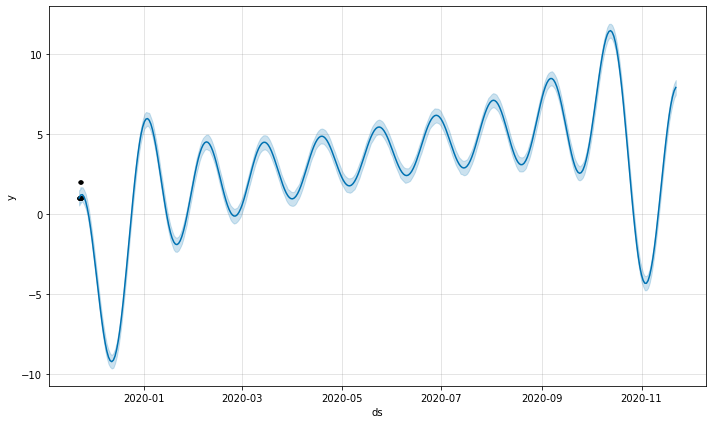

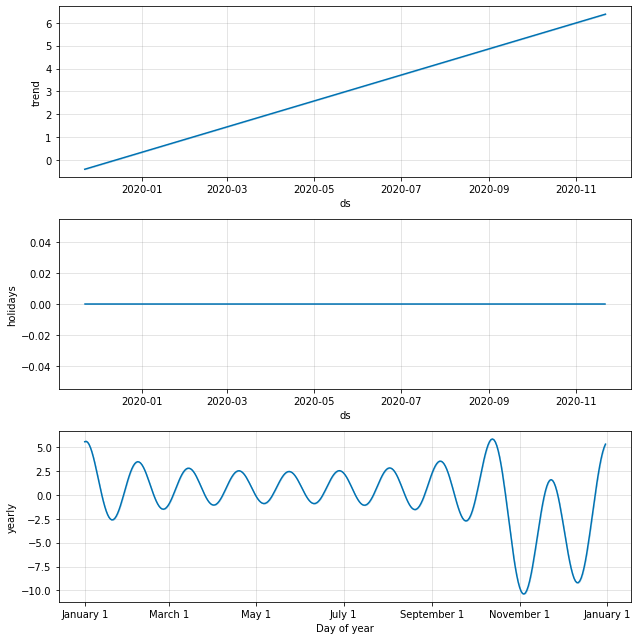

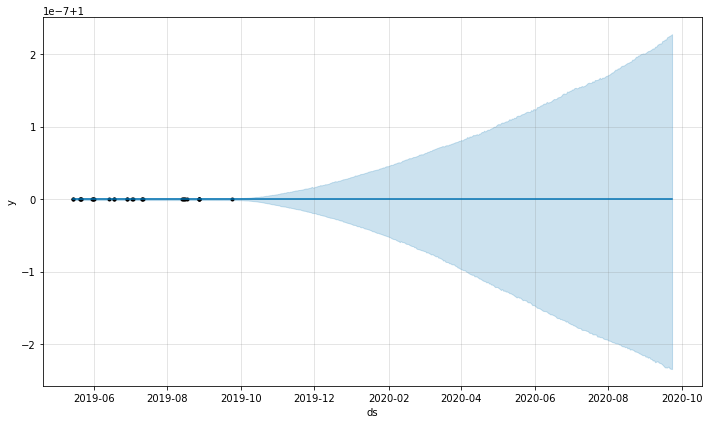

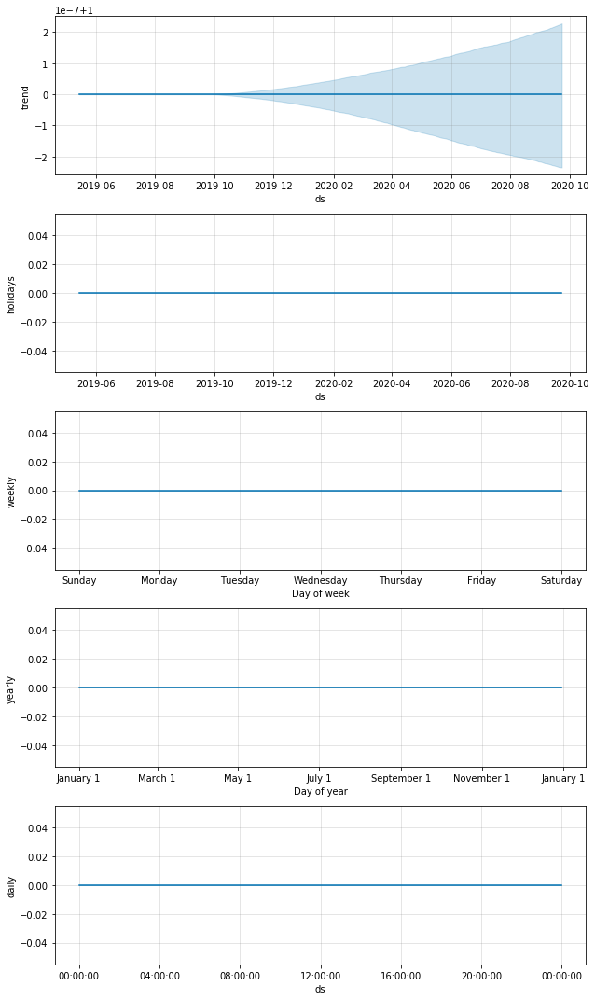

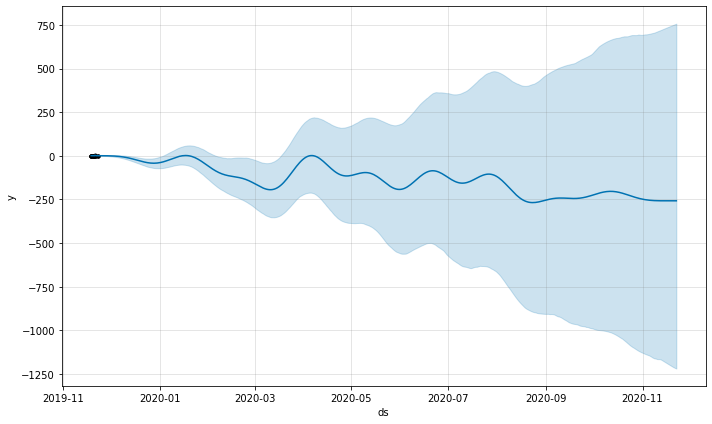

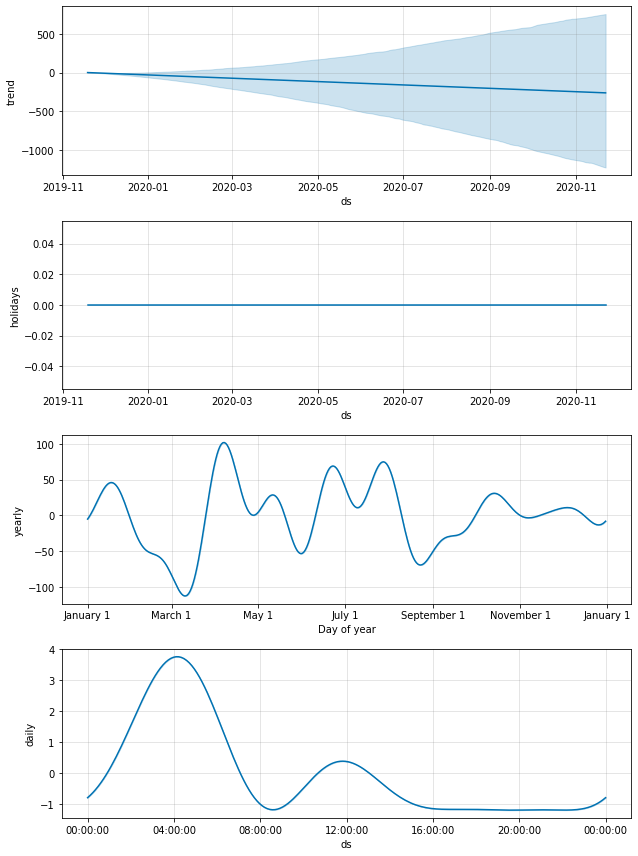

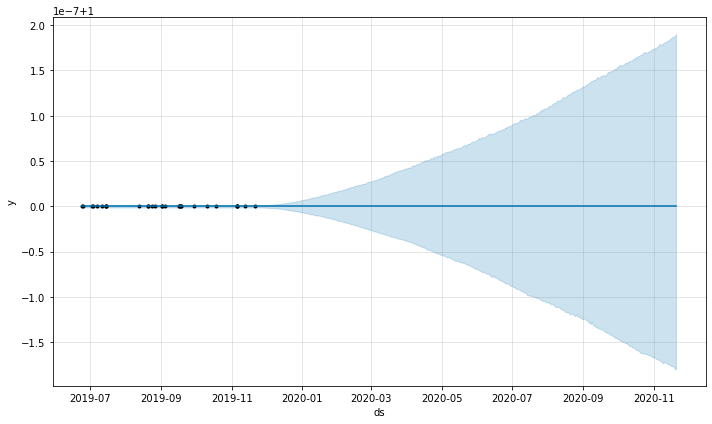

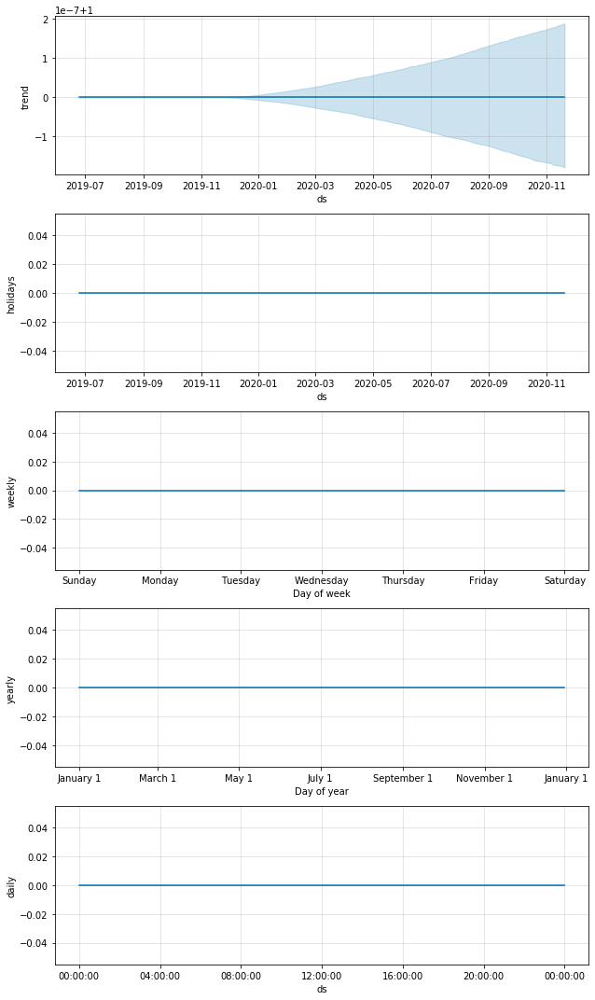

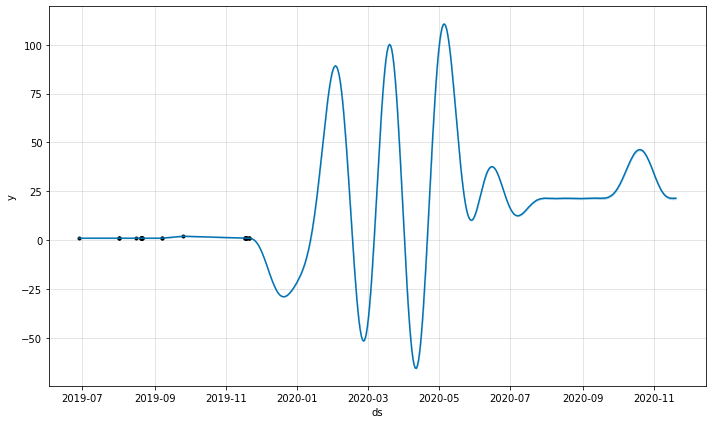

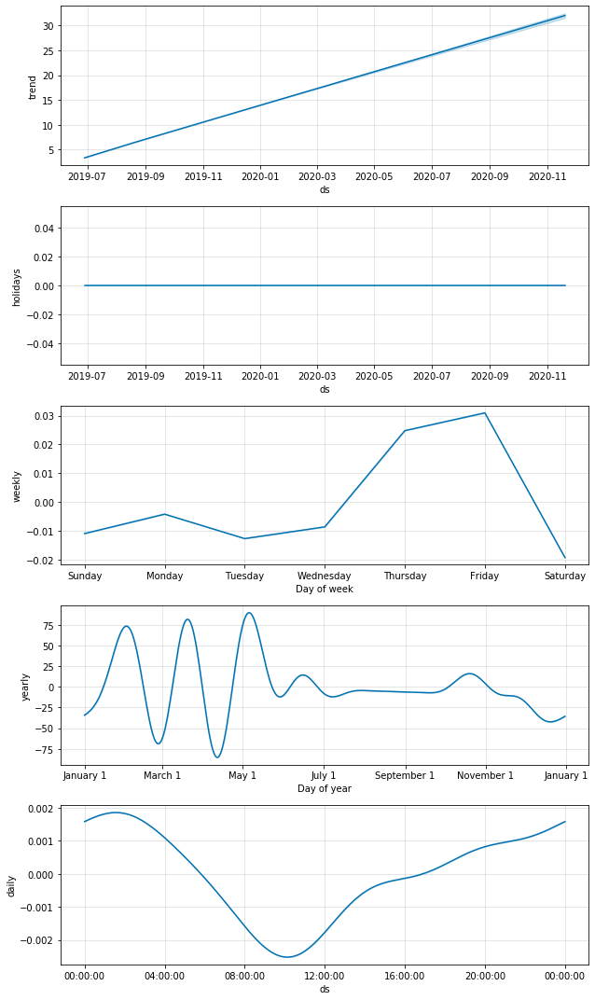

In [100]:
getcommitscsv(repos_df)
fbprocommits()
getcommitscsv(repos_dfmaterial)
fbprocommits()
getcommitscsv(repos_dfangularcli)
fbprocommits()
getcommitscsv(repos_dfangulargooglemaps)
fbprocommits()
getcommitscsv(repos_dfd3)
fbprocommits()





# 8.8

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 5.
INFO:fbprophet:n_changepoints greater than number of observations.Using 19.


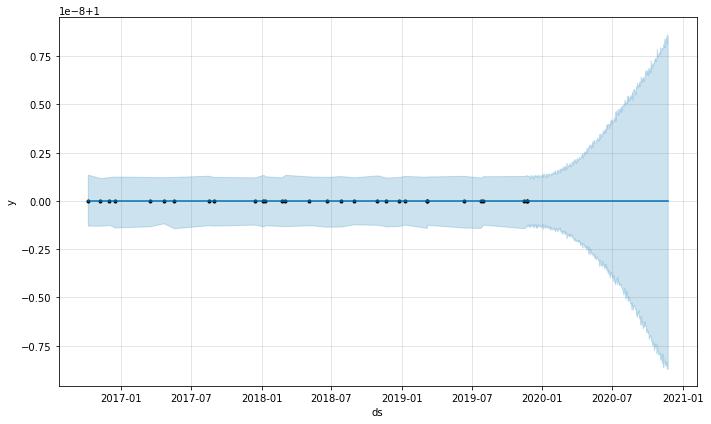

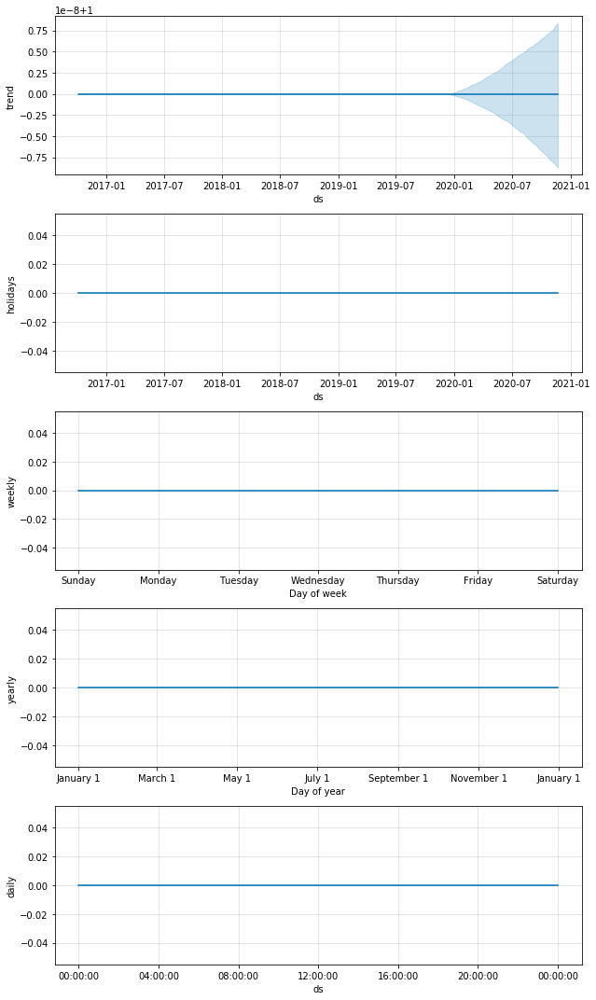

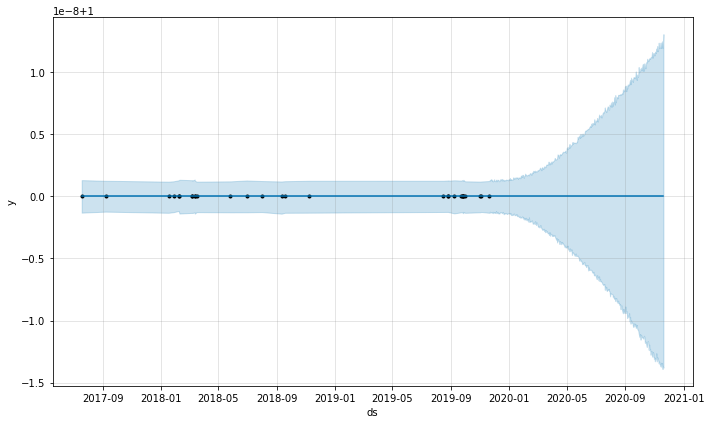

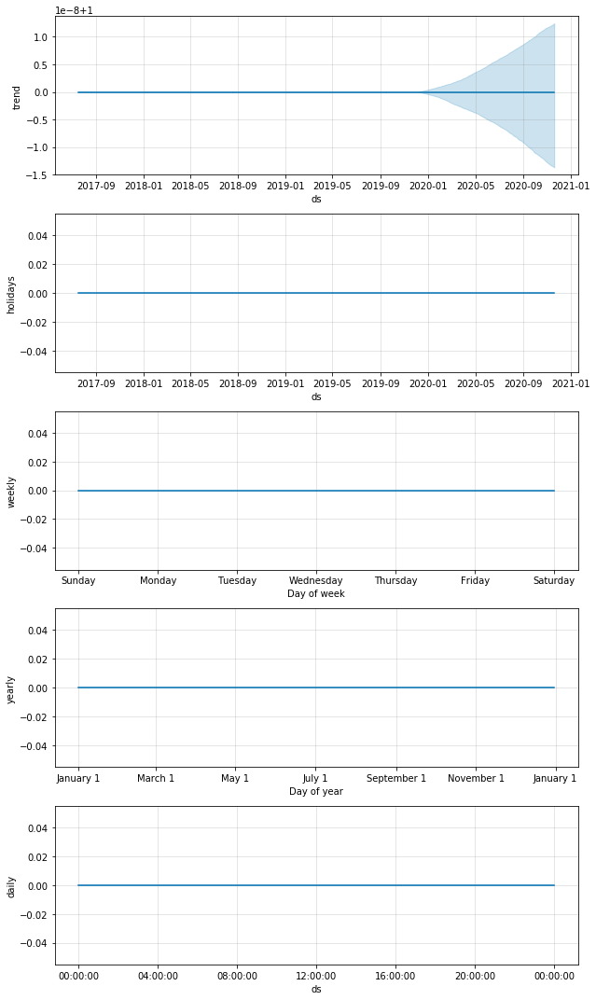

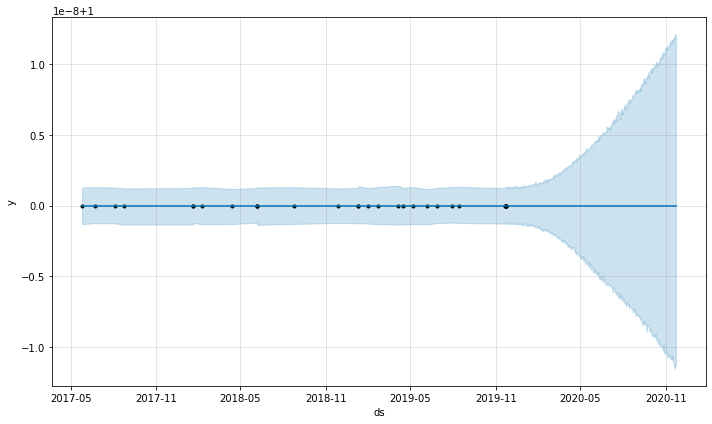

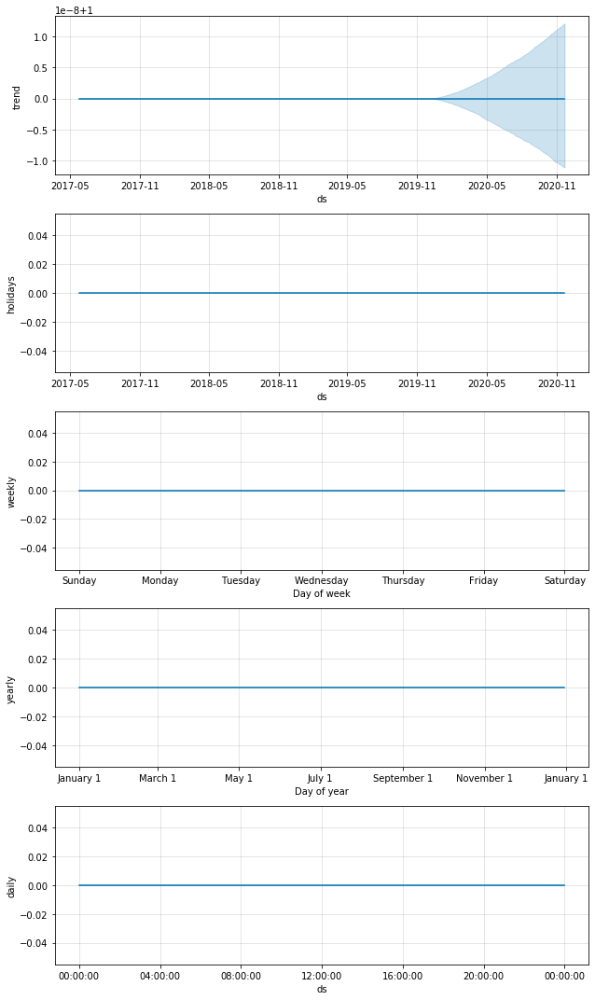

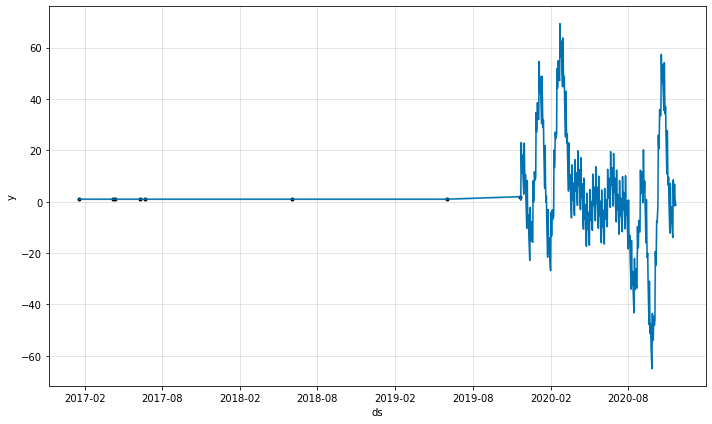

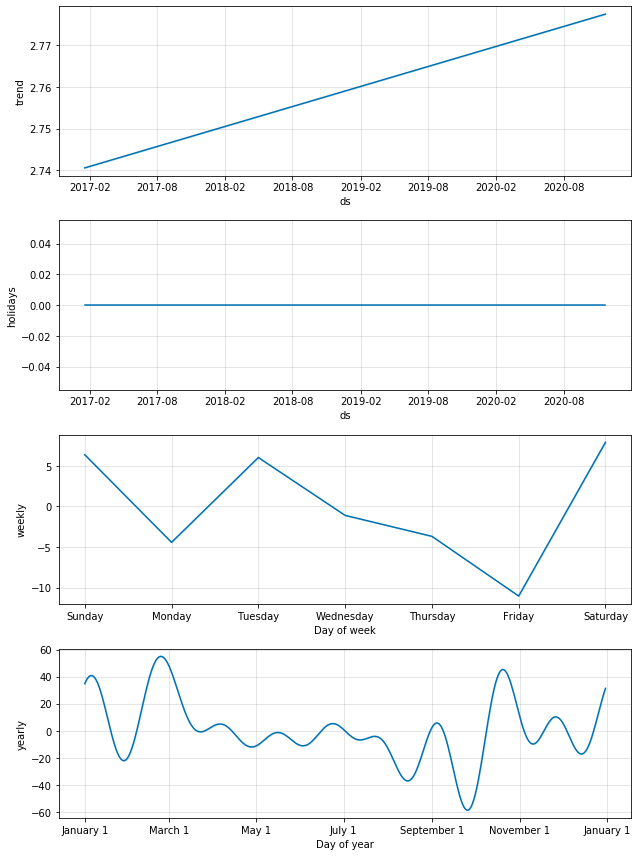

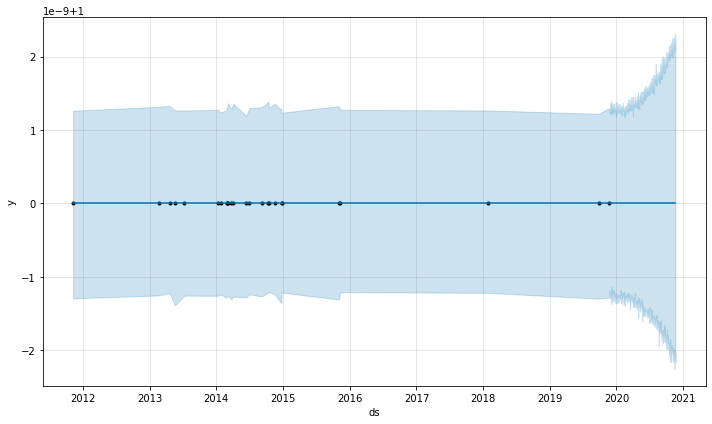

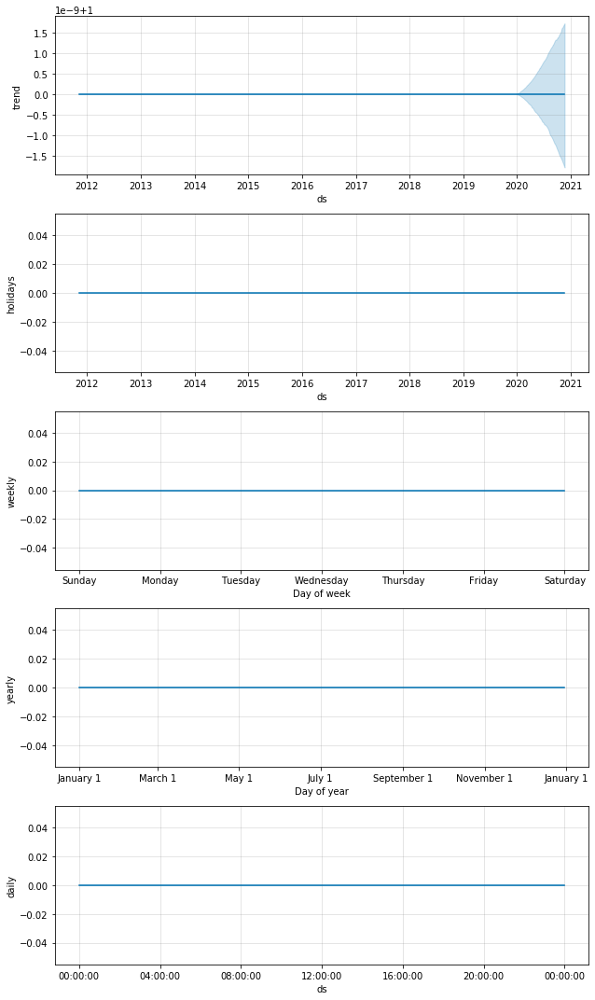

In [101]:
getbranchescsv(repos_df)
branchfb()
getbranchescsv(repos_dfmaterial)
branchfb()
getbranchescsv(repos_dfangularcli)
branchfb()
getbranchescsv(repos_dfangulargooglemaps)
branchfb()
getbranchescsv(repos_dfd3)
branchfb()




# 8.9 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 19.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 21.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:n_changepoint

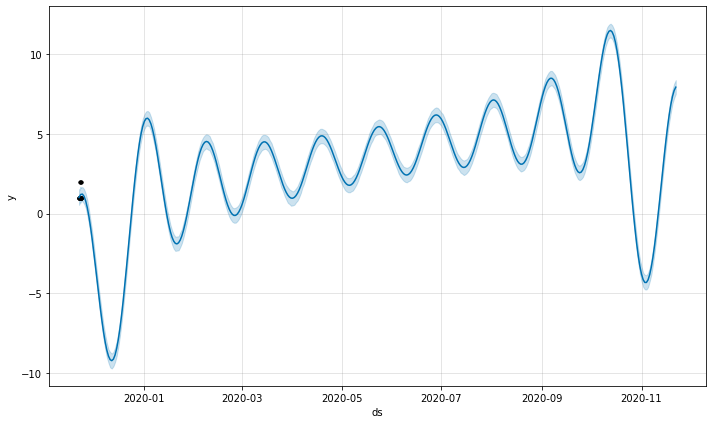

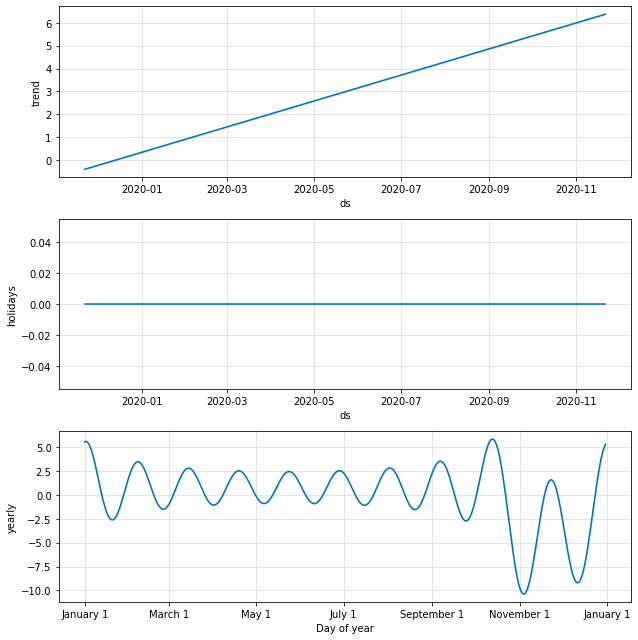

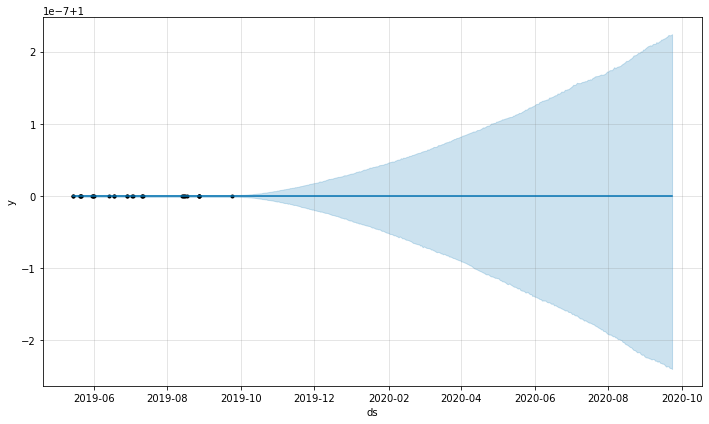

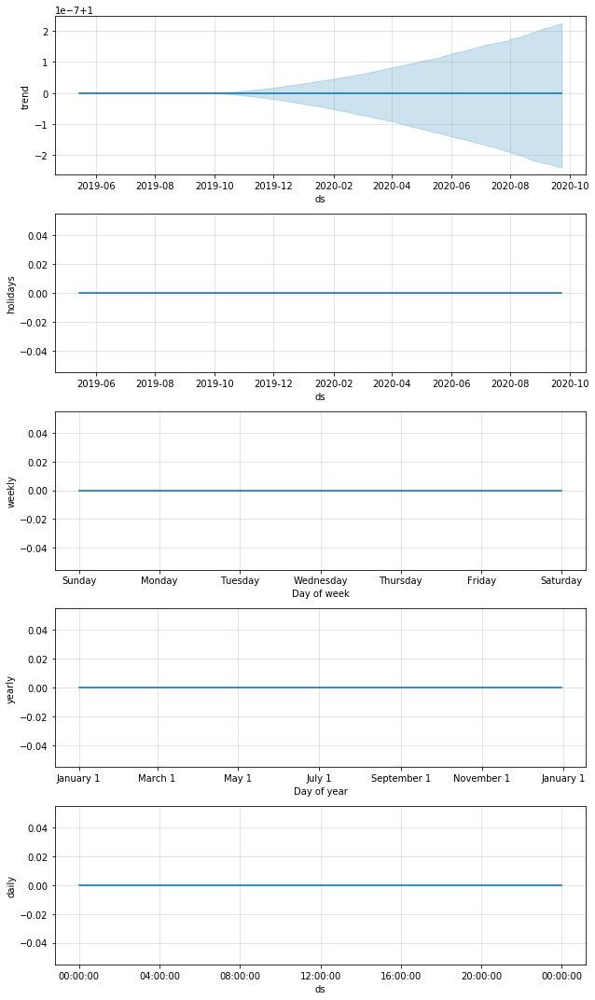

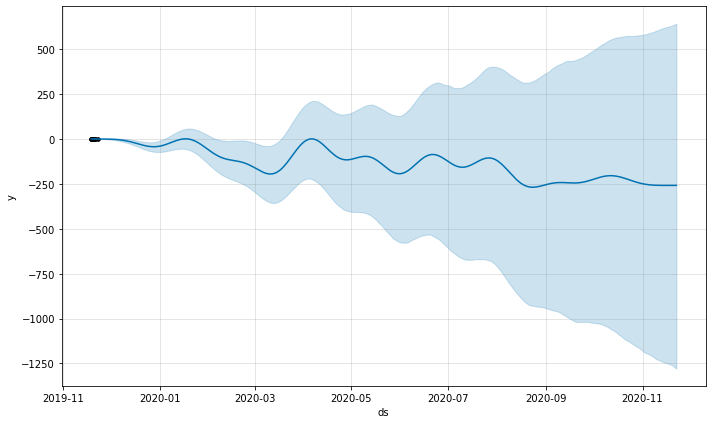

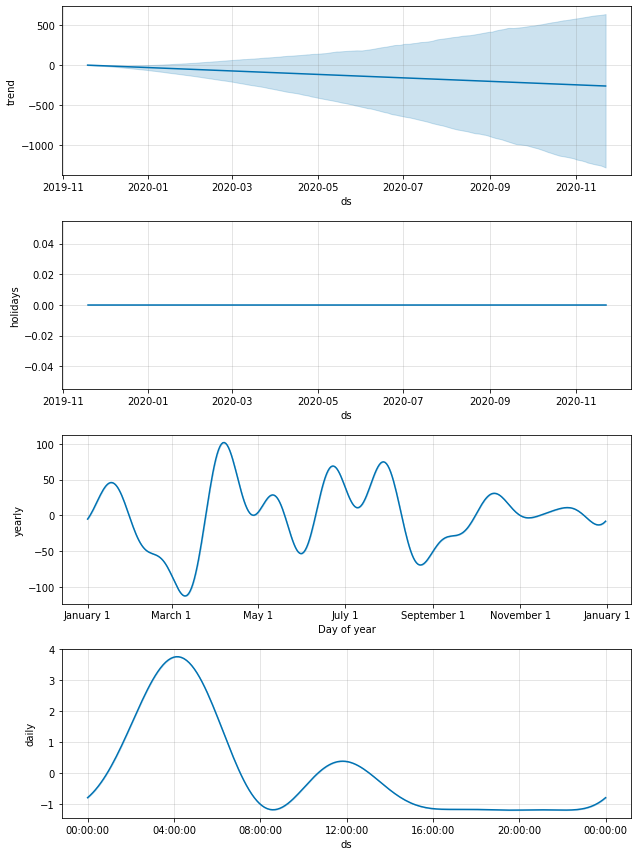

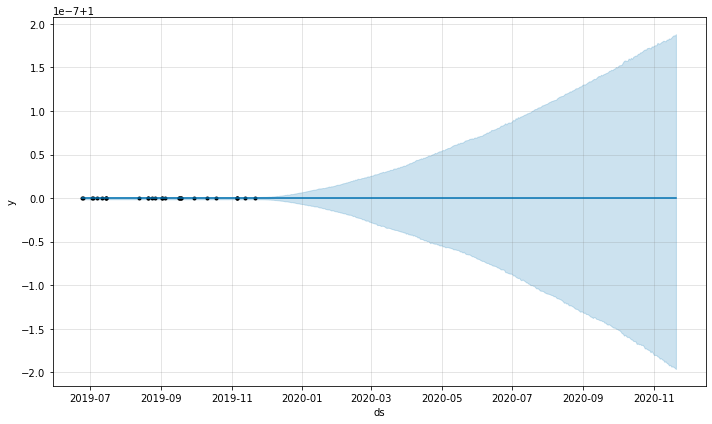

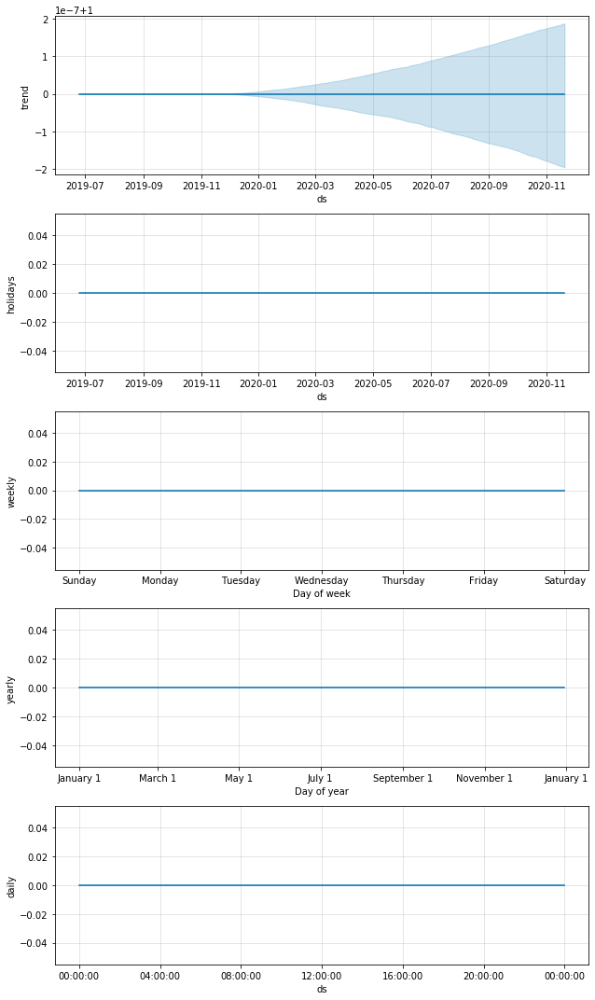

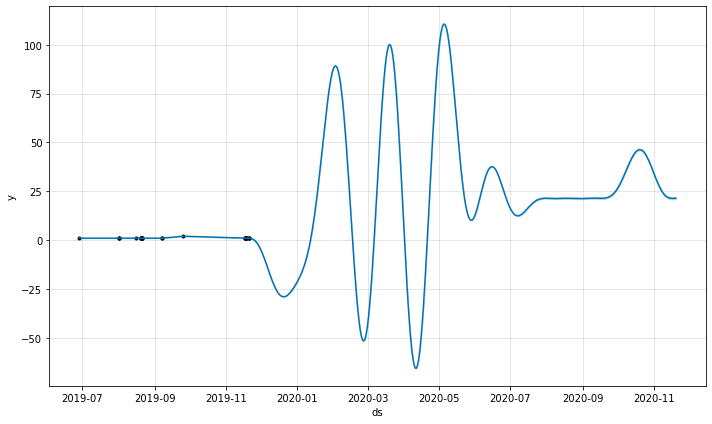

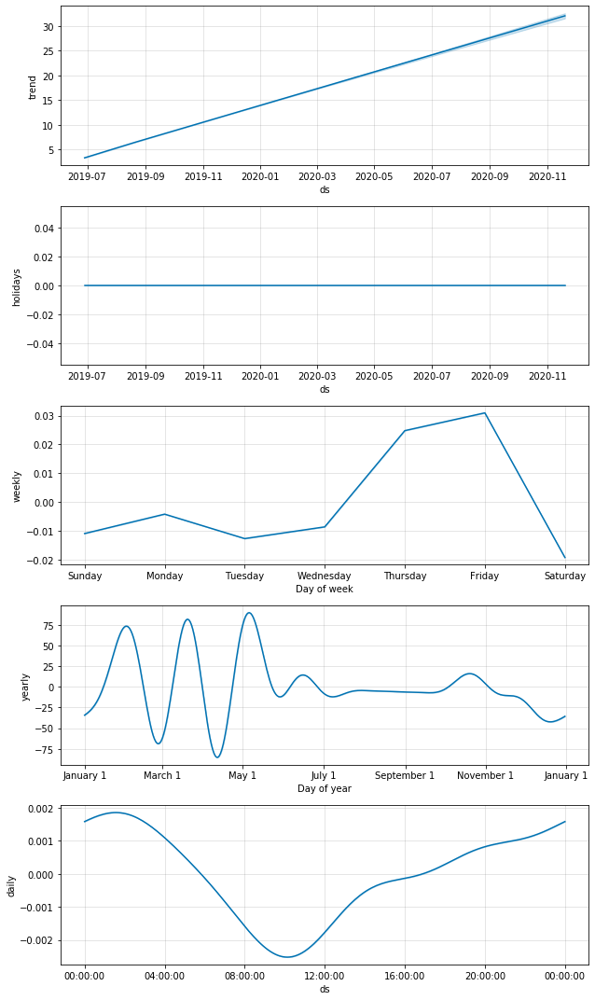

In [102]:
getreleasescv(repos_df)
releasecsv()
getreleasescv(repos_dfmaterial)
releasecsv()
getreleasescv(repos_dfangularcli)
releasecsv()
getreleasescv(repos_dfangulargooglemaps)
releasecsv()
getreleasescv(repos_dfd3)
releasecsv()


# 8.10

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 19.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 21.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.
INFO:fbprophet:n_changepoint

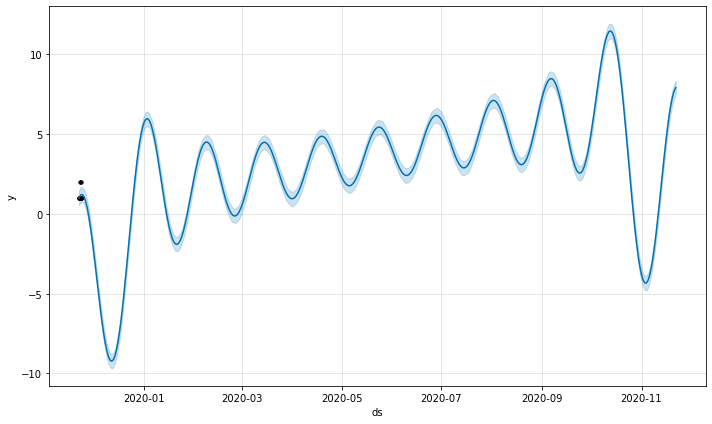

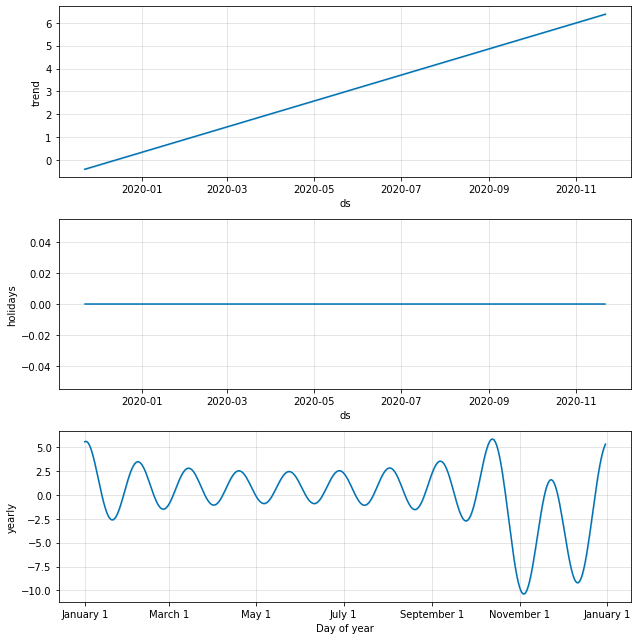

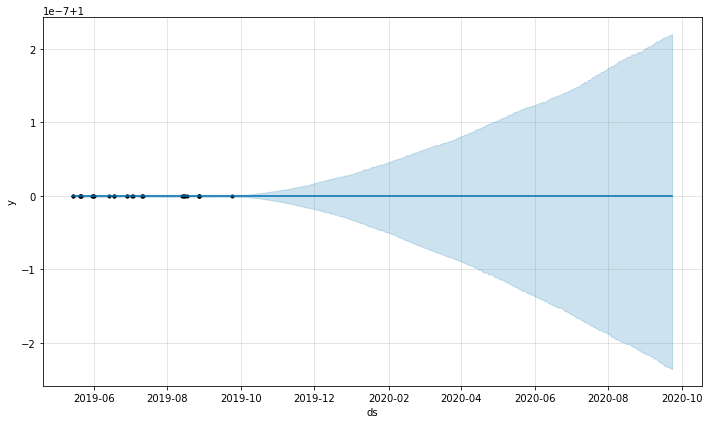

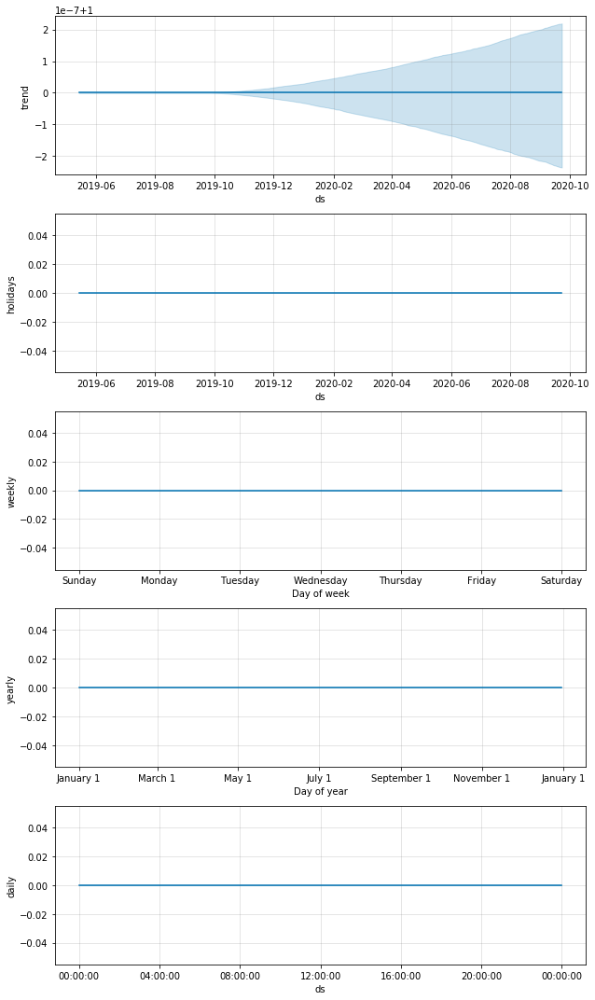

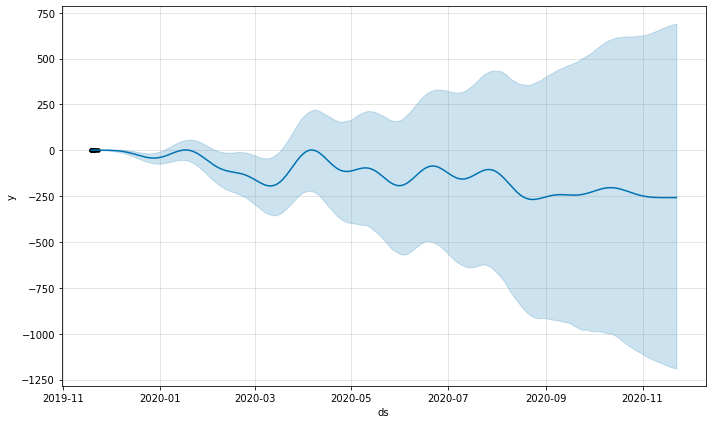

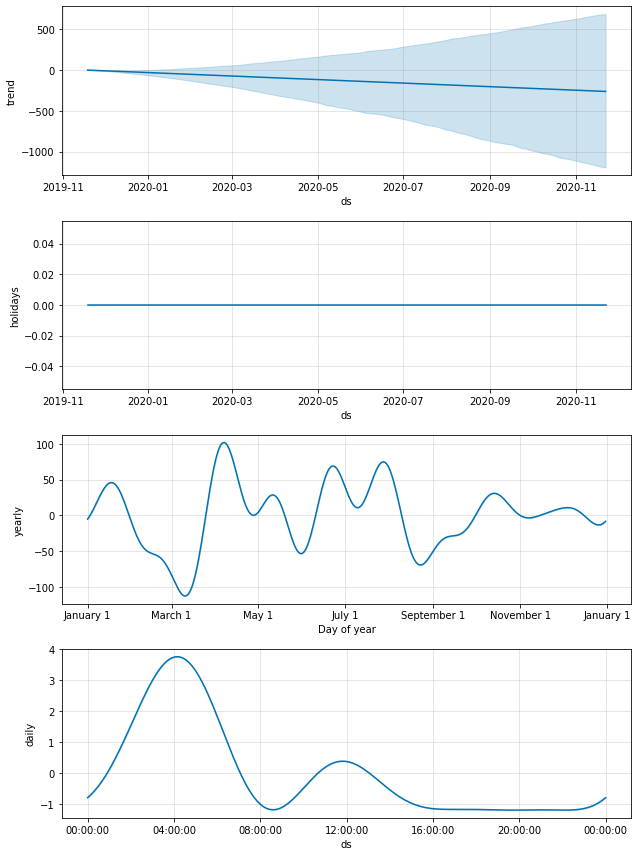

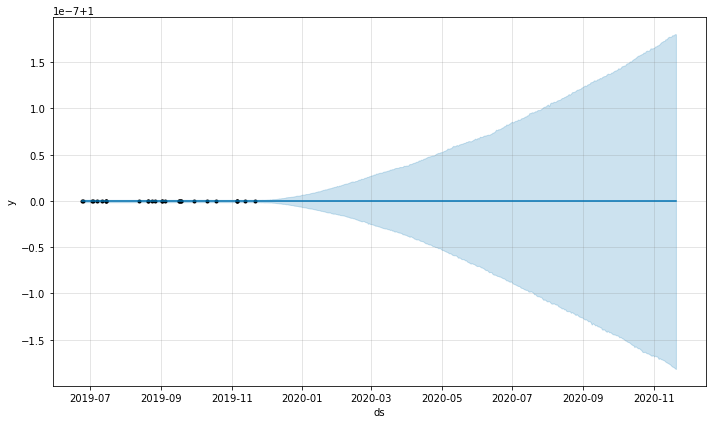

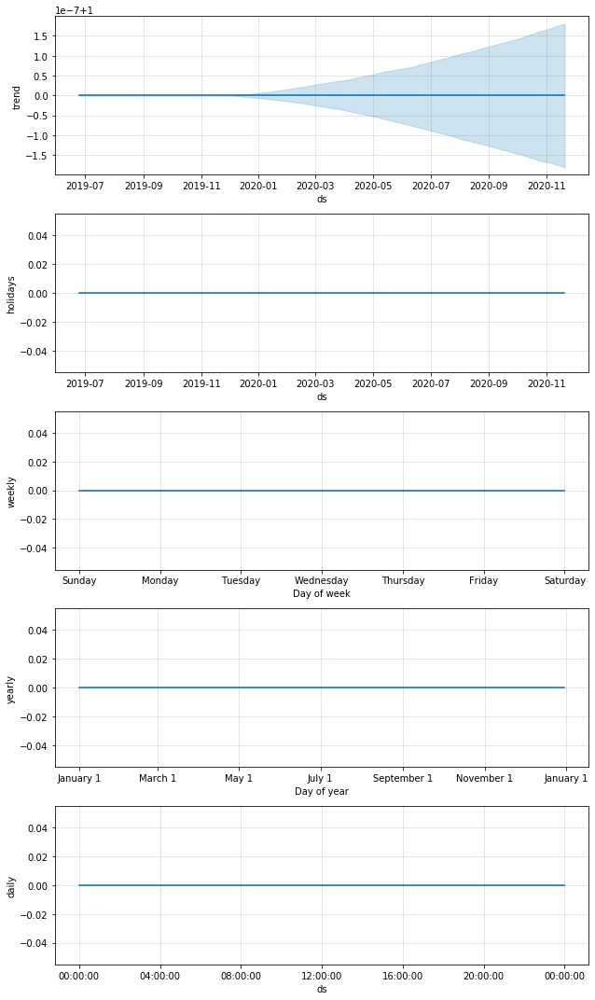

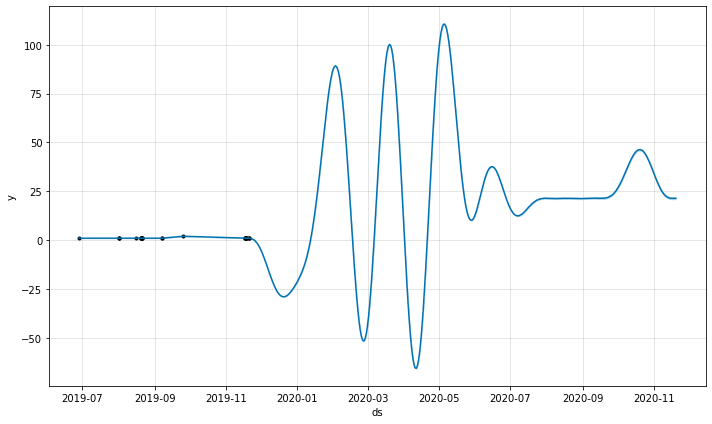

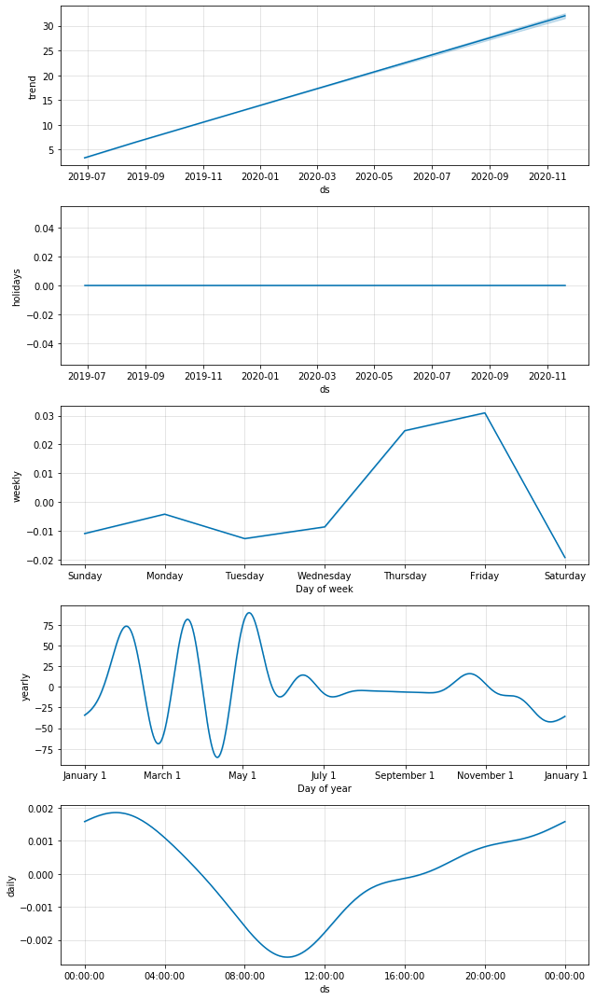

In [103]:
getcontricsv(repos_df)
contricsv()
getcontricsv(repos_dfmaterial)
contricsv()
getcontricsv(repos_dfangularcli)
contricsv()
getcontricsv(repos_dfangulargooglemaps)
contricsv()
getcontricsv(repos_dfd3)
contricsv()

### TensorFlow Time Series

In [104]:
from datetime import datetime as dt
import github3, json        
from pandas import DataFrame, Series
import numpy as np
import pandas as pd
import tensorflow as tf
import dateparser

In [105]:
def date_parser(date_str):
    t=dateparser.parse(date_str)
    t1=t.timetuple()
    return int(time.mktime(t1))

In [106]:
#Predict.py from GITHUB Tensorflow
def ar_train_and_predict(csv_file_name):

  # An autoregressive model, with periodicity handled as a time-based regression. Note that this requires windows of size 16 (input_window_size + output_window_size) for training.
  ar = tf.contrib.timeseries.ARRegressor(periodicities=100, input_window_size=2, output_window_size=2,num_features=1,
      # Use the (default) normal likelihood loss to adaptively fit the variance. SQUARED_LOSS overestimates variance when there are trends in the series.
      loss=tf.contrib.timeseries.ARModel.NORMAL_LIKELIHOOD_LOSS)
  return train_and_predict(ar, csv_file_name, training_steps=1000)

def train_and_predict(estimator, csv_file_name, training_steps):

    """A simple example of training and predicting."""

    # Read data in the default "time,value" CSV format with no header reader = tf.contrib.timeseries.CSVReader(csv_file_name)
    data = pd.read_csv(csv_file_name, header=0, parse_dates=['timestamp'], date_parser=date_parser)
    data['timestamp'] = data['timestamp'].apply(lambda x: date_parser(str(x)))
    reader = tf.contrib.timeseries.NumpyReader(data={tf.contrib.timeseries.TrainEvalFeatures.TIMES: data['timestamp'].values, tf.contrib.timeseries.TrainEvalFeatures.VALUES : data['value'].values})
    # Set up windowing and batching for training
    train_input_fn = tf.contrib.timeseries.RandomWindowInputFn(reader, batch_size=16, window_size=4)
    # Fit model parameters to data
    estimator.train(input_fn=train_input_fn, steps=training_steps)
    # Evaluate on the full dataset sequentially, collecting in-sample predictions for a qualitative evaluation. Note that this loads the whole dataset into memory. For quantitative evaluation, use RandomWindowChunker.
    evaluation_input_fn = tf.contrib.timeseries.WholeDatasetInputFn(reader)
    evaluation = estimator.evaluate(input_fn=evaluation_input_fn, steps=1)
    # Predict starting after the evaluation
    (predictions,) = tuple(estimator.predict(input_fn=tf.contrib.timeseries.predict_continuation_input_fn(evaluation, steps=200)))
    times = evaluation["times"][0]
    observed = evaluation["observed"][0, :, 0]
    mean = np.squeeze(np.concatenate([evaluation["mean"][0], predictions["mean"]], axis=0))
    variance = np.squeeze(np.concatenate([evaluation["covariance"][0], predictions["covariance"]], axis=0))
    all_times = np.concatenate([times, predictions["times"]], axis=0)
    upper_limit = mean + np.sqrt(variance)
    lower_limit = mean - np.sqrt(variance)
    return times, observed, all_times, mean, upper_limit, lower_limit

def make_plot(name, training_times, observed, all_times, mean, upper_limit, lower_limit):

  """Plot a time series in a new figure."""
  pyplot.figure()
  pyplot.plot(training_times, observed, "b", label="training series")
  pyplot.plot(all_times, mean, "r", label="forecast")
  pyplot.plot(all_times, upper_limit, "g", label="forecast upper bound")
  pyplot.plot(all_times, lower_limit, "g", label="forecast lower bound")
  pyplot.fill_between(all_times, lower_limit, upper_limit, color="grey", alpha="0.2")
  pyplot.axvline(training_times[-1], color="k", linestyle="--")
  pyplot.xlabel("time")
  pyplot.ylabel("observations")
  pyplot.legend(loc=0)
  pyplot.title(name)

#### Req 8.1 : The day of the week maximum number of issues created

In [107]:
#repo: angular
df = df_list_new[0].groupby('created_at')['created_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_created_output = pd.DataFrame(['ds','y'])
df_created_output = df_weekly_maximum[['ds_original','y']]
df_created_output.columns = ['ds','y']
issues_created_1 = df_created_output
issues_created_1 = issues_created_1[['ds','y']]
df = pd.DataFrame(issues_created_1)
issues_created_1.rename(columns={'ds':'timestamp'}, inplace=True)
issues_created_1.rename(columns={'y':'value'}, inplace=True)
print(issues_created_1)

                 timestamp value
ds_new                          
2017-11-20 0    2017-11-24    11
2017-11-27 4    2017-11-28    16
2017-12-04 12   2017-12-06    24
2017-12-11 20   2017-12-14    26
2017-12-18 27   2017-12-21    18
...                    ...   ...
2019-11-04 710  2019-11-07    17
           711  2019-11-08    17
2019-11-11 714  2019-11-12    14
2019-11-18 722  2019-11-20    10
           723  2019-11-21    10

[124 rows x 2 columns]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp6txj9o5n', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020672692748>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
Use Variable.read_value. Varia

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp6txj9o5n\model.ckpt.
INFO:tensorflow:loss = 1.7984248, step = 1
INFO:tensorflow:global_step/sec: 350.586
INFO:tensorflow:loss = 1.1543665, step = 101 (0.286 sec)
INFO:tensorflow:global_step/sec: 1116.91
INFO:tensorflow:loss = 1.3494349, step = 201 (0.090 sec)
INFO:tensorflow:global_step/sec: 1165.53
INFO:tensorflow:loss = 1.1398039, step = 301 (0.086 sec)
INFO:tensorflow:global_step/sec: 1165.36
INFO:tensorflow:loss = 1.1770414, step = 401 (0.085 sec)
INFO:tensorflow:global_step/sec: 1126.87
INFO:tensorflow:loss = 1.3612485, step = 501 (0.090 sec)
INFO:tensorflow:global_step/sec: 1033.68
INFO:tensorflow:loss = 1.1379147, step = 601 (0.096 sec)
INFO:tensorflow:global_step/sec: 992.758
INFO:tensorflow:loss 

INFO:tensorflow:Starting evaluation at 2019-11-24T22:57:01Z
INFO:tensorflow:Graph was finalized.
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp6txj9o5n\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:57:01
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.2495172, covariance = [[[  55.031097]
  [  84.60054 ]
  [ 174.72787 ]
  [ 180.6509  ]
  [  31.41188 ]
  [  36.86752 ]
  [  66.3757  ]
  [  77.97069 ]
  [ 132.54388 ]
  [ 121.85924 ]
  [ 248.9125  ]
  [ 235.81392 ]
  [ 109.890144]
  [ 132.22093 ]
  [  39.13198 ]
  [  40.3892  ]
  [  66.91421 ]
  [  81.413635]
  [  41.409164]
  [  54.654465]
  [  52.426735]
  [  65.279755]
  [  87.500725]
  [ 115.588104]
  [  82.68886 ]
  [  85.41865 ]
  [1366.8058  ]
  [1854.1475  ]


INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp6txj9o5n\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


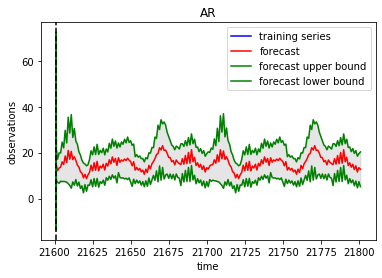

In [108]:
issues_created_1.to_csv("issues_created_1.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_1.csv"))
pyplot.show()

In [109]:
#repo: material
df = df_list_new[1].groupby('created_at')['created_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_created_output = pd.DataFrame(['ds','y'])
df_created_output = df_weekly_maximum[['ds_original','y']]
df_created_output.columns = ['ds','y']
issues_created_2 = df_created_output
issues_created_2 = issues_created_2[['ds','y']]
df = pd.DataFrame(issues_created_2)
issues_created_2.rename(columns={'ds':'timestamp'}, inplace=True)
issues_created_2.rename(columns={'y':'value'}, inplace=True)
print(issues_created_2)

                 timestamp value
ds_new                          
2017-11-20 0    2017-11-24     1
           1    2017-11-27     1
2017-11-27 2    2017-11-29     2
2017-12-04 8    2017-12-11     4
2017-12-11 10   2017-12-13     2
...                    ...   ...
2019-10-14 283  2019-10-16     1
2019-10-21 285  2019-10-24     2
2019-11-11 287  2019-11-12     1
           288  2019-11-13     1
2019-11-18 289  2019-11-21     2

[156 rows x 2 columns]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpnju31yu0', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066EF1AEC8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done ca

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpnju31yu0\model.ckpt.
INFO:tensorflow:loss = 1.3423437, step = 1
INFO:tensorflow:global_step/sec: 427.19
INFO:tensorflow:loss = 1.2291522, step = 101 (0.235 sec)
INFO:tensorflow:global_step/sec: 1126.6
INFO:tensorflow:loss = 1.2683005, step = 201 (0.089 sec)
INFO:tensorflow:global_step/sec: 1165.46
INFO:tensorflow:loss = 1.280691, step = 301 (0.086 sec)
INFO:tensorflow:global_step/sec: 1127.02
INFO:tensorflow:loss = 1.3216734, step = 401 (0.089 sec)
INFO:tensorflow:global_step/sec: 1114.09
INFO:tensorflow:loss = 1.2842054, step = 501 (0.090 sec)
INFO:tensorflow:global_step/sec: 1180.15
INFO:tensorflow:loss = 1.2175908, step = 601 (0.085 sec)
INFO:tensorflow:global_step/sec: 1152.5
INFO:tensorflow:loss = 1.1605535, step = 701 (0.089 sec)
INFO:tensorflow:global_step/sec: 1182.22
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpnju31yu0\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:57:16
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.3117656, covariance = [[[1.6544679]
  [1.8724204]
  [2.7110229]
  [2.423058 ]
  [1.9257826]
  [2.0279312]
  [1.8534423]
  [1.9908673]
  [2.2415895]
  [2.1963577]
  [1.8892661]
  [2.0093138]
  [1.9257826]
  [2.0279312]
  [1.9257826]
  [2.0279312]
  [1.8534423]
  [1.9908673]
  [1.9257826]
  [2.0279312]
  [2.2415895]
  [2.1963577]
  [1.8892661]
  [2.0093138]
  [2.6596172]
  [2.400813 ]
  [1.5621262]
  [1.8213233]
  [1.6544679]
  [1.8724204]
  [1.6544679]
  [1.8724204]
  [2.3290796]
  [2.237247 ]
  [1.8534423]
  [1.9908673]
  [1.9257826]
  [2.0279312]
  [1.7838196]
  [1.9544808]
  [2.6091857]
  [2.3787723]
  [2.19

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


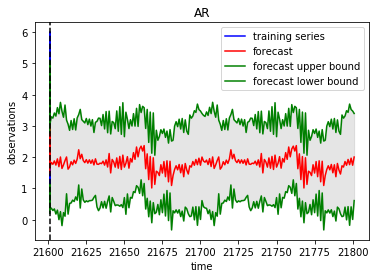

In [110]:
issues_created_2.to_csv("issues_created_2.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_2.csv"))
pyplot.show()

In [111]:
#repo: angular-cli
df = df_list_new[2].groupby('created_at')['created_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_created_output = pd.DataFrame(['ds','y'])
df_created_output = df_weekly_maximum[['ds_original','y']]
df_created_output.columns = ['ds','y']
issues_created_3 = df_created_output
issues_created_3 = issues_created_3[['ds','y']]
df = pd.DataFrame(issues_created_3)
issues_created_3.rename(columns={'ds':'timestamp'}, inplace=True)
issues_created_3.rename(columns={'y':'value'}, inplace=True)
print(issues_created_3)

                 timestamp value
ds_new                          
2017-11-20 0    2017-11-24    14
2017-11-27 7    2017-12-01    13
2017-12-04 13   2017-12-07    22
2017-12-11 21   2017-12-15    14
2017-12-18 30   2017-12-24    12
...                    ...   ...
2019-11-04 684  2019-11-07     9
2019-11-11 689  2019-11-12     6
           690  2019-11-13     6
           691  2019-11-14     6
2019-11-18 698  2019-11-21    10

[132 rows x 2 columns]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpe36ep3lf', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066FFDCFC8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done ca

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpe36ep3lf\model.ckpt.
INFO:tensorflow:loss = 1.2563207, step = 1
INFO:tensorflow:global_step/sec: 397.887
INFO:tensorflow:loss = 1.1997614, step = 101 (0.251 sec)
INFO:tensorflow:global_step/sec: 1165.9
INFO:tensorflow:loss = 1.1181421, step = 201 (0.087 sec)
INFO:tensorflow:global_step/sec: 1114.08
INFO:tensorflow:loss = 1.0808196, step = 301 (0.089 sec)
INFO:tensorflow:global_step/sec: 1179.61
INFO:tensorflow:loss = 1.2396878, step = 401 (0.086 sec)
INFO:tensorflow:global_step/sec: 1002.43
INFO:tensorflow:loss = 1.6976737, step = 501 (0.100 sec)
INFO:tensorflow:global_step/sec: 955.142
INFO:tensorflow:loss = 0.9980345, step = 601 (0.105 sec)
INFO:tensorflow:global_step/sec: 856.976
INFO:tensorflow:loss = 1.3949599, step = 701 (0.118 sec)
INFO:tensorflow:global_step/sec: 973.244
INFO:te

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpe36ep3lf\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:57:25
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.2470655, covariance = [[[ 143.62881 ]
  [ 158.22299 ]
  [ 303.0289  ]
  [ 401.8367  ]
  [ 120.65851 ]
  [ 124.130646]
  [ 111.09931 ]
  [ 132.3883  ]
  [ 165.41946 ]
  [ 206.94191 ]
  [2313.0718  ]
  [5298.918   ]
  [ 354.8121  ]
  [ 518.84106 ]
  [ 181.97557 ]
  [ 232.13823 ]
  [ 170.97209 ]
  [ 201.67879 ]
  [  95.23279 ]
  [  84.606155]
  [ 153.43303 ]
  [ 150.2772  ]
  [ 306.9474  ]
  [ 480.74902 ]
  [ 159.46251 ]
  [ 257.33545 ]
  [ 859.00635 ]
  [2088.6042  ]
  [ 107.29883 ]
  [ 350.55695 ]
  [ 235.25739 ]
  [ 277.43845 ]
  [ 185.00455 ]
  [ 229.16724 ]
  [ 111.50666 ]
  [ 109.24125 ]
  [ 146.01952 ]
  [

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpe36ep3lf\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


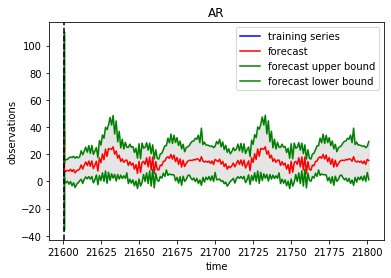

In [112]:
issues_created_3.to_csv("issues_created_3.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_3.csv"))
pyplot.show()

In [113]:
#repo: angular-google-maps
df = df_list_new[3].groupby('created_at')['created_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_created_output = pd.DataFrame(['ds','y'])
df_created_output = df_weekly_maximum[['ds_original','y']]
df_created_output.columns = ['ds','y']
issues_created_4 = df_created_output
issues_created_4 = issues_created_4[['ds','y']]
df = pd.DataFrame(issues_created_4)
issues_created_4.rename(columns={'ds':'timestamp'}, inplace=True)
issues_created_4.rename(columns={'y':'value'}, inplace=True)
print(issues_created_4)

                 timestamp value
ds_new                          
2017-11-20 0    2017-11-24     1
           1    2017-11-26     1
           2    2017-11-27     1
2017-11-27 3    2017-11-29     2
           5    2017-12-02     2
...                    ...   ...
2019-10-28 274  2019-11-04     3
2019-11-04 275  2019-11-09     1
           276  2019-11-11     1
2019-11-11 278  2019-11-16     2
2019-11-18 283  2019-11-21     2

[136 rows x 2 columns]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpfupnfj5y', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066F9ACF08>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done ca

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpfupnfj5y\model.ckpt.
INFO:tensorflow:loss = 1.671178, step = 1
INFO:tensorflow:global_step/sec: 378.37
INFO:tensorflow:loss = 1.3215374, step = 101 (0.266 sec)
INFO:tensorflow:global_step/sec: 992.744
INFO:tensorflow:loss = 1.2572908, step = 201 (0.100 sec)
INFO:tensorflow:global_step/sec: 964.108
INFO:tensorflow:loss = 1.4834778, step = 301 (0.105 sec)
INFO:tensorflow:global_step/sec: 911.217
INFO:tensorflow:loss = 1.3316026, step = 401 (0.110 sec)
INFO:tensorflow:global_step/sec: 742.915
INFO:tensorflow:loss = 1.4268129, step = 501 (0.134 sec)
INFO:tensorflow:global_step/sec: 1044.47
INFO:tensorflow:loss = 1.2438523, step = 601 (0.096 sec)
INFO:tensorflow:global_step/sec: 1152.51
INFO:tensorflow:loss = 1.3354087, step = 701 (0.087 sec)
INFO:tensorflow:global_step/sec: 1165.65
INFO:ten

INFO:tensorflow:Starting evaluation at 2019-11-24T22:57:33Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpfupnfj5y\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:57:34
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.3363417, covariance = [[[1.6030335]
  [2.1884   ]
  [1.946562 ]
  [2.32077  ]
  [1.4816519]
  [1.7045527]
  [1.6030335]
  [2.1884   ]
  [1.5370182]
  [1.0966886]
  [2.363708 ]
  [2.461147 ]
  [1.4816519]
  [1.7045527]
  [2.8702483]
  [2.6100152]
  [2.4520347]
  [1.5834725]
  [2.0193007]
  [1.4931556]
  [1.6629354]
  [1.4079902]
  [1.7991685]
  [1.8076564]
  [1.7991685]
  [1.8076564]
  [2.977503 ]
  [1.6792525]
  [1.4816519]
  [1.7045527]
  [2.652913 ]
  [2.0329506]
  [1.946562 ]
  [2.32077  ]
  [1.6629354]
  [1.4079902]
  [1.3694614]
  [1.3276823]
  [

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpfupnfj5y\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


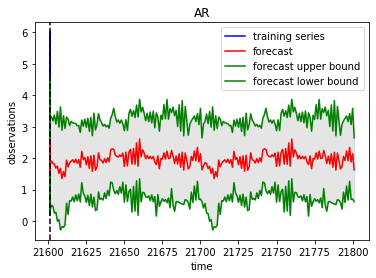

In [114]:
issues_created_4.to_csv("issues_created_4.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_4.csv"))
pyplot.show()

In [115]:
#repo: d3
df = df_list_new[4].groupby('created_at')['created_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_created_output = pd.DataFrame(['ds','y'])
df_created_output = df_weekly_maximum[['ds_original','y']]
df_created_output.columns = ['ds','y']
issues_created_5 = df_created_output
issues_created_5 = issues_created_5[['ds','y']]
df = pd.DataFrame(issues_created_5)
issues_created_5.rename(columns={'ds':'timestamp'}, inplace=True)
issues_created_5.rename(columns={'y':'value'}, inplace=True)
print(issues_created_5)

                timestamp value
ds_new                         
2017-11-27 1   2017-12-01     2
2017-12-04 2   2017-12-08     1
2017-12-11 3   2017-12-13     1
           4   2017-12-18     1
2018-01-01 5   2018-01-02     1
           6   2018-01-05     1
2018-01-08 7   2018-01-12     1
2018-01-15 8   2018-01-16     2
2018-01-22 13  2018-01-29     3
2018-01-29 14  2018-01-30     1
           15  2018-02-04     1
           16  2018-02-05     1
2018-02-05 17  2018-02-07     1
           18  2018-02-08     1
2018-02-12 20  2018-02-19     2
2018-02-19 21  2018-02-26     1
2018-02-26 22  2018-02-28     1
           23  2018-03-01     1
           24  2018-03-02     1
2018-03-05 25  2018-03-06     1
           26  2018-03-07     1
           27  2018-03-08     1
           28  2018-03-09     1
2018-03-12 30  2018-03-16     2
2018-03-19 32  2018-03-20     1
           33  2018-03-22     1
           34  2018-03-23     1
2018-03-26 35  2018-03-27     1
           36  2018-03-28     1
        

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpa34juvx1', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066C047A88>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done ca

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpa34juvx1\model.ckpt.
INFO:tensorflow:loss = 1.5186119, step = 1
INFO:tensorflow:global_step/sec: 410.599
INFO:tensorflow:loss = 1.0938543, step = 101 (0.244 sec)
INFO:tensorflow:global_step/sec: 879.281
INFO:tensorflow:loss = 1.0378649, step = 201 (0.114 sec)
INFO:tensorflow:global_step/sec: 1127.02
INFO:tensorflow:loss = 1.1418856, step = 301 (0.090 sec)
INFO:tensorflow:global_step/sec: 1233.35
INFO:tensorflow:loss = 1.2227123, step = 401 (0.080 sec)
INFO:tensorflow:global_step/sec: 776.988
INFO:tensorflow:loss = 1.1463343, step = 501 (0.130 sec)
INFO:tensorflow:global_step/sec: 993.195
INFO:tensorflow:loss = 1.5131196, step = 601 (0.100 sec)
INFO:tensorflow:global_step/sec: 1055.45
INFO:tensorflow:loss = 1.350027, step = 701 (0.095 sec)
INFO:tensorflow:global_step/sec: 1208.04
INFO:te

INFO:tensorflow:Starting evaluation at 2019-11-24T22:57:47Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpa34juvx1\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:57:47
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.1636176, covariance = [[[3.9344770e-01]
  [5.8785224e-01]
  [3.9344770e-01]
  [5.8785224e-01]
  [3.9344770e-01]
  [5.8785224e-01]
  [4.7088284e-02]
  [9.5226183e-05]
  [3.9344770e-01]
  [5.8785224e-01]
  [3.9344770e-01]
  [5.8785224e-01]
  [8.9498883e-01]
  [5.0332267e-02]
  [3.9344770e-01]
  [5.8785224e-01]
  [3.9344770e-01]
  [5.8785224e-01]
  [3.9344770e-01]
  [5.8785224e-01]
  [3.9344770e-01]
  [5.8785224e-01]
  [9.1002136e-03]
  [1.2989718e-02]
  [3.9344770e-01]
  [5.8785224e-01]
  [3.9344770e-01]
  [5.8785224e-01]
  [3.9344770e-01]
  [5.8785224e

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpa34juvx1\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


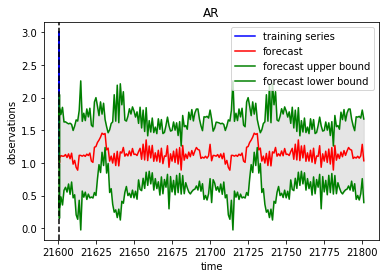

In [116]:
issues_created_5.to_csv("issues_created_5.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_5.csv"))
pyplot.show()

#### Req 8.2 : The day of the week maximum number of issues closed

In [117]:
#repo: angular
df = df_list_new[0].groupby('closed_at')['closed_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_closed_output = pd.DataFrame(['ds','y'])
df_closed_output = df_weekly_maximum[['ds_original','y']]
df_closed_output.columns = ['ds','y']
issues_closed_1 = df_closed_output
issues_closed_1 = issues_closed_1[['ds','y']]
df = pd.DataFrame(issues_closed_1)
issues_closed_1.rename(columns={'ds':'timestamp'}, inplace=True)
issues_closed_1.rename(columns={'y':'value'}, inplace=True)
print(issues_closed_1)

                 timestamp value
ds_new                          
2017-11-20 2    2017-11-27    10
2017-11-27 3    2017-11-28     9
2017-12-04 10   2017-12-05    18
2017-12-11 17   2017-12-12    13
2017-12-18 22   2017-12-19    16
...                    ...   ...
2019-10-28 643  2019-10-31     8
2019-11-04 648  2019-11-06    10
           650  2019-11-08    10
2019-11-11 654  2019-11-13    14
2019-11-18 659  2019-11-19    23

[111 rows x 2 columns]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpruzxk43_', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000206700D2FC8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done ca

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpruzxk43_\model.ckpt.
INFO:tensorflow:loss = 1.3816254, step = 1
INFO:tensorflow:global_step/sec: 375.533
INFO:tensorflow:loss = 1.362042, step = 101 (0.268 sec)
INFO:tensorflow:global_step/sec: 1139.39
INFO:tensorflow:loss = 1.3260968, step = 201 (0.087 sec)
INFO:tensorflow:global_step/sec: 1165.92
INFO:tensorflow:loss = 1.2580662, step = 301 (0.085 sec)
INFO:tensorflow:global_step/sec: 964.113
INFO:tensorflow:loss = 1.3125927, step = 401 (0.104 sec)
INFO:tensorflow:global_step/sec: 1179.61
INFO:tensorflow:loss = 1.2745061, step = 501 (0.085 sec)
INFO:tensorflow:global_step/sec: 1113.75
INFO:tensorflow:loss = 1.3660486, step = 601 (0.090 sec)
INFO:tensorflow:global_step/sec: 1202.02
INFO:tensorflow:loss = 1.3129442, step = 701 (0.083 sec)
INFO:tensorflow:global_step/sec: 1114.06
INFO:te

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpruzxk43_\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:58:03
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.3445617, covariance = [[[ 93.385994]
  [ 98.873795]
  [ 92.53664 ]
  [ 95.64432 ]
  [ 93.6645  ]
  [ 98.304085]
  [ 90.06869 ]
  [ 85.91272 ]
  [ 90.1255  ]
  [ 84.82    ]
  [ 91.12495 ]
  [ 84.3806  ]
  [ 92.52496 ]
  [ 95.88949 ]
  [ 93.31536 ]
  [100.40429 ]
  [ 93.47569 ]
  [102.41442 ]
  [ 87.355064]
  [ 74.361824]
  [ 91.10901 ]
  [ 89.439445]
  [ 91.58391 ]
  [ 89.780266]
  [ 89.50437 ]
  [ 82.83953 ]
  [ 88.81343 ]
  [ 77.908585]
  [ 91.7297  ]
  [ 91.81245 ]
  [ 91.69499 ]
  [ 92.52032 ]
  [ 93.143555]
  [ 98.685936]
  [ 91.52618 ]
  [ 90.9369  ]
  [ 85.11114 ]
  [ 65.44154 ]
  [ 92.11485 ]
  [ 94.069

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpruzxk43_\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


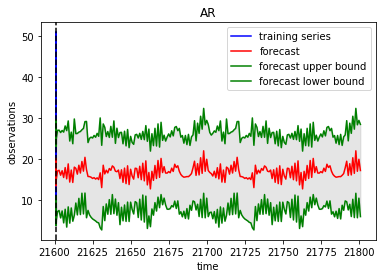

In [118]:
issues_closed_1.to_csv("issues_closed_1.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_1.csv"))
pyplot.show()

In [119]:
#repo: material
df = df_list_new[1].groupby('closed_at')['closed_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_closed_output = pd.DataFrame(['ds','y'])
df_closed_output = df_weekly_maximum[['ds_original','y']]
df_closed_output.columns = ['ds','y']
issues_closed_2 = df_closed_output
issues_closed_2 = issues_closed_2[['ds','y']]
df = pd.DataFrame(issues_closed_2)
issues_closed_2.rename(columns={'ds':'timestamp'}, inplace=True)
issues_closed_2.rename(columns={'y':'value'}, inplace=True)
print(issues_closed_2)

                 timestamp value
ds_new                          
2017-11-20 0    2017-11-27     1
2017-11-27 1    2017-11-28     1
2017-12-04 2    2017-12-10     1
2017-12-11 3    2017-12-13     7
2017-12-18 4    2017-12-21     5
...                    ...   ...
2019-09-23 183  2019-09-30     1
2019-10-21 184  2019-10-22     2
2019-10-28 185  2019-11-02     1
           186  2019-11-03     1
2019-11-11 187  2019-11-12     1

[108 rows x 2 columns]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpb_5na76b', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020670A972C8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done ca

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpb_5na76b\model.ckpt.
INFO:tensorflow:loss = 1.3442811, step = 1
INFO:tensorflow:global_step/sec: 401.594
INFO:tensorflow:loss = 1.4818523, step = 101 (0.249 sec)
INFO:tensorflow:global_step/sec: 963.678
INFO:tensorflow:loss = 1.2594261, step = 201 (0.104 sec)
INFO:tensorflow:global_step/sec: 1089.82
INFO:tensorflow:loss = 1.2347238, step = 301 (0.091 sec)
INFO:tensorflow:global_step/sec: 1138
INFO:tensorflow:loss = 1.3722622, step = 401 (0.088 sec)
INFO:tensorflow:global_step/sec: 1066.5
INFO:tensorflow:loss = 1.3724746, step = 501 (0.094 sec)
INFO:tensorflow:global_step/sec: 1097.5
INFO:tensorflow:loss = 1.3525679, step = 601 (0.092 sec)
INFO:tensorflow:global_step/sec: 1066.69
INFO:tensorflow:loss = 1.3938383, step = 701 (0.093 sec)
INFO:tensorflow:global_step/sec: 1055.44
INFO:tensor

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpb_5na76b\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:58:12
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.3362248, covariance = [[[4.2255764]
  [5.616776 ]
  [6.941198 ]
  [2.8102665]
  [3.5688622]
  [3.604848 ]
  [5.406384 ]
  [2.8359199]
  [3.285527 ]
  [4.0458536]
  [4.574083 ]
  [2.5498648]
  [4.2219133]
  [4.745428 ]
  [4.2219133]
  [4.745428 ]
  [4.582024 ]
  [3.5722387]
  [4.2255764]
  [5.616776 ]
  [4.9728513]
  [2.6890914]
  [4.218253 ]
  [4.0092554]
  [4.2219133]
  [4.745428 ]
  [3.5688622]
  [3.604848 ]
  [4.2255764]
  [5.616776 ]
  [4.2255764]
  [5.616776 ]
  [4.2255764]
  [5.616776 ]
  [4.5899796]
  [5.004536 ]
  [6.93518  ]
  [2.3743014]
  [4.2255764]
  [5.616776 ]
  [3.285527 ]
  [4.0458536]
  [4.58

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpb_5na76b\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


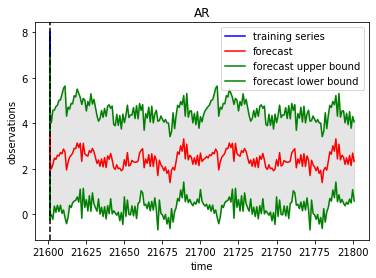

In [120]:
issues_closed_2.to_csv("issues_closed_2.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_2.csv"))
pyplot.show()

In [121]:
#repo: angular-cli
df = df_list_new[2].groupby('closed_at')['closed_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_closed_output = pd.DataFrame(['ds','y'])
df_closed_output = df_weekly_maximum[['ds_original','y']]
df_closed_output.columns = ['ds','y']
issues_closed_3 = df_closed_output
issues_closed_3 = issues_closed_3[['ds','y']]
df = pd.DataFrame(issues_closed_3)
issues_closed_3.rename(columns={'ds':'timestamp'}, inplace=True)
issues_closed_3.rename(columns={'y':'value'}, inplace=True)
print(issues_closed_3)

                 timestamp value
ds_new                          
2017-11-20 3    2017-11-27    10
2017-11-27 5    2017-11-30    22
2017-12-04 12   2017-12-07    17
2017-12-11 17   2017-12-14    14
2017-12-18 23   2017-12-21    17
...                    ...   ...
2019-10-21 625  2019-10-28     5
2019-10-28 632  2019-11-04    10
2019-11-04 634  2019-11-06    12
2019-11-11 639  2019-11-12    13
2019-11-18 645  2019-11-19     6

[121 rows x 2 columns]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpz979agn4', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066EA60C48>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpz979agn4\model.ckpt.
INFO:tensorflow:loss = 1.5270071, step = 1
INFO:tensorflow:global_step/sec: 365.667
INFO:tensorflow:loss = 1.3809096, step = 101 (0.274 sec)
INFO:tensorflow:global_step/sec: 992.878
INFO:tensorflow:loss = 1.3205694, step = 201 (0.101 sec)
INFO:tensorflow:global_step/sec: 1151.48
INFO:tensorflow:loss = 1.1961672, step = 301 (0.086 sec)
INFO:tensorflow:global_step/sec: 1166.31
INFO:tensorflow:loss = 1.2144275, step = 401 (0.086 sec)
INFO:tensorflow:global_step/sec: 1193.38
INFO:tensorflow:loss = 1.407479, step = 501 (0.084 sec)
INFO:tensorflow:global_step/sec: 1237.39
INFO:tensorflow:loss = 1.2276051, step = 601 (0.081 sec)
INFO:tensorflow:global_step/sec: 1113.53
INFO:tensorflow:loss =

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpz979agn4\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:58:22
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.3224527, covariance = [[[123.504616]
  [127.173904]
  [161.09573 ]
  [164.36972 ]
  [186.808   ]
  [177.3388  ]
  [152.52611 ]
  [184.3668  ]
  [ 63.559566]
  [ 66.96353 ]
  [136.82384 ]
  [160.53505 ]
  [141.0534  ]
  [144.58057 ]
  [162.44032 ]
  [247.73396 ]
  [129.90479 ]
  [206.4518  ]
  [163.9083  ]
  [258.41315 ]
  [145.8172  ]
  [149.29248 ]
  [135.59843 ]
  [153.9008  ]
  [162.10182 ]
  [149.5419  ]
  [ 71.49414 ]
  [ 80.21956 ]
  [ 95.805984]
  [117.67686 ]
  [ 95.54091 ]
  [102.63681 ]
  [160.0959  ]
  [180.66782 ]
  [158.11482 ]
  [218.27231 ]
  [294.94244 ]
  [184.34518 ]
  [148.4646  ]
  [162.441

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


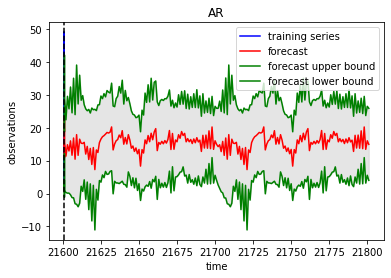

In [122]:
issues_closed_3.to_csv("issues_closed_3.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_3.csv"))
pyplot.show()

In [123]:
#repo: angular-google-maps
df = df_list_new[3].groupby('closed_at')['closed_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_closed_output = pd.DataFrame(['ds','y'])
df_closed_output = df_weekly_maximum[['ds_original','y']]
df_closed_output.columns = ['ds','y']
issues_closed_4 = df_closed_output
issues_closed_4 = issues_closed_4[['ds','y']]
df = pd.DataFrame(issues_closed_4)
issues_closed_4.rename(columns={'ds':'timestamp'}, inplace=True)
issues_closed_4.rename(columns={'y':'value'}, inplace=True)
print(issues_closed_4)

                 timestamp value
ds_new                          
2017-11-27 0    2017-12-02     6
2017-12-11 1    2017-12-17     2
2018-01-01 3    2018-01-03     1
2018-01-15 4    2018-01-22     1
2018-01-29 5    2018-01-31     1
...                    ...   ...
2019-10-28 169  2019-11-01     1
           170  2019-11-04     1
2019-11-04 171  2019-11-05     2
2019-11-11 173  2019-11-12     6
2019-11-18 179  2019-11-21     3

[110 rows x 2 columns]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpkv2elmcj', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002067253AF48>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done ca

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpkv2elmcj\model.ckpt.
INFO:tensorflow:loss = 1.7687678, step = 1
INFO:tensorflow:global_step/sec: 391.666
INFO:tensorflow:loss = 1.9166946, step = 101 (0.255 sec)
INFO:tensorflow:global_step/sec: 1023.14
INFO:tensorflow:loss = 1.0812261, step = 201 (0.099 sec)
INFO:tensorflow:global_step/sec: 1055.08
INFO:tensorflow:loss = 2.8270369, step = 301 (0.095 sec)
INFO:tensorflow:global_step/sec: 1078.18
INFO:tensorflow:loss = 1.8308411, step = 401 (0.092 sec)
INFO:tensorflow:global_step/sec: 941.003
INFO:tensorflow:loss = 1.0852883, step = 501 (0.106 sec)
INFO:tensorflow:global_step/sec: 1152.49
INFO:tensorflow:loss = 1.1239359, step = 601 (0.087 sec)
INFO:tensorflow:global_step/sec: 821.86
INFO:tensorflow:loss = 1.1419647, step = 701 (0.123 sec)
INFO:tensorflow:global_step/sec: 928.408
INFO:te

INFO:tensorflow:Starting evaluation at 2019-11-24T22:58:30Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpkv2elmcj\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:58:30
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.3324202, covariance = [[[ 49.227432  ]
  [ 90.6027    ]
  [ 80.50588   ]
  [ 96.50807   ]
  [ 80.50588   ]
  [ 96.50807   ]
  [ 74.37573   ]
  [ 87.7937    ]
  [ 36.342575  ]
  [ 41.437813  ]
  [ 53.284824  ]
  [ 99.595894  ]
  [ 74.37573   ]
  [ 87.7937    ]
  [ 80.50588   ]
  [ 96.50807   ]
  [ 80.50588   ]
  [ 96.50807   ]
  [ 80.50588   ]
  [ 96.50807   ]
  [ 80.50588   ]
  [ 96.50807   ]
  [ 42.722515  ]
  [ 45.264896  ]
  [ 80.50588   ]
  [ 96.50807   ]
  [ 80.50588   ]
  [ 96.50807   ]
  [ 49.063522  ]
  [100.22521   ]
  [ 41.59768   ]
  [101.4

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpkv2elmcj\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


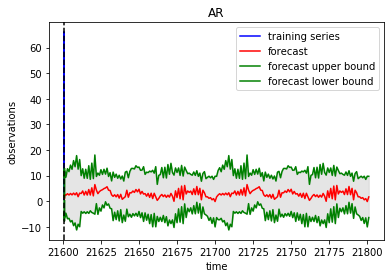

In [124]:
issues_closed_4.to_csv("issues_closed_4.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_4.csv"))
pyplot.show()

In [125]:
#repo: d3
df = df_list_new[4].groupby('closed_at')['closed_at']
df_new = df.describe()
dfnew1 = pd.Series(df_new['top'], name='ds_original')
df_new = pd.concat([df_new, dfnew1], axis=1)
datafrm_pdf = pd.DataFrame(['ds','ds_original','y'])
datafrm_pdf = df_new[['top','ds_original','count']]
datafrm_pdf.columns = ['ds','ds_original','y']
datafrm_pdf['ds_new'] = pd.to_datetime(datafrm_pdf['ds']) - pd.to_timedelta(7, unit='d')
df_weekly_maximum = datafrm_pdf.reset_index().groupby([pd.Grouper(key='ds_new', freq='W-MON')]).apply(lambda x: x.loc[x.y == x.y.max(),['ds_original','y']])
df_closed_output = pd.DataFrame(['ds','y'])
df_closed_output = df_weekly_maximum[['ds_original','y']]
df_closed_output.columns = ['ds','y']
issues_closed_5 = df_closed_output
issues_closed_5 = issues_closed_5[['ds','y']]
df = pd.DataFrame(issues_closed_5)
issues_closed_5.rename(columns={'ds':'timestamp'}, inplace=True)
issues_closed_5.rename(columns={'y':'value'}, inplace=True)
print(issues_closed_5)

                timestamp value
ds_new                         
2017-11-27 1   2017-12-01     2
2017-12-04 2   2017-12-08     1
2017-12-11 3   2017-12-18     1
2018-01-01 4   2018-01-08     2
2018-01-08 5   2018-01-12     1
2018-01-15 6   2018-01-16     2
2018-01-22 10  2018-01-29     3
2018-01-29 11  2018-01-30     1
2018-02-05 12  2018-02-07     3
2018-02-12 14  2018-02-19     2
2018-02-19 15  2018-02-26     1
2018-02-26 17  2018-03-01     2
2018-03-05 19  2018-03-07     2
2018-03-12 23  2018-03-16     2
2018-03-19 25  2018-03-20     1
           26  2018-03-22     1
           27  2018-03-25     1
2018-03-26 28  2018-03-28     1
2018-04-09 29  2018-04-16     1
2018-04-16 30  2018-04-17     1
2018-04-23 31  2018-04-25     2
2019-07-29 34  2019-08-01     1
2019-08-05 35  2019-08-09     2
2019-08-12 38  2019-08-15     2
2019-08-26 40  2019-08-27     1
           41  2019-08-28     1
           42  2019-08-30     1
2019-09-16 43  2019-09-17     1
2019-10-07 44  2019-10-08     2
2019-10-

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp4jp6srkf', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020672538B08>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done ca

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp4jp6srkf\model.ckpt.
INFO:tensorflow:loss = 1.6618565, step = 1
INFO:tensorflow:global_step/sec: 367.281
INFO:tensorflow:loss = 1.3522401, step = 101 (0.274 sec)
INFO:tensorflow:global_step/sec: 1033.69
INFO:tensorflow:loss = 1.2923353, step = 201 (0.096 sec)
INFO:tensorflow:global_step/sec: 1066.67
INFO:tensorflow:loss = 1.297566, step = 301 (0.095 sec)
INFO:tensorflow:global_step/sec: 1208.04
INFO:tensorflow:loss = 1.2855216, step = 401 (0.082 sec)
INFO:tensorflow:global_step/sec: 983.014
INFO:tensorflow:loss = 1.2097256, step = 501 (0.103 sec)
INFO:tensorflow:global_step/sec: 983.021
INFO:tensorflow:loss = 1.3567634, step = 601 (0.101 sec)
INFO:tensorflow:global_step/sec: 973.037
INFO:tensorflow:loss = 1.2257562, step = 701 (0.104 sec)
INFO:tensorflow:global_step/sec: 1066.24
INFO:te

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp4jp6srkf\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:58:39
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.2902619, covariance = [[[0.69666135]
  [0.6609212 ]
  [0.721121  ]
  [0.5208155 ]
  [0.721121  ]
  [0.5208155 ]
  [1.1192863 ]
  [1.2292867 ]
  [1.8614321 ]
  [1.8017347 ]
  [0.721121  ]
  [0.5208155 ]
  [1.1585845 ]
  [0.96869564]
  [0.43361282]
  [0.35534173]
  [0.43361282]
  [0.35534173]
  [0.43361282]
  [0.35534173]
  [0.69666135]
  [0.6609212 ]
  [1.1585845 ]
  [0.96869564]
  [0.43361282]
  [0.35534173]
  [0.43361282]
  [0.35534173]
  [0.69666135]
  [0.6609212 ]
  [0.43361282]
  [0.35534173]
  [0.43361282]
  [0.35534173]]], global_step = 1000, loss = 1.2902619, mean = [[[1.453886 ]
  [1.57546  ]
  [1.4366

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


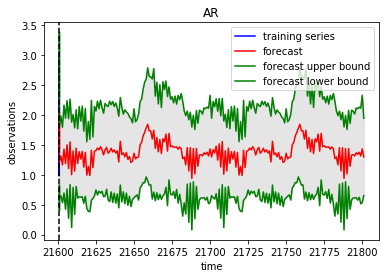

In [126]:
issues_closed_5.to_csv("issues_closed_5.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_5.csv"))
pyplot.show()

#### Req 8.3 : The month of the year that has maximum number of issues closed

In [127]:
df_list_new[0]['closed_month_year'] = pd.to_datetime(df_list_new[0]['closed_at']).dt.to_period('M')
df_list_new[1]['closed_month_year'] = pd.to_datetime(df_list_new[1]['closed_at']).dt.to_period('M')
df_list_new[2]['closed_month_year'] = pd.to_datetime(df_list_new[2]['closed_at']).dt.to_period('M')
df_list_new[3]['closed_month_year'] = pd.to_datetime(df_list_new[3]['closed_at']).dt.to_period('M')
df_list_new[4]['closed_month_year'] = pd.to_datetime(df_list_new[4]['closed_at']).dt.to_period('M')

In [128]:
Max_angular = df_list_new[0].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_material = df_list_new[1].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_angularCli = df_list_new[2].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_angularmaps = df_list_new[3].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_d3 = df_list_new[4].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)

In [129]:
print("The month of the year that has maximum number of issues closed for angular repository :",Max_angular.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed for material repository :",Max_material.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed angular-cli repository :",Max_angularCli.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed angular-google-maps repository :",Max_angularmaps.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed d3 repository :",Max_d3.strftime('%B %F'))

The month of the year that has maximum number of issues closed for angular repository : May 2018
The month of the year that has maximum number of issues closed for material repository : January 2018
The month of the year that has maximum number of issues closed angular-cli repository : October 2018
The month of the year that has maximum number of issues closed angular-google-maps repository : November 2018
The month of the year that has maximum number of issues closed d3 repository : March 2018


#### Req 8.4 : Plot the created issues forecast by calling the Prophet.plot method and passing in your forecast dataframe.

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpliwwclyt', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066B146148>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
343  2018-11-03      1
282  2018-09-02      1
378  2018-12-08      1
613  2019-08-01      1
442  2019-02-10      1
..          ...    ...
67   2018-01-30     27
54   2018-01-17     27
77   2018-02-09     29
181  2018-05-24     42
243  2018-07-25     51

[727 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpliwwclyt\model.ckpt.
INFO:tensorflow:loss = 1.888249, step = 1
INFO:tensorflow:global_step/sec: 421.165
INFO:tensorflow:loss = 0.6339592, step = 101 (0.239 sec)
INFO:tensorflow:global_step/sec: 1055.63
INFO:tensorflow:loss = 0.51172835, step = 201 (0.094 sec)
INFO:tensorflow:global_step/sec: 1179.62
INFO:tensorflow:loss = 0.35313714, step = 301 (0.085 sec)
INFO:tensorflow:global_step/sec: 1235.05
INFO:tensorflow:loss = 0.13526177, step = 401 (0.081 sec)
INFO:tensorflow:global_step/sec: 1193.67
INFO:tensorflow:loss = 0.2974401, step = 501 (0.084 sec)
INFO:tensorflow:global_step/sec: 903.11
INFO:tensorflow:loss = -0.012712035, step = 601 (0.111 sec)
INFO:tensorflow:global_step/sec: 1194
INFO:tensorflow:loss = 0.47851664, step = 701 (0.084 sec)
INFO:tensorflow:global_step/sec: 1089.51
INFO

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpliwwclyt\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:58:57
INFO:tensorflow:Saving dict for global step 1000: average_loss = -0.098906375, covariance = [[[ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.0359337 ]
  [ 0.04021338]
  [ 0.03904452]
  [ 0.04577285]
  [ 0.04466289]
  [ 0.05102472]
  [ 0.04466289]
  [ 0.05102472]
  [ 0.04466289]
  [ 0.05102472]
  [ 0.04466289]
  [ 0.05102472]
  [ 0.04466289]
  [ 0.05102472]
  [ 0.04466289]
  [ 0.05102472]
  [ 0.04466289]
  [ 0.05102472]
  [ 0.04466289]


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpliwwclyt\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


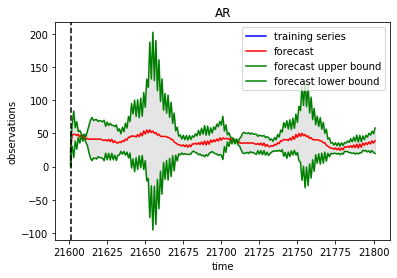

In [130]:
#repo: angular
import time
import time
import datetime
fbCreated_issue = df_list_new[0].groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
fbCreated_issue.rename(columns={'created_at':'ds'}, inplace=True)
tensorfbissue_issue = fbCreated_issue
tensorfbissue_issue = tensorfbissue_issue[['ds','y']]
df = pd.DataFrame(tensorfbissue_issue)
tensorfbissue_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfbissue_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfbissue_issue)
tensorfbissue_issue.to_csv("issues_created_forecast_1.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_forecast_1.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpcb_mt49q', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020670E088C8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
0    2017-11-24      1
172  2018-10-29      1
173  2018-10-30      1
175  2018-11-02      1
176  2018-11-05      1
..          ...    ...
67   2018-03-20      4
207  2019-01-24      4
107  2018-05-25      4
248  2019-05-24      6
92   2018-04-24      6

[290 rows x 2 columns]


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpcb_mt49q\model.ckpt.
INFO:tensorflow:loss = 1.4094139, step = 1
INFO:tensorflow:global_step/sec: 428.282
INFO:tensorflow:loss = 0.581204, step = 101 (0.234 sec)
INFO:tensorflow:global_step/sec: 1100.78
INFO:tensorflow:loss = 0.34420106, step = 201 (0.091 sec)
INFO:tensorflow:global_step/sec: 1179.18
INFO:tensorflow:loss = 0.48513538, step = 301 (0.086 sec)
INFO:tensorflow:global_step/sec: 983.316
INFO:tensorflow:loss = 0.30058306, step = 401 (0.101 sec)
INFO:tensorflow:global_step/sec: 1173.55
INFO:tensorflow:loss = 0.26747483, step = 501 (0.085 sec)
INFO:tensorflow:global_step/sec: 1153.21
INFO:tensorflow:loss = 0.21559058, step = 601 (0.088 sec)
INFO:tensorflow:global_step/sec: 1126.61
INFO:tensorflow:l

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpcb_mt49q\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:59:06
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.40638202, covariance = [[[0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.02466975]
  [0.01210376]
  [0.0246

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpcb_mt49q\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


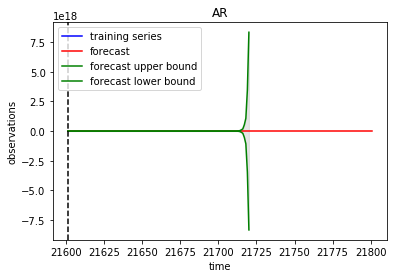

In [131]:
#repo: material
import time
import time
import datetime
fbCreated_issue = df_list_new[1].groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
fbCreated_issue.rename(columns={'created_at':'ds'}, inplace=True)
tensorfbissue_issue = fbCreated_issue
tensorfbissue_issue = tensorfbissue_issue[['ds','y']]
df = pd.DataFrame(tensorfbissue_issue)
tensorfbissue_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfbissue_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfbissue_issue)
tensorfbissue_issue.to_csv("issues_created_forecast_2.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_forecast_2.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp7py3getu', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066EE123C8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
701  2019-11-24      1
576  2019-07-13      1
559  2019-06-23      1
421  2019-01-27      1
312  2018-10-06      1
..          ...    ...
329  2018-10-24     30
161  2018-05-04     35
61   2018-01-24     44
181  2018-05-24     48
281  2018-09-04     79

[702 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp7py3getu\model.ckpt.
INFO:tensorflow:loss = 1.1702998, step = 1
INFO:tensorflow:global_step/sec: 382.699
INFO:tensorflow:loss = 0.6124766, step = 101 (0.262 sec)
INFO:tensorflow:global_step/sec: 1044.06
INFO:tensorflow:loss = 0.37006673, step = 201 (0.095 sec)
INFO:tensorflow:global_step/sec: 1166.4
INFO:tensorflow:loss = 0.25709653, step = 301 (0.086 sec)
INFO:tensorflow:global_step/sec: 1077.75
INFO:tensorflow:loss = 0.15889217, step = 401 (0.095 sec)
INFO:tensorflow:global_step/sec: 983.337
INFO:tensorflow:loss = 0.027664669, step = 501 (0.101 sec)
INFO:tensorflow:global_step/sec: 1023.14
INFO:tensorflow:loss = -0.21209762, step = 601 (0.097 sec)
INFO:tensorflow:global_step/sec: 1101.4
INFO:tensorflow:loss = -0.13591905, step = 701 (0.091 sec)
INFO:tensorflow:global_step/sec: 964.146

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T22:59:16Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp7py3getu\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:59:17
INFO:tensorflow:Saving dict for global step 1000: average_loss = -0.17642128, covariance = [[[3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]
  [3.44037637e-02]
  [7.27351084e-02]


INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp7py3getu\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


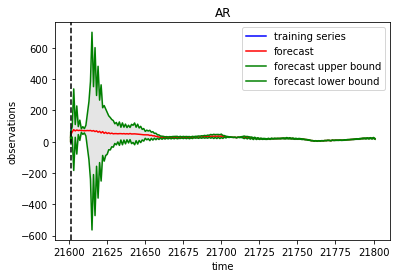

In [132]:
#repo: angular-cli 
fbCreated_issue = df_list_new[2].groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
fbCreated_issue.rename(columns={'created_at':'ds'}, inplace=True)
tensorfbissue_issue = fbCreated_issue
tensorfbissue_issue = tensorfbissue_issue[['ds','y']]
df = pd.DataFrame(tensorfbissue_issue)
tensorfbissue_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfbissue_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfbissue_issue)
tensorfbissue_issue.to_csv("issues_created_forecast_3.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_forecast_3.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp3_6wle20', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066FDC5988>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
0    2017-11-24      1
163  2018-11-13      1
164  2018-11-15      1
166  2018-11-20      1
167  2018-11-21      1
..          ...    ...
12   2017-12-18      4
239  2019-07-15      4
28   2018-01-24      4
66   2018-03-27      5
140  2018-09-24      6

[285 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp3_6wle20\model.ckpt.
INFO:tensorflow:loss = 1.540691, step = 1
INFO:tensorflow:global_step/sec: 409.255
INFO:tensorflow:loss = 0.69490516, step = 101 (0.244 sec)
INFO:tensorflow:global_step/sec: 1167.82
INFO:tensorflow:loss = 0.70041263, step = 201 (0.086 sec)
INFO:tensorflow:global_step/sec: 1078.53
INFO:tensorflow:loss = 0.4785325, step = 301 (0.094 sec)
INFO:tensorflow:global_step/sec: 864.395
INFO:tensorflow:loss = 0.48303965, step = 401 (0.115 sec)
INFO:tensorflow:global_step/sec: 1012.24
INFO:tensorflow:loss = 0.41179824, step = 501 (0.099 sec)
INFO:tensorflow:global_step/sec: 1089.86
INFO:tensorflow:loss = 0.27472398, step = 601 (0.092 sec)
INFO:tensorflow:global_step/sec: 911.53
INFO:tensorflow:loss = 0.18363585, step = 701 (0.110 sec)

INFO:tensorflow:Starting evaluation at 2019-11-24T22:59:25Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp3_6wle20\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:59:26
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.30373102, covariance = [[[0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.01732341]
  [0.01084482]
  [0.0173

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp3_6wle20\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


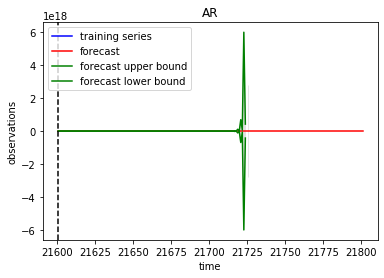

In [133]:
#repo: angular-google-maps
fbCreated_issue = df_list_new[3].groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
fbCreated_issue.rename(columns={'created_at':'ds'}, inplace=True)
tensorfbissue_issue = fbCreated_issue
tensorfbissue_issue = tensorfbissue_issue[['ds','y']]
df = pd.DataFrame(tensorfbissue_issue)
tensorfbissue_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfbissue_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfbissue_issue)
tensorfbissue_issue.to_csv("issues_created_forecast_4.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_forecast_4.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp3hy0d4iw', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020670046588>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


     timestamp  value
0   2017-11-29      1
31  2018-03-19      1
32  2018-03-20      1
33  2018-03-22      1
34  2018-03-23      1
..         ...    ...
8   2018-01-16      2
20  2018-02-19      2
54  2019-10-08      2
44  2019-08-01      3
13  2018-01-29      3

[61 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp3hy0d4iw\model.ckpt.
INFO:tensorflow:loss = 2.8436077, step = 1
INFO:tensorflow:global_step/sec: 441.217
INFO:tensorflow:loss = 0.8960092, step = 101 (0.227 sec)
INFO:tensorflow:global_step/sec: 1165.88
INFO:tensorflow:loss = 0.8092271, step = 201 (0.086 sec)
INFO:tensorflow:global_step/sec: 1179.63
INFO:tensorflow:loss = 1.7087967, step = 301 (0.086 sec)
INFO:tensorflow:global_step/sec: 1165.88
INFO:tensorflow:loss = 0.91128063, step = 401 (0.085 sec)
INFO:tensorflow:global_step/sec: 1206.08
INFO:tensorflow:loss = 0.74338746, step = 501 (0.083 sec)
INFO:tensorflow:global_step/sec: 1126.27
INFO:tensorflow:loss = 1.4042444, step = 601 (0.090 sec)
INFO:tensorflow:global_step/sec: 1208.4
INFO:tensorflow:loss = 1.7089995, step = 701 (0.082 sec)
INFO:tensorflow:global_step/sec: 1193.65
INFO:

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T22:59:34Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp3hy0d4iw\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:59:34
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.7909079, covariance = [[[0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
  [0.07167802]
  [0.03662947]
 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp3hy0d4iw\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


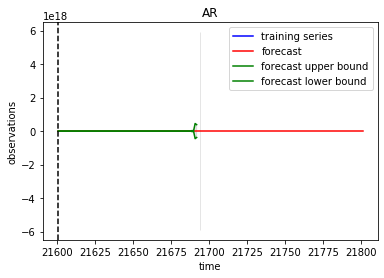

In [134]:
#repo: d3
fbCreated_issue = df_list_new[4].groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
fbCreated_issue.rename(columns={'created_at':'ds'}, inplace=True)
tensorfbissue_issue = fbCreated_issue
tensorfbissue_issue = tensorfbissue_issue[['ds','y']]
df = pd.DataFrame(tensorfbissue_issue)
tensorfbissue_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfbissue_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfbissue_issue)
tensorfbissue_issue.to_csv("issues_created_forecast_5.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_created_forecast_5.csv"))
pyplot.show()

#### Req 8.5 : Plot the closed issues forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp9l4s2rl2', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066F99FAC8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
233  2018-07-26     51
117  2018-03-29     39
75   2018-02-13     35
173  2018-05-24     32
345  2018-11-27     28
..          ...    ...
250  2018-08-12      1
502  2019-05-26      1
501  2019-05-25      1
499  2019-05-23      1
664  2019-11-24      1

[665 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp9l4s2rl2\model.ckpt.
INFO:tensorflow:loss = 1.580287, step = 1
INFO:tensorflow:global_step/sec: 402.641
INFO:tensorflow:loss = 0.7016369, step = 101 (0.249 sec)
INFO:tensorflow:global_step/sec: 1152.83
INFO:tensorflow:loss = 0.7218299, step = 201 (0.086 sec)
INFO:tensorflow:global_step/sec: 1193.66
INFO:tensorflow:loss = 0.68682206, step = 301 (0.085 sec)
INFO:tensorflow:global_step/sec: 1179
INFO:tensorflow:loss = 0.6818645, step = 401 (0.084 sec)
INFO:tensorflow:global_step/sec: 1139.4
INFO:tensorflow:loss = 2.5218792, step = 501 (0.088 sec)
INFO:tensorflow:global_step/sec: 1139.39
INFO:tensorflow:loss = 0.69969606, step = 601 (0.088 sec)
INFO:tensorflow:global_step/sec: 1193.67
INFO:tensorflow:loss = 0.6410841, step = 701 (0.084 sec)
INFO:tensorflow:global_step/sec: 1126.22
INFO:tens

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T22:59:45Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp9l4s2rl2\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:59:45
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.6478797, covariance = [[[ 1.1656103]
  [ 1.8430352]
  [ 1.9259726]
  [ 2.9024866]
  [ 2.4130933]
  [ 3.1285124]
  [ 2.6462555]
  [ 3.549993 ]
  [ 2.9318604]
  [ 3.574002 ]
  [ 2.9318604]
  [ 3.574002 ]
  [ 2.9925685]
  [ 3.8007367]
  [ 3.3842044]
  [ 4.0691915]
  [ 3.6359112]
  [ 4.34195  ]
  [ 3.711198 ]
  [ 4.617402 ]
  [ 3.9063392]
  [ 4.6329904]
  [ 4.1968803]
  [ 4.94354  ]
  [ 4.5090313]
  [ 5.2749057]
  [ 4.6023974]
  [ 5.6095448]
  [ 4.8443995]
  [ 5.628482 ]
  [ 4.8443995]
  [ 5.628482 ]
  [ 4.8443995]
 

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp9l4s2rl2\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


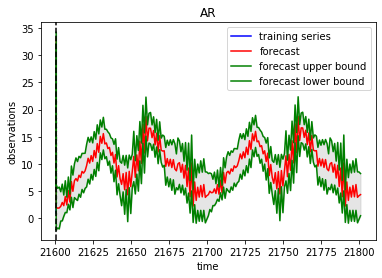

In [135]:
#repo: angular
fbClosed_issue = df_list_new[0].groupby(['closed_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[False])
fbClosed_issue.rename(columns={'closed_at':'ds'}, inplace=True)
tensorfclosed_issue = fbClosed_issue
tensorfclosed_issue = tensorfclosed_issue[['ds','y']]
df = pd.DataFrame(tensorfclosed_issue)
tensorfclosed_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfclosed_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfclosed_issue)
tensorfclosed_issue.to_csv("issues_closed_forecast_1.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_forecast_1.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpwvcysaze', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066FC75E88>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
72   2018-06-22      8
3    2017-12-13      7
42   2018-04-10      6
166  2019-05-24      6
24   2018-02-18      6
..          ...    ...
74   2018-06-29      1
73   2018-06-26      1
71   2018-06-21      1
69   2018-06-19      1
187  2019-11-12      1

[188 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpwvcysaze\model.ckpt.
INFO:tensorflow:loss = 2.3457484, step = 1
INFO:tensorflow:global_step/sec: 374.133
INFO:tensorflow:loss = 0.9072138, step = 101 (0.267 sec)
INFO:tensorflow:global_step/sec: 928.369
INFO:tensorflow:loss = 0.83000153, step = 201 (0.109 sec)
INFO:tensorflow:global_step/sec: 1055.49
INFO:tensorflow:loss = 1.9167043, step = 301 (0.095 sec)
INFO:tensorflow:global_step/sec: 1193.35
INFO:tensorflow:loss = 0.78663576, step = 401 (0.084 sec)
INFO:tensorflow:global_step/sec: 1089.8
INFO:tensorflow:loss = 0.80129766, step = 501 (0.091 sec)
INFO:tensorflow:global_step/sec: 946.153
INFO:tensorflow:loss = 2.1758475, step = 601 (0.106 sec)
INFO:tensorflow:global_step/sec: 1050.04
INFO:tensorflow:loss = 1.3345345, step = 701 (0.096 sec)
I

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T22:59:53Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpwvcysaze\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-22:59:54
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.75477576, covariance = [[[0.11306615]
  [0.09592019]
  [0.17970024]
  [0.17047672]
  [0.17970024]
  [0.17047672]
  [0.24060796]
  [0.25827268]
  [0.24060796]
  [0.25827268]
  [0.24060796]
  [0.25827268]
  [0.2714041 ]
  [0.3335418 ]
  [0.32215977]
  [0.39128384]
  [0.32215977]
  [0.39128384]
  [0.32215977]
  [0.39128384]
  [0.4313527 ]
  [0.59279615]
  [0.4313527 ]
  [0.59279615]
  [0.4313527 ]
  [0.59279615]
  [0.4313527 ]
  [0.59279615]
  [0.4313527 ]
  [0.59279615]
  [0.4313527 ]
  [0.59279615]
  [0.4313527 ]


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpwvcysaze\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


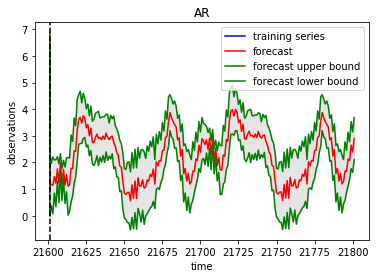

In [136]:
#repo: material
fbClosed_issue = df_list_new[1].groupby(['closed_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[False])
fbClosed_issue.rename(columns={'closed_at':'ds'}, inplace=True)
tensorfclosed_issue = fbClosed_issue
tensorfclosed_issue = tensorfclosed_issue[['ds','y']]
df = pd.DataFrame(tensorfclosed_issue)
tensorfclosed_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfclosed_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfclosed_issue)
tensorfclosed_issue.to_csv("issues_closed_forecast_2.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_forecast_2.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp605_izyr', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066B121D48>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
393  2019-01-29     49
400  2019-02-05     43
53   2018-01-24     42
299  2018-10-23     40
147  2018-05-08     37
..          ...    ...
390  2019-01-26      1
398  2019-02-03      1
415  2019-02-23      1
418  2019-02-27      1
324  2018-11-18      1

[649 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp605_izyr\model.ckpt.
INFO:tensorflow:loss = 1.2505987, step = 1
INFO:tensorflow:global_step/sec: 388.634
INFO:tensorflow:loss = 0.6429813, step = 101 (0.257 sec)
INFO:tensorflow:global_step/sec: 937.042
INFO:tensorflow:loss = 0.62533915, step = 201 (0.107 sec)
INFO:tensorflow:global_step/sec: 1023.2
INFO:tensorflow:loss = 0.6170723, step = 301 (0.099 sec)
INFO:tensorflow:global_step/sec: 1055.17
INFO:tensorflow:loss = 0.6323966, step = 401 (0.096 sec)
INFO:tensorflow:global_step/sec: 1099.71
INFO:tensorflow:loss = 0.5961829, step = 501 (0.089 sec)
INFO:tensorflow:global_step/sec: 737.255
INFO:tensorflow:loss = 0.5766696, step = 601 (0.137 sec)
INFO:tensorflow:global_step/sec: 1002.68
INFO:tensorflow:loss = 0.59182495, step = 701 (0.100 sec)
IN

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp605_izyr\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:00:06
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.57476515, covariance = [[[ 1.7852759]
  [ 0.8036667]
  [ 1.9665825]
  [ 1.0694882]
  [ 2.4962528]
  [ 1.3880059]
  [ 2.4962528]
  [ 1.3880059]
  [ 2.863062 ]
  [ 1.9861097]
  [ 3.180542 ]
  [ 2.1451805]
  [ 3.5901074]
  [ 2.66686  ]
  [ 3.6036577]
  [ 3.1758351]
  [ 4.219384 ]
  [ 3.5649107]
  [ 4.168207 ]
  [ 3.6883357]
  [ 4.339949 ]
  [ 3.9659076]
  [ 4.57425  ]
  [ 4.121666 ]
  [ 4.7627225]
  [ 4.4318485]
  [ 4.7627225]
  [ 4.4318485]
  [ 4.7627225]
  [ 4.4318485]
  [ 4.7049565]
  [ 4.5852904]
  [ 4.9589615]
  [ 4.7653747]
  [ 5.163286 ]
  [ 5.1240005]
  [ 5.163286 ]
  [ 5.1240005]
  [ 5.163286 ]
  [ 5.124

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp605_izyr\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


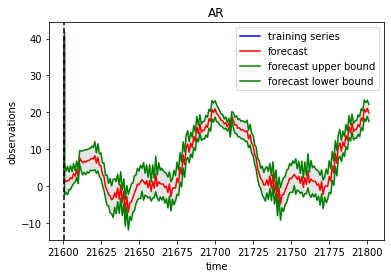

In [137]:
#repo: angular-cli
fbClosed_issue = df_list_new[2].groupby(['closed_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[False])
fbClosed_issue.rename(columns={'closed_at':'ds'}, inplace=True)
tensorfclosed_issue = fbClosed_issue
tensorfclosed_issue = tensorfclosed_issue[['ds','y']]
df = pd.DataFrame(tensorfclosed_issue)
tensorfclosed_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfclosed_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfclosed_issue)
tensorfclosed_issue.to_csv("issues_closed_forecast_3.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_forecast_3.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmppp35iuf6', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002067206A988>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
49   2018-11-20     66
116  2019-05-30     11
12   2018-02-26     10
39   2018-07-04      9
76   2019-01-20      9
..          ...    ...
87   2019-02-18      1
86   2019-02-17      1
29   2018-05-01      1
84   2019-02-05      1
90   2019-02-26      1

[181 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmppp35iuf6\model.ckpt.
INFO:tensorflow:loss = 1.8949224, step = 1
INFO:tensorflow:global_step/sec: 375.498
INFO:tensorflow:loss = 0.93526083, step = 101 (0.267 sec)
INFO:tensorflow:global_step/sec: 895.012
INFO:tensorflow:loss = 0.96913856, step = 201 (0.112 sec)
INFO:tensorflow:global_step/sec: 887.738
INFO:tensorflow:loss = 0.9928721, step = 301 (0.113 sec)
INFO:tensorflow:global_step/sec: 937.09
INFO:tensorflow:loss = 2.9079404, step = 401 (0.107 sec)
INFO:tensorflow:global_step/sec: 911.524
INFO:tensorflow:loss = 0.9984249, step = 501 (0.110 sec)
INFO:tensorflow:global_step/sec: 1089.57
INFO:tensorflow:loss = 1.0428891, step = 601 (0.093 sec)
INFO:tensorflow:global_step/sec: 864.559
INFO:tensorflow:loss = 1.0369483, step = 701 (0.115 sec)
INFO:tensorflow:global_step/sec: 1066.09
INFO:

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmppp35iuf6\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:00:15
INFO:tensorflow:Saving dict for global step 1000: average_loss = 1.0564234, covariance = [[[21.852684]
  [20.353619]
  [24.503386]
  [24.320404]
  [24.517399]
  [24.464453]
  [27.483469]
  [29.146225]
  [29.106787]
  [31.907156]
  [29.115108]
  [32.001507]
  [32.64673 ]
  [38.23839 ]
  [32.64673 ]
  [38.23839 ]
  [32.656063]
  [38.351467]
  [34.57502 ]
  [41.860596]
  [34.57502 ]
  [41.860596]
  [34.57502 ]
  [41.860596]
  [34.57502 ]
  [41.860596]
  [34.584904]
  [41.984383]
  [36.617203]
  [45.825916]
  [36.617203]
  [45.825916]
  [36.617203]
  [45.825916]
  [36.617203]
  [45.825916]
  [36.617203]
  [45.825916]
  [36.617203]
  [45.825916]
  [36.617203]
  [45.825916]
  [36.6

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmppp35iuf6\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


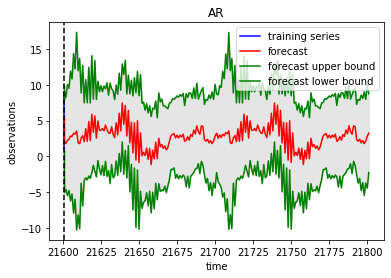

In [138]:
#repo: angular-google-maps
fbClosed_issue = df_list_new[3].groupby(['closed_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[False])
fbClosed_issue.rename(columns={'closed_at':'ds'}, inplace=True)
tensorfclosed_issue = fbClosed_issue
tensorfclosed_issue = tensorfclosed_issue[['ds','y']]
df = pd.DataFrame(tensorfclosed_issue)
tensorfclosed_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfclosed_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfclosed_issue)
tensorfclosed_issue.to_csv("issues_closed_forecast_4.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_forecast_4.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpjwk4w_nd', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020670E83648>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


     timestamp  value
10  2018-01-29      3
12  2018-02-07      3
9   2018-01-28      2
38  2019-08-15      2
17  2018-03-01      2
23  2018-03-16      2
31  2018-04-25      2
14  2018-02-19      2
44  2019-10-08      2
19  2018-03-07      2
1   2017-12-01      2
6   2018-01-16      2
35  2019-08-09      2
4   2018-01-08      2
39  2019-08-16      1
37  2019-08-11      1
36  2019-08-10      1
34  2019-08-01      1
33  2018-04-30      1
0   2017-11-29      1
43  2019-09-17      1
40  2019-08-27      1
41  2019-08-28      1
42  2019-08-30      1
45  2019-10-18      1
46  2019-10-23      1
47  2019-11-05      1
48  2019-11-15      1
49  2019-11-18      1
50  2019-11-19      1
32  2018-04-27      1
26  2018-03-22      1
30  2018-04-17      1
29  2018-04-16      1
2   2017-12-08      1
3   2017-12-18      1
5   2018-01-12      1
7   2018-01-20      1
8   2018-01-23      1
11  2018-01-30      1
13  2018-02-08      1
15  2018-02-26      1
16  2018-02-28      1
18  2018-03-02      1
20  2018-0

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpjwk4w_nd\model.ckpt.
INFO:tensorflow:loss = 1.5866927, step = 1
INFO:tensorflow:global_step/sec: 408.679
INFO:tensorflow:loss = 0.9411749, step = 101 (0.245 sec)
INFO:tensorflow:global_step/sec: 1165.89
INFO:tensorflow:loss = 1.2117994, step = 201 (0.086 sec)
INFO:tensorflow:global_step/sec: 1179.62
INFO:tensorflow:loss = 1.0076607, step = 301 (0.086 sec)
INFO:tensorflow:global_step/sec: 1101.54
INFO:tensorflow:loss = 0.97966886, step = 401 (0.090 sec)
INFO:tensorflow:global_step/sec: 983.263
INFO:tensorflow:loss = 1.4230733, step = 501 (0.102 sec)
INFO:tensorflow:global_step/sec: 973.215
INFO:tensorflow:loss = 1.1429379, step = 601 (0.104 sec)
INFO:tensorflow:global_step/sec: 887.535
INFO:tensorflow:loss = 0.94560057, step = 701 (0.112 sec)
INFO:tensorflow:global_step/sec: 864.363
INFO

INFO:tensorflow:Starting evaluation at 2019-11-24T23:00:22Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpjwk4w_nd\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:00:23
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.9825763, covariance = [[[0.26847315]
  [0.21915337]
  [0.22170907]
  [0.27039382]
  [0.22170907]
  [0.27039382]
  [0.22170907]
  [0.27039382]
  [0.22170907]
  [0.27039382]
  [0.22170907]
  [0.27039382]
  [0.22170907]
  [0.27039382]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361486]
  [0.18309061]
  [0.33361

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpjwk4w_nd\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


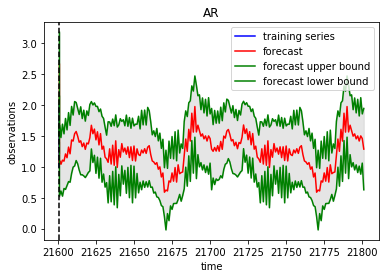

In [139]:
#repo: d3
fbClosed_issue = df_list_new[4].groupby(['closed_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[False])
fbClosed_issue.rename(columns={'closed_at':'ds'}, inplace=True)
tensorfclosed_issue = fbClosed_issue
tensorfclosed_issue = tensorfclosed_issue[['ds','y']]
df = pd.DataFrame(tensorfclosed_issue)
tensorfclosed_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfclosed_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfclosed_issue)
tensorfclosed_issue.to_csv("issues_closed_forecast_5.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("issues_closed_forecast_5.csv"))
pyplot.show()

#### Req 8.6 : Plot the pulls forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp8dwo_mz2', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020670E8B748>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


     timestamp  value
24  2019-09-21      3
81  2019-11-17      6
4   2019-09-01      6
17  2019-09-14      9
53  2019-10-20      9
..         ...    ...
56  2019-10-23     66
48  2019-10-15     66
85  2019-11-21     66
35  2019-10-02     66
50  2019-10-17     81

[89 rows x 2 columns]


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp8dwo_mz2\model.ckpt.
INFO:tensorflow:loss = 1.8097961, step = 1
INFO:tensorflow:global_step/sec: 406.024
INFO:tensorflow:loss = 0.75338686, step = 101 (0.246 sec)
INFO:tensorflow:global_step/sec: 945.434
INFO:tensorflow:loss = 0.6836755, step = 201 (0.106 sec)
INFO:tensorflow:global_step/sec: 1152.5
INFO:tensorflow:loss = 0.4334168, step = 301 (0.087 sec)
INFO:tensorflow:global_step/sec: 1165.48
INFO:tensorflow:loss = 0.8798719, step = 401 (0.087 sec)
INFO:tensorflow:global_step/sec: 928.662
INFO:tensorflow:loss = 0.36078632, step = 501 (0.107 sec)
INFO:tensorflow:global_step/sec: 1023.12
INFO:tensorflow:loss = 0.42898232, step = 601 (0.099 sec)
INFO:tensorflow:global_step/sec: 1054.68
INFO:tensorflow:los

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:00:38Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp8dwo_mz2\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:00:38
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.33355495, covariance = [[[  1.0456204]
  [  1.4984478]
  [  1.3745437]
  [  1.9914428]
  [  1.529619 ]
  [  2.277026 ]
  [  1.8069371]
  [  2.6466348]
  [  1.8069371]
  [  2.6466348]
  [  1.8069371]
  [  2.6466348]
  [  1.8069371]
  [  2.6466348]
  [  2.3753495]
  [  3.517389 ]
  [  2.643335 ]
  [  4.0218005]
  [  3.1225688]
  [  4.674625 ]
  [  3.1225688]
  [  4.674625 ]
  [  4.1048427]
  [  6.212594 ]
  [  4.1048427]
  [  6.212594 ]
  [  4.567949 ]
  [  7.1035123]
  [  5.3961124]
  [  8.256564 ]
  [  5.3961124]

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp8dwo_mz2\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


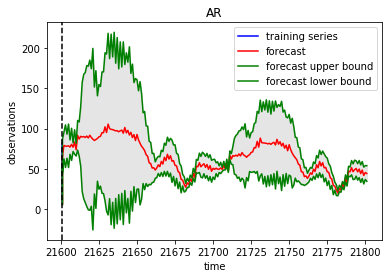

In [140]:
#repo: angular
list_of_pulls_fb = [json.loads(line) for line in open('angularpull.json')]
df_list_pull = DataFrame(list_of_pulls_fb)
df_list_pull
listof_pullfb = df_list_pull.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb.head()

tensorfpull_issue = listof_pullfb
tensorfpull_issue = tensorfpull_issue[['ds','y']]
df = pd.DataFrame(tensorfpull_issue)
tensorfpull_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfpull_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfpull_issue)

tensorfpull_issue.to_csv("pulls_forecast_1.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("pulls_forecast_1.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp58o48zrx', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020670E80D08>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
0    2016-06-25      3
308  2018-03-16      3
306  2018-03-12      3
305  2018-03-11      3
304  2018-03-10      3
..          ...    ...
38   2016-08-04     24
112  2016-10-20     24
102  2016-10-10     27
29   2016-07-26     33
33   2016-07-30     33

[506 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmp58o48zrx\model.ckpt.
INFO:tensorflow:loss = 1.4636314, step = 1
INFO:tensorflow:global_step/sec: 388.606
INFO:tensorflow:loss = 0.4606104, step = 101 (0.258 sec)
INFO:tensorflow:global_step/sec: 936.86
INFO:tensorflow:loss = 0.30675536, step = 201 (0.107 sec)
INFO:tensorflow:global_step/sec: 1078.02
INFO:tensorflow:loss = 0.23530176, step = 301 (0.094 sec)
INFO:tensorflow:global_step/sec: 1044.85
INFO:tensorflow:loss = -0.062129937, step = 401 (0.095 sec)
INFO:tensorflow:global_step/sec: 983.009
INFO:tensorflow:loss = -0.12290522, step = 501 (0.102 sec)
INFO:tensorflow:global_step/sec: 992.723
INFO:tensorflow:loss = 0.006622933, step = 601 (0.101 sec)
INFO:tensorflow:global_step/sec: 1012.83
INFO:tensorflow:loss = -0.23312303, step = 701 (0.099 sec)
INFO:tensorflow:global_step/sec: 1002

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp58o48zrx\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:00:49
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.02267693, covariance = [[[ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  [ 0.14144966]
  [ 0.07357326]
  

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmp58o48zrx\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


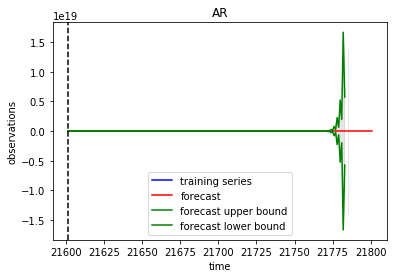

In [141]:
#repo: material
list_of_pulls_fb = [json.loads(line) for line in open('materialpull.json')]
df_list_pull = DataFrame(list_of_pulls_fb)
df_list_pull
listof_pullfb = df_list_pull.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb.head()

tensorfpull_issue = listof_pullfb
tensorfpull_issue = tensorfpull_issue[['ds','y']]
df = pd.DataFrame(tensorfpull_issue)
tensorfpull_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfpull_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfpull_issue)

tensorfpull_issue.to_csv("pulls_forecast_2.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("pulls_forecast_2.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmptayiuetc', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020670E80D88>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
198  2019-11-24      3
25   2019-05-25      3
33   2019-06-03      3
124  2019-09-08      3
18   2019-05-18      3
..          ...    ...
54   2019-06-25     33
9    2019-05-08     33
28   2019-05-29     36
182  2019-11-07     39
166  2019-10-22     42

[199 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmptayiuetc\model.ckpt.
INFO:tensorflow:loss = 1.7429893, step = 1
INFO:tensorflow:global_step/sec: 423.831
INFO:tensorflow:loss = 0.65902305, step = 101 (0.236 sec)
INFO:tensorflow:global_step/sec: 1165.89
INFO:tensorflow:loss = 0.5933976, step = 201 (0.086 sec)
INFO:tensorflow:global_step/sec: 1179.09
INFO:tensorflow:loss = 0.458614, step = 301 (0.086 sec)
INFO:tensorflow:global_step/sec: 903.62
INFO:tensorflow:loss = 0.39896265, step = 401 (0.110 sec)
INFO:tensorflow:global_step/sec: 1165.9
INFO:tensorflow:loss = 0.4945801, step = 501 (0.086 sec)
INFO:tensorflow:global_step/sec: 1044.47
INFO:tensorflow:loss = 0.39568573, step = 601 (0.097 sec)
INFO:tensorflow:global_step/sec: 972.983
INFO:tensorflow:loss = 0.13304506, step = 701 (0.102 sec)
INFO:tensorflow:global_step/sec: 1066.15
INFO:

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmptayiuetc\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:00:57
INFO:tensorflow:Saving dict for global step 1000: average_loss = 0.25199535, covariance = [[[ 0.34336987]
  [ 0.6487753 ]
  [ 0.34336987]
  [ 0.6487753 ]
  [ 0.34336987]
  [ 0.6487753 ]
  [ 0.34336987]
  [ 0.6487753 ]
  [ 0.34336987]
  [ 0.6487753 ]
  [ 0.34336987]
  [ 0.6487753 ]
  [ 0.34336987]
  [ 0.6487753 ]
  [ 0.34336987]
  [ 0.6487753 ]
  [ 0.39064282]
  [ 0.7191359 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  [ 1.0319105 ]
  [ 0.5399808 ]
  

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmptayiuetc\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


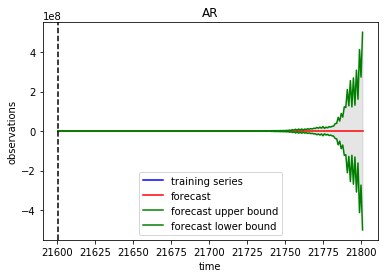

In [142]:
#repo: angular-cli
list_of_pulls_fb = [json.loads(line) for line in open('angular-clipull.json')]
df_list_pull = DataFrame(list_of_pulls_fb)
df_list_pull
listof_pullfb = df_list_pull.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb.head()

tensorfpull_issue = listof_pullfb
tensorfpull_issue = tensorfpull_issue[['ds','y']]
df = pd.DataFrame(tensorfpull_issue)
tensorfpull_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfpull_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfpull_issue)

tensorfpull_issue.to_csv("pulls_forecast_3.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("pulls_forecast_3.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpmtk1w240', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066F9D00C8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
0    2015-11-07      5
131  2016-05-24      5
133  2016-05-26      5
134  2016-05-27      5
135  2016-05-30      5
..          ...    ...
35   2016-01-12     35
141  2016-06-08     40
83   2016-03-21     40
206  2016-09-01     50
73   2016-03-08     50

[456 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpmtk1w240\model.ckpt.
INFO:tensorflow:loss = 1.0657475, step = 1
INFO:tensorflow:global_step/sec: 397.192
INFO:tensorflow:loss = 0.44589972, step = 101 (0.253 sec)
INFO:tensorflow:global_step/sec: 1055.45
INFO:tensorflow:loss = 0.25780523, step = 201 (0.094 sec)
INFO:tensorflow:global_step/sec: 1089.86
INFO:tensorflow:loss = 0.042650327, step = 301 (0.094 sec)
INFO:tensorflow:global_step/sec: 964.119
INFO:tensorflow:loss = 0.09247084, step = 401 (0.103 sec)
INFO:tensorflow:global_step/sec: 919.884
INFO:tensorflow:loss = -0.050822612, step = 501 (0.108 sec)
INFO:tensorflow:global_step/sec: 1101.54
INFO:tensorflow:loss = 0.09851776, step = 601 (0.092 sec)
INFO:tensorflow:global_step/sec: 1066.64
INFO:tensorflow:loss = -0.14416382, step = 701 (0.093 sec)
INFO:tensorflow:global_step/sec: 993

INFO:tensorflow:Starting evaluation at 2019-11-24T23:01:11Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpmtk1w240\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:01:11
INFO:tensorflow:Saving dict for global step 1000: average_loss = -0.018200722, covariance = [[[  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  0.27263093]
  [  0.16972752]
  [  

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


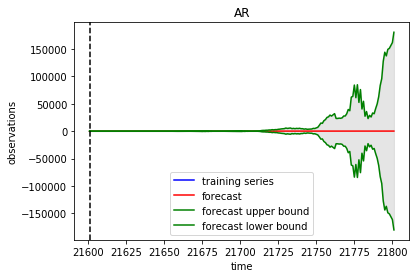

In [143]:
#repo: angular-google-maps
list_of_pulls_fb = [json.loads(line) for line in open('angular-google-mapspull.json')]
df_list_pull = DataFrame(list_of_pulls_fb)
df_list_pull
listof_pullfb = df_list_pull.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb.head()

tensorfpull_issue = listof_pullfb
tensorfpull_issue = tensorfpull_issue[['ds','y']]
df = pd.DataFrame(tensorfpull_issue)
tensorfpull_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfpull_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfpull_issue)

tensorfpull_issue.to_csv("pulls_forecast_4.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("pulls_forecast_4.csv"))
pyplot.show()

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpr0kj5lb0', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066F125648>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


      timestamp  value
0    2011-07-07      5
280  2013-03-31      5
278  2013-03-28      5
277  2013-03-27      5
276  2013-03-26      5
..          ...    ...
308  2013-05-28     25
498  2014-10-10     30
156  2012-07-31     30
246  2013-02-01     30
248  2013-02-06     40

[684 rows x 2 columns]


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpr0kj5lb0\model.ckpt.
INFO:tensorflow:loss = 1.3549381, step = 1
INFO:tensorflow:global_step/sec: 434.321
INFO:tensorflow:loss = 0.5994806, step = 101 (0.231 sec)
INFO:tensorflow:global_step/sec: 871.89
INFO:tensorflow:loss = 0.47470385, step = 201 (0.116 sec)
INFO:tensorflow:global_step/sec: 1126.6
INFO:tensorflow:loss = 0.06235016, step = 301 (0.089 sec)
INFO:tensorflow:global_step/sec: 1152.5
INFO:tensorflow:loss = 1.6769269, step = 401 (0.086 sec)
INFO:tensorflow:global_step/sec: 1101.83
INFO:tensorflow:loss = -0.121222496, step = 501 (0.091 sec)
INFO:tensorflow:global_step/sec: 1152.04
INFO:tensorflow:loss = -0.22562905, step = 601 (0.087 sec)
INFO:tensorflow:global_step/sec: 1066.17
INFO:tensorflow:loss = -0.13511987, step = 701 (0.094 sec)
INFO:tensorflow:global_step/sec: 1160.03


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:01:22Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpr0kj5lb0\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [1/1]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:01:22
INFO:tensorflow:Saving dict for global step 1000: average_loss = -0.09751009, covariance = [[[6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.1816288e-01]
  [6.8580553e-02]
  [1.181

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpr0kj5lb0\model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


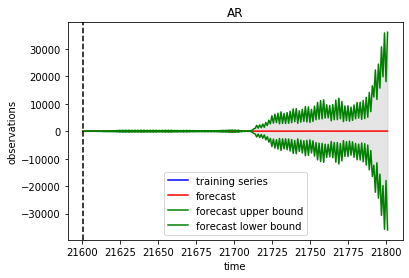

In [144]:
#repo: d3
list_of_pulls_fb = [json.loads(line) for line in open('d3pull.json')]
df_list_pull = DataFrame(list_of_pulls_fb)
df_list_pull
listof_pullfb = df_list_pull.groupby(['created_at']).size().to_frame('y').reset_index().sort_values(['y'], ascending=[True])
listof_pullfb.rename(columns={'created_at':'ds'}, inplace=True)
listof_pullfb.head()

tensorfpull_issue = listof_pullfb
tensorfpull_issue = tensorfpull_issue[['ds','y']]
df = pd.DataFrame(tensorfpull_issue)
tensorfpull_issue.rename(columns={'ds':'timestamp'}, inplace=True)
tensorfpull_issue.rename(columns={'y':'value'}, inplace=True)
print(tensorfpull_issue)

tensorfpull_issue.to_csv("pulls_forecast_5.csv", index=None ,header=True )
from matplotlib import pyplot
make_plot("AR", *ar_train_and_predict("pulls_forecast_5.csv"))
pyplot.show()

#### Req 8.7 : Plot the commits forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

In [145]:
def tensorflowcommits():
    df = pd.read_csv('commits_i.csv')
    df['ds'] = df['ds'].astype('datetime64[ns]')
    array = df.to_numpy()
    x = np.array([time.mktime(i[0].timetuple()) for i in array])
    y = np.array([i[1] for i in array])
    data = {
        tf.contrib.timeseries.TrainEvalFeatures.TIMES: x,
        tf.contrib.timeseries.TrainEvalFeatures.VALUES: y,
    }
    print (data)

    reader = NumpyReader(data)

    train_input_fn = tf.contrib.timeseries.RandomWindowInputFn(reader, batch_size = 40, window_size = 26)
    ar = tf.contrib.timeseries.ARRegressor(
            periodicities=200, input_window_size=16, output_window_size=10,
            num_features=1,
            loss=tf.contrib.timeseries.ARModel.NORMAL_LIKELIHOOD_LOSS)
    ar.train(input_fn=train_input_fn, steps=400)
    evaluation_input_fn = tf.contrib.timeseries.WholeDatasetInputFn(reader)
    evaluation = ar.evaluate(input_fn=evaluation_input_fn, steps=1000)
    (predictions,) = tuple(ar.predict(
            input_fn=tf.contrib.timeseries.predict_continuation_input_fn(
                evaluation, steps=365)))
    #plot origin and evaluation 
    plt.figure(figsize=(30, 5))
    plt.plot(data['times'].reshape(-1), data['values'].reshape(-1), label='origin')
    plt.plot(evaluation['times'].reshape(-1), evaluation['mean'].reshape(-1), label='evaluation')
    plt.xlabel('time_step')
    plt.ylabel('values')
    plt.legend()
    plt.show()
    #plot prediction
    plt.figure(figsize=(30, 5))
    plt.plot(predictions['times'].reshape(-1), predictions['mean'].reshape(-1), label='prediction')
    plt.xlabel('time_step')
    plt.ylabel('values')
    plt.legend()
    plt.show()

In [146]:
def tensorflowbranches():
    df_b = pd.read_csv('branches_i.csv')
    df_b['ds'] = df_b['ds'].astype('datetime64[ns]')
    array = df_b.to_numpy()
    x_b = np.array([time.mktime(i[0].timetuple()) for i in array])
    y_b= np.array([i[1] for i in array])
    data = {
        tf.contrib.timeseries.TrainEvalFeatures.TIMES: x_b,
        tf.contrib.timeseries.TrainEvalFeatures.VALUES: y_b,
    }
    print (data)

    reader = NumpyReader(data)

    train_input_fn_b = tf.contrib.timeseries.RandomWindowInputFn(reader, batch_size = 40, window_size = 26)
    ar = tf.contrib.timeseries.ARRegressor(
            periodicities=200, input_window_size=16, output_window_size=10,
            num_features=1,
            loss=tf.contrib.timeseries.ARModel.NORMAL_LIKELIHOOD_LOSS)

    #evaluation

    evaluation_input_fn = tf.contrib.timeseries.WholeDatasetInputFn(reader)
    evaluation = ar.evaluate(input_fn=evaluation_input_fn, steps=1000)
    #prediction
    (predictions,) = tuple(ar.predict(
            input_fn=tf.contrib.timeseries.predict_continuation_input_fn(
                evaluation, steps=365)))

    #plot origin and evaluation 
    plt.figure(figsize=(30, 5))
    plt.plot(data['times'].reshape(-1), data['values'].reshape(-1), label='origin')
    plt.plot(evaluation['times'].reshape(-1), evaluation['mean'].reshape(-1), label='evaluation')
    plt.xlabel('time_step')
    plt.ylabel('values')
    plt.legend()
    plt.show()
    #plot prediction
    plt.figure(figsize=(30, 5))
    plt.plot(predictions['times'].reshape(-1), predictions['mean'].reshape(-1), label='prediction')
    plt.xlabel('time_step')
    plt.ylabel('values')
    plt.legend()
    plt.show()

In [147]:
def tensorcontricsv():
    df_c = pd.read_csv('contributors_i.csv')
    df_c['ds'] = df_c['ds'].astype('datetime64[ns]')
    array_c = df_c.to_numpy()
    x_c = np.array([time.mktime(i[0].timetuple()) for i in array_c])
    y_c= np.array([i[1] for i in array_c])
    data_c = {
        tf.contrib.timeseries.TrainEvalFeatures.TIMES: x_c,
        tf.contrib.timeseries.TrainEvalFeatures.VALUES: y_c,
    }
    print (data_c)

    reader = NumpyReader(data_c)

    train_input_fn_c = tf.contrib.timeseries.RandomWindowInputFn(reader, batch_size = 40, window_size = 26)
    ar = tf.contrib.timeseries.ARRegressor(
            periodicities=200, input_window_size=16, output_window_size=10,
            num_features=1,
            loss=tf.contrib.timeseries.ARModel.NORMAL_LIKELIHOOD_LOSS)

    #evaluation

    evaluation_input_fn = tf.contrib.timeseries.WholeDatasetInputFn(reader)
    evaluation = ar.evaluate(input_fn=evaluation_input_fn, steps=1000)
    #prediction
    (predictions,) = tuple(ar.predict(
            input_fn=tf.contrib.timeseries.predict_continuation_input_fn(
                evaluation, steps=365)))

    #plot origin and evaluation 
    plt.figure(figsize=(30, 5))
    plt.plot(data_c['times'].reshape(-1), data_c['values'].reshape(-1), label='origin')
    plt.plot(evaluation['times'].reshape(-1), evaluation['mean'].reshape(-1), label='evaluation')
    plt.xlabel('time_step')
    plt.ylabel('values')
    plt.legend()
    plt.show()
    #plot prediction
    plt.figure(figsize=(30, 5))
    plt.plot(predictions['times'].reshape(-1), predictions['mean'].reshape(-1), label='prediction')
    plt.xlabel('time_step')
    plt.ylabel('values')
    plt.legend()
    plt.show()

In [148]:
def tensorflowrelease():
    df_r = pd.read_csv('releases_i.csv')
    df_r['ds'] = df_r['ds'].astype('datetime64[ns]')
    array_r = df_r.to_numpy()
    x_r = np.array([time.mktime(i[0].timetuple()) for i in array_r])
    y_r= np.array([i[1] for i in array_r])
    data_r = {
        tf.contrib.timeseries.TrainEvalFeatures.TIMES: x_r,
        tf.contrib.timeseries.TrainEvalFeatures.VALUES: y_r,
    }
    print (data_r)
    reader_r = NumpyReader(data_r)

    train_input_fn_r = tf.contrib.timeseries.RandomWindowInputFn(reader_r, batch_size = 40, window_size = 26)
    ar = tf.contrib.timeseries.ARRegressor(
            periodicities=200, input_window_size=16, output_window_size=10,
            num_features=1,
            loss=tf.contrib.timeseries.ARModel.NORMAL_LIKELIHOOD_LOSS)
    #evaluation

    evaluation_input_fn = tf.contrib.timeseries.WholeDatasetInputFn(reader_r)
    evaluation = ar.evaluate(input_fn=evaluation_input_fn, steps=1000)
    #prediction
    (predictions,) = tuple(ar.predict(
            input_fn=tf.contrib.timeseries.predict_continuation_input_fn(
                evaluation, steps=365)))

    #plot origin and evaluation 
    plt.figure(figsize=(30, 5))
    plt.plot(data_r['times'].reshape(-1), data_r['values'].reshape(-1), label='origin')
    plt.plot(evaluation['times'].reshape(-1), evaluation['mean'].reshape(-1), label='evaluation')
    plt.xlabel('time_step')
    plt.ylabel('values')
    plt.legend()
    plt.show()
    #plot prediction
    plt.figure(figsize=(30, 5))
    plt.plot(predictions['times'].reshape(-1), predictions['mean'].reshape(-1), label='prediction')
    plt.xlabel('time_step')
    plt.ylabel('values')
    plt.legend()
    plt.show()

# 8.7 tensor

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpr1owrpgo', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs':

{'times': array([1.57439503e+09, 1.57439578e+09, 1.57440522e+09, 1.57440534e+09,
       1.57440615e+09, 1.57446580e+09, 1.57446590e+09, 1.57446600e+09,
       1.57446630e+09, 1.57446635e+09, 1.57446746e+09, 1.57446798e+09,
       1.57446816e+09, 1.57446845e+09, 1.57447115e+09, 1.57448110e+09,
       1.57448113e+09, 1.57448113e+09, 1.57448381e+09, 1.57448384e+09,
       1.57448386e+09, 1.57448398e+09, 1.57448400e+09, 1.57448705e+09,
       1.57448760e+09, 1.57448764e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpr1owrpgo\model.ckpt.
INFO:tensorflow:loss = 1.3048984, step = 1
INFO:tensorflow:global_step/sec: 19.1131
INFO:tensorflow:loss = 0.49819094, step = 101 (5.233 sec)
INFO:tensorflow:global_step/sec: 15.526
INFO:tensorflow:loss = 0.3388975, step = 201 (6.442 sec)
INFO:tensorflow:global_step/sec: 15.8176
INFO:tensorflow:loss = 0.1437982, step = 301 (6.321 sec)
INFO:tensorflow:Saving checkpoints for 400 into C:\Users\manis\AppData\Local\Temp\tmpr1owrpgo\model.ckpt.
INFO:tensorflow:Loss for final step: 0.06329921.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:02:11Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpr1owrpgo\model.ckpt-400
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:02:12
INFO:tensorflow:Saving dict for global step 400: average_loss = 0.057808172, covariance = [[[0.0038546 ]
  [0.01503129]
  [0.00173655]
  [0.00131936]
  [0.00163231]
  [0.00566376]
  [0.00336409]
  [0.00565786]
  [0.00337838]
  [0.01717979]]], global_step = 400, loss = 0.057808172, mean = [[[2.        ]
  [0.998991  ]
  [1.        ]
  [

INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpr1owrpgo\model.ckpt-400
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


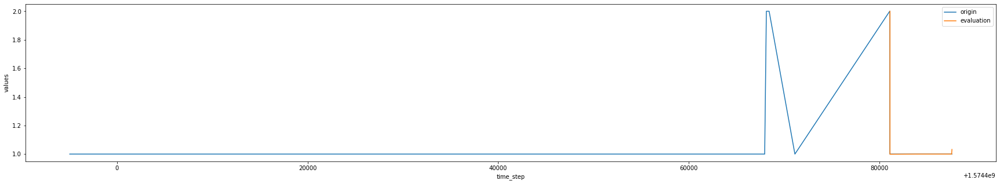

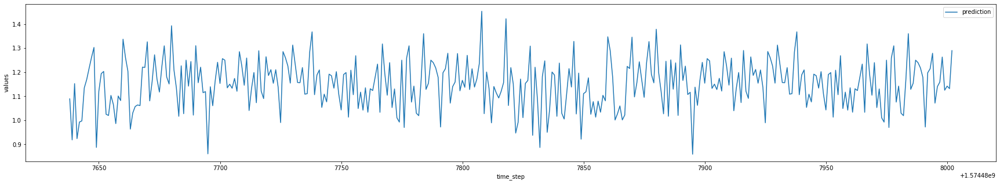

Zoro value files are there so it cannot be predicted


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpj4jdq0rw', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs':

{'times': array([1.57412327e+09, 1.57412488e+09, 1.57412492e+09, 1.57412494e+09,
       1.57412495e+09, 1.57412533e+09, 1.57412966e+09, 1.57421385e+09,
       1.57421386e+09, 1.57421405e+09, 1.57421406e+09, 1.57421408e+09,
       1.57421812e+09, 1.57421853e+09, 1.57429028e+09, 1.57429031e+09,
       1.57429032e+09, 1.57429070e+09, 1.57429070e+09, 1.57429220e+09,
       1.57430644e+09, 1.57430652e+09, 1.57432148e+09, 1.57439558e+09,
       1.57439560e+09, 1.57448019e+09, 1.57451972e+09, 1.57451974e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       3, 1, 1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpj4jdq0rw\model.ckpt.
INFO:tensorflow:loss = 2.1688144, step = 1
INFO:tensorflow:global_step/sec: 64.3979
INFO:tensorflow:loss = 0.33420792, step = 101 (1.554 sec)
INFO:tensorflow:global_step/sec: 46.8321
INFO:tensorflow:loss = 0.42072058, step = 201 (2.135 sec)
INFO:tensorflow:global_step/sec: 46.0788
INFO:tensorflow:loss = -0.04079823, step = 301 (2.170 sec)
INFO:tensorflow:Saving checkpoints for 400 into C:\Users\manis\AppData\Local\Temp\tmpj4jdq0rw\model.ckpt.
INFO:tensorflow:Loss for final step: -0.15372314.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:02:27Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpj4jdq0rw\model.ckpt-400
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:02:28
INFO:tensorflow:Saving dict for global step 400: average_loss = -0.1556292, covariance = [[[0.00148439]
  [0.0012682 ]
  [0.00134714]
  [0.00474603]
  [0.0176186 ]
  [0.00144896]
  [0.00111547]
  [0.00162616]
  [0.00130998]
  [0.00143792]]], global_step = 400, loss = -0.1556292, mean = [[[1.        ]
  [1.        ]
  [1.        ]
  [0.

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpj4jdq0rw\model.ckpt-400
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


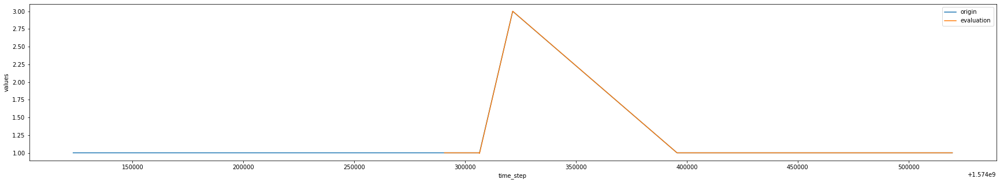

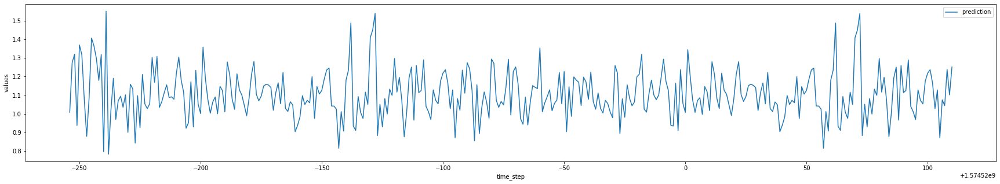

Zoro value files are there so it cannot be predicted


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpgceqnnyj', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs':

{'times': array([1.56171451e+09, 1.56468893e+09, 1.56468948e+09, 1.56468949e+09,
       1.56589558e+09, 1.56625097e+09, 1.56625125e+09, 1.56626035e+09,
       1.56626045e+09, 1.56626057e+09, 1.56637805e+09, 1.56637806e+09,
       1.56638757e+09, 1.56638758e+09, 1.56784651e+09, 1.56784652e+09,
       1.56940654e+09, 1.57395556e+09, 1.57395560e+09, 1.57395957e+09,
       1.57395958e+09, 1.57402898e+09, 1.57402898e+09, 1.57405265e+09,
       1.57405265e+09, 1.57414491e+09, 1.57428554e+09, 1.57428554e+09,
       1.57428565e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into C:\Users\manis\AppData\Local\Temp\tmpgceqnnyj\model.ckpt.
INFO:tensorflow:loss = 1.3820422, step = 1
INFO:tensorflow:global_step/sec: 85.4065
INFO:tensorflow:loss = 0.38894027, step = 101 (1.173 sec)
INFO:tensorflow:global_step/sec: 58.397
INFO:tensorflow:loss = 0.12856601, step = 201 (1.711 sec)
INFO:tensorflow:global_step/sec: 60.0405
INFO:tensorflow:loss = 0.5339716, step = 301 (1.665 sec)
INFO:tensorflow:Saving checkpoints for 400 into C:\Users\manis\AppData\Local\Temp\tmpgceqnnyj\model.ckpt.
INFO:tensorflow:Loss for final step: -0.04708392.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:02:42Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpgceqnnyj\model.ckpt-400
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:02:43
INFO:tensorflow:Saving dict for global step 400: average_loss = -0.053989343, covariance = [[[0.00036378]
  [0.0006646 ]
  [0.00299362]
  [0.00137814]
  [0.00041827]
  [0.00066994]
  [0.00069476]
  [0.00090413]
  [0.000515  ]
  [0.00063778]]], global_step = 400, loss = -0.053989343, mean = [[[1.0009218 ]
  [1.        ]
  [0.9926902 ]
 

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\manis\AppData\Local\Temp\tmpgceqnnyj\model.ckpt-400
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


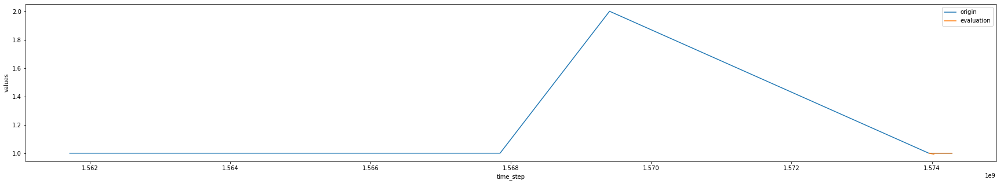

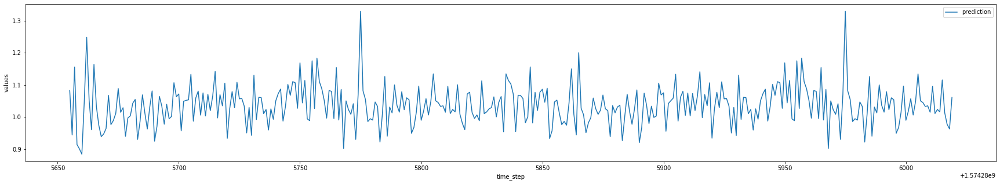

In [149]:
getcommitscsv(repos_df)
tensorflowcommits()
#getcommitscsv(repos_dfmaterial)
#tensorflowcommits()
print("Zoro value files are there so it cannot be predicted")
getcommitscsv(repos_dfangularcli)
tensorflowcommits()
#getcommitscsv(repos_dfangulargooglemaps)
#tensorflowcommits()
print("Zoro value files are there so it cannot be predicted")
getcommitscsv(repos_dfd3)
tensorflowcommits()




# 8.8 tensor

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmplz9sq0r_', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs':

{'times': array([1.47572790e+09, 1.47856456e+09, 1.48056952e+09, 1.48179012e+09,
       1.48973562e+09, 1.49276770e+09, 1.49507906e+09, 1.50295659e+09,
       1.50398119e+09, 1.51329096e+09, 1.51519855e+09, 1.51555113e+09,
       1.51927977e+09, 1.52011469e+09, 1.52548982e+09, 1.52944813e+09,
       1.53255697e+09, 1.53558106e+09, 1.54074796e+09, 1.54283678e+09,
       1.54572116e+09, 1.54693362e+09, 1.55191405e+09, 1.55193502e+09,
       1.56022971e+09, 1.56400179e+09, 1.56453353e+09, 1.57369810e+09,
       1.57446845e+09, 1.57448764e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:03:09Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:03:10
INFO:tensorflow:Saving dict for global step 0: average_loss = 1.4797765, covariance = [[[1.4162241 ]
  [2.539732  ]
  [1.085041  ]
  [1.3911823 ]
  [0.85570216]
  [1.2553616 ]
  [1.1402923 ]
  [1.7630478 ]
  [1.5992154 ]
  [0.42691907]]], global_step = 0, loss = 1.4797765, mean = [[[-0.3350373 ]
  [ 0.27835768]
  [-0.21925786]
  [-0.4153028 ]
  [-0.36943197]
  [ 0.61963856]
  [-0.28613153]
  [ 0.02565099]
  [ 0.45897633]
  [ 0.22015494]

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


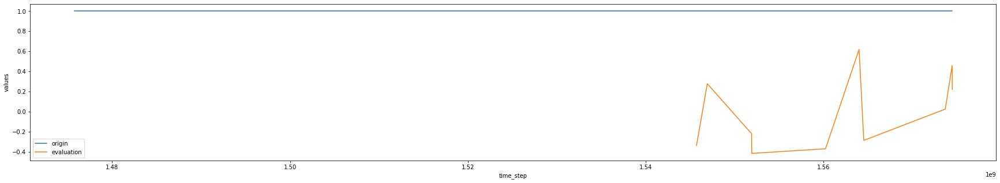

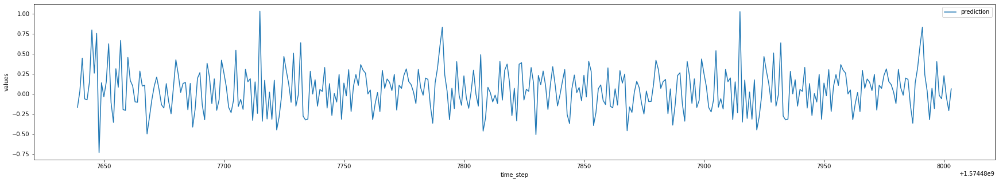

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmptrqanqp6', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020672E02348>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Could not find trained model in model_dir

{'times': array([1.50042008e+09, 1.50474653e+09, 1.51616143e+09, 1.51706757e+09,
       1.51800770e+09, 1.51813813e+09, 1.52047179e+09, 1.52047608e+09,
       1.52090193e+09, 1.52090993e+09, 1.52125156e+09, 1.52738340e+09,
       1.53031451e+09, 1.53303057e+09, 1.53663289e+09, 1.53724805e+09,
       1.54163851e+09, 1.56593677e+09, 1.56685679e+09, 1.56685855e+09,
       1.56793692e+09, 1.56922201e+09, 1.56929828e+09, 1.56955810e+09,
       1.56955948e+09, 1.56955993e+09, 1.56987809e+09, 1.57266762e+09,
       1.57272794e+09, 1.57428724e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:03:22Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:03:23
INFO:tensorflow:Saving dict for global step 0: average_loss = 1.4255036, covariance = [[[1.1032953 ]
  [0.52619183]
  [0.8472474 ]
  [0.88089436]
  [0.952389  ]
  [1.4423991 ]
  [0.9605891 ]
  [1.7250481 ]
  [1.3125536 ]
  [0.5562189 ]]], global_step = 0, loss = 1.4255036, mean = [[[-0.11096347]
  [ 0.36105853]
  [-0.01336354]
  [-0.29833665]
  [-0.4492954 ]
  [-0.08385717]
  [ 0.74350303]
  [ 0.11990838]
  [ 0.10554539]
  [ 0.20778583]

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


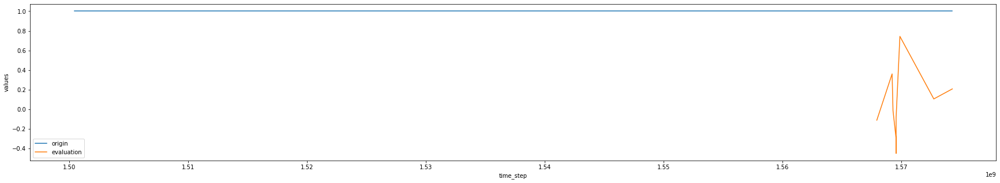

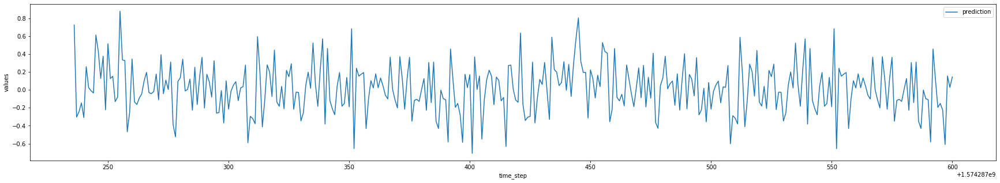

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpf3jdbcq2', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020671FD9F48>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Could not find trained model in model_dir

{'times': array([1.49575272e+09, 1.49809922e+09, 1.50179984e+09, 1.50354372e+09,
       1.51633812e+09, 1.51633899e+09, 1.51804831e+09, 1.52368054e+09,
       1.52826452e+09, 1.52827481e+09, 1.52827736e+09, 1.53506838e+09,
       1.54327934e+09, 1.54700582e+09, 1.54700688e+09, 1.54891534e+09,
       1.55062311e+09, 1.55442758e+09, 1.55532762e+09, 1.55727292e+09,
       1.55983304e+09, 1.56169159e+09, 1.56454656e+09, 1.56585088e+09,
       1.57426554e+09, 1.57428951e+09, 1.57447336e+09, 1.57451189e+09,
       1.57451974e+09, 1.57451976e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:03:35Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:03:36
INFO:tensorflow:Saving dict for global step 0: average_loss = 1.4988934, covariance = [[[1.9157352 ]
  [1.4932669 ]
  [0.9102767 ]
  [0.7257117 ]
  [2.1670566 ]
  [1.2217613 ]
  [0.75024027]
  [0.44230127]
  [0.6980525 ]
  [0.89776427]]], global_step = 0, loss = 1.4988934, mean = [[[ 0.9981866 ]
  [ 0.04079341]
  [-0.2201061 ]
  [-0.71622616]
  [ 0.0846492 ]
  [-0.1208559 ]
  [ 0.09934539]
  [ 0.07057468]
  [ 1.052292  ]
  [ 0.14423208]

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


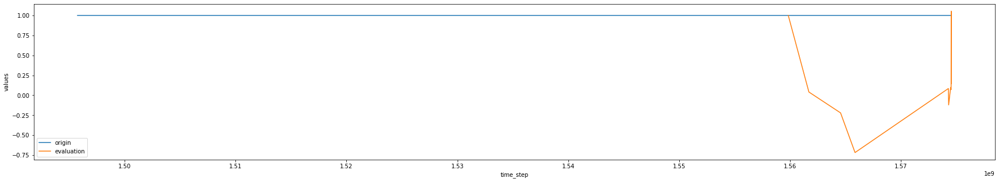

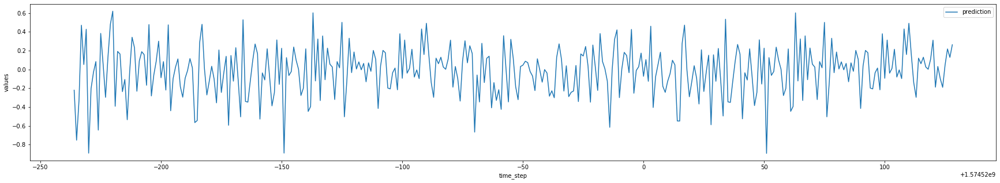

Zoro value files are there so it cannot be predicted
Zoro value files are there so it cannot be predicted


In [150]:

getbranchescsv(repos_df)
tensorflowbranches()
getbranchescsv(repos_dfmaterial)
tensorflowbranches()
getbranchescsv(repos_dfangularcli)
tensorflowbranches()
print("Zoro value files are there so it cannot be predicted")
#getbranchescsv(repos_dfangulargooglemaps)
#tensorflowbranches()
print("Zoro value files are there so it cannot be predicted")
#getbranchescsv(repos_dfd3)
#tensorflowbranches()



# 8.9 tensor

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpwqvtq8y_', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs':

{'times': array([1.57439503e+09, 1.57439578e+09, 1.57440522e+09, 1.57440534e+09,
       1.57440615e+09, 1.57446580e+09, 1.57446590e+09, 1.57446600e+09,
       1.57446630e+09, 1.57446635e+09, 1.57446746e+09, 1.57446798e+09,
       1.57446816e+09, 1.57446845e+09, 1.57447115e+09, 1.57448110e+09,
       1.57448113e+09, 1.57448113e+09, 1.57448381e+09, 1.57448384e+09,
       1.57448386e+09, 1.57448398e+09, 1.57448400e+09, 1.57448705e+09,
       1.57448760e+09, 1.57448764e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:03:52Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:03:53
INFO:tensorflow:Saving dict for global step 0: average_loss = 2.0284135, covariance = [[[0.6081368 ]
  [1.4007027 ]
  [2.2696269 ]
  [0.54566425]
  [0.6341148 ]
  [0.64896214]
  [0.87392455]
  [0.7585871 ]
  [0.9110602 ]
  [0.63344026]]], global_step = 0, loss = 2.0284135, mean = [[[ 0.7710499 ]
  [ 0.1315872 ]
  [-0.10803888]
  [-0.5297057 ]
  [ 0.13480273]
  [-0.20223755]
  [ 0.03882137]
  [-0.39302453]
  [-0.68397784]
  [-0.7973716 ]

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


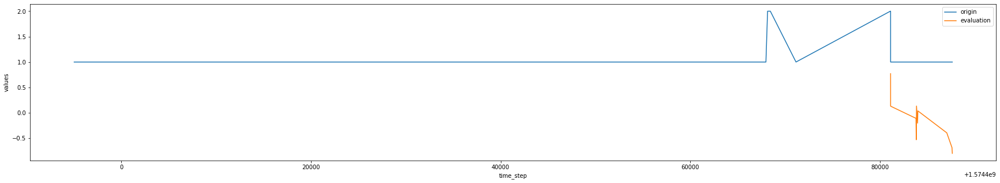

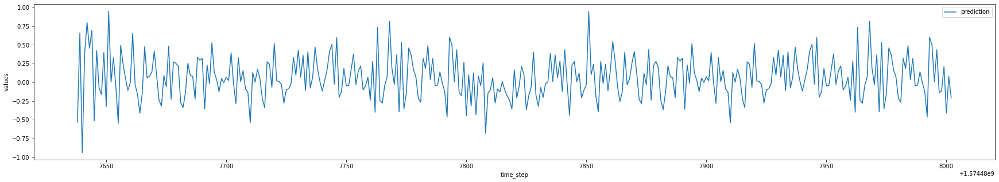

Zoro value files are there so it cannot be predicted


INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpxuftqfm6', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002066F4D6988>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Could not find trained model in model_dir

{'times': array([1.57412327e+09, 1.57412488e+09, 1.57412492e+09, 1.57412494e+09,
       1.57412495e+09, 1.57412533e+09, 1.57412966e+09, 1.57421385e+09,
       1.57421386e+09, 1.57421405e+09, 1.57421406e+09, 1.57421408e+09,
       1.57421812e+09, 1.57421853e+09, 1.57429028e+09, 1.57429031e+09,
       1.57429032e+09, 1.57429070e+09, 1.57429070e+09, 1.57429220e+09,
       1.57430644e+09, 1.57430652e+09, 1.57432148e+09, 1.57439558e+09,
       1.57439560e+09, 1.57448019e+09, 1.57451972e+09, 1.57451974e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       3, 1, 1, 1, 1, 1])}


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:03:56Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:03:57
INFO:tensorflow:Saving dict for global step 0: average_loss = 1.9944828, covariance = [[[0.8394979]
  [2.274188 ]
  [1.3763573]
  [1.0347165]
  [0.6480569]
  [1.0559038]
  [0.8449482]
  [0.6390715]
  [1.3084137]
  [1.9973183]]], global_step = 0, loss = 1.9944828, mean = [[[ 0.25476265]
  [-0.20028383]
  [ 0.6281728 ]
  [-0.20628305]
  [ 0.09528699]
  [-0.13323562]
  [-0.14340873]
  [ 0.2532564 ]
  [ 0.3335699 ]
  [-0.5681408 ]]], observ

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


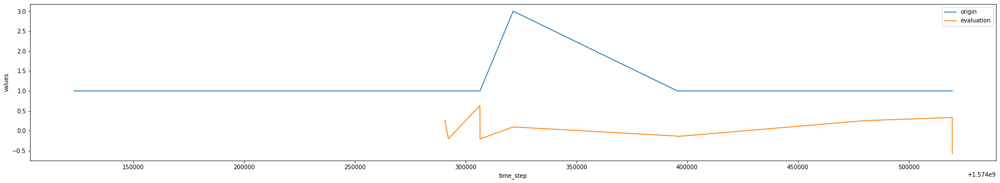

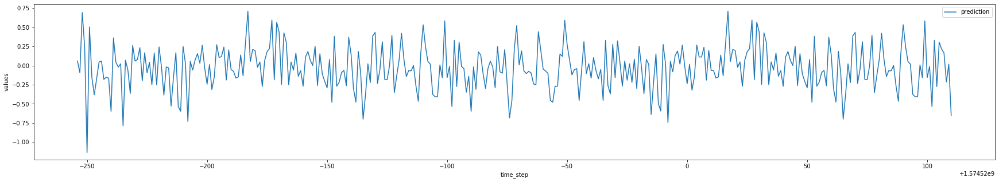

Zoro value files are there so it cannot be predicted


INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpaj4ma9yz', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020672E85348>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Could not find trained model in model_dir

{'times': array([1.56171451e+09, 1.56468893e+09, 1.56468948e+09, 1.56468949e+09,
       1.56589558e+09, 1.56625097e+09, 1.56625125e+09, 1.56626035e+09,
       1.56626045e+09, 1.56626057e+09, 1.56637805e+09, 1.56637806e+09,
       1.56638757e+09, 1.56638758e+09, 1.56784651e+09, 1.56784652e+09,
       1.56940654e+09, 1.57395556e+09, 1.57395560e+09, 1.57395957e+09,
       1.57395958e+09, 1.57402898e+09, 1.57402898e+09, 1.57405265e+09,
       1.57405265e+09, 1.57414491e+09, 1.57428554e+09, 1.57428554e+09,
       1.57428565e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:04:00Z
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:04:01
INFO:tensorflow:Saving dict for global step 0: average_loss = 1.6710488, covariance = [[[0.8081697 ]
  [2.1848092 ]
  [0.50153005]
  [0.8739029 ]
  [0.85565853]
  [1.3239341 ]
  [0.572798  ]
  [1.0193728 ]
  [0.91749436]
  [0.7619202 ]]], global_step = 0, loss = 1.6710488, mean = [[[-0.16251288]
  [ 0.52262336]
  [-0.3046128 ]
  [-0.630256

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


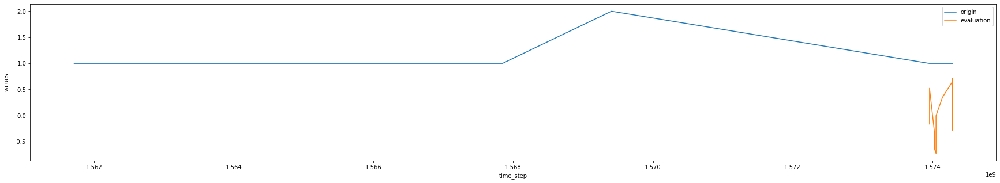

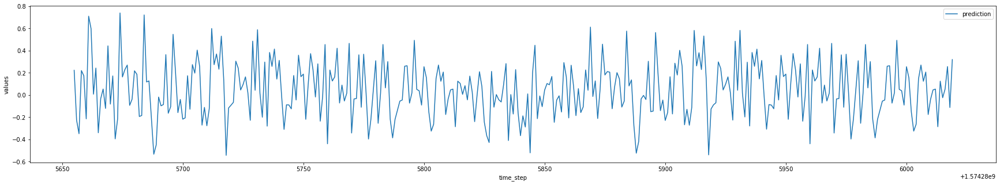

In [151]:


getcontricsv(repos_df)
tensorcontricsv()
print("Zoro value files are there so it cannot be predicted")
#getcontricsv(repos_dfmaterial)
#tensorcontricsv()
getcontricsv(repos_dfangularcli)
tensorcontricsv()
print("Zoro value files are there so it cannot be predicted")
#getcontricsv(repos_dfangulargooglemaps)
#tensorcontricsv()
getcontricsv(repos_dfd3)
tensorcontricsv()


# 8.10 Tensor

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmp9cmss72e', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs':

{'times': array([1.57439503e+09, 1.57439578e+09, 1.57440522e+09, 1.57440534e+09,
       1.57440615e+09, 1.57446580e+09, 1.57446590e+09, 1.57446600e+09,
       1.57446630e+09, 1.57446635e+09, 1.57446746e+09, 1.57446798e+09,
       1.57446816e+09, 1.57446845e+09, 1.57447115e+09, 1.57448110e+09,
       1.57448113e+09, 1.57448113e+09, 1.57448381e+09, 1.57448384e+09,
       1.57448386e+09, 1.57448398e+09, 1.57448400e+09, 1.57448705e+09,
       1.57448760e+09, 1.57448764e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:04:18Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:04:19
INFO:tensorflow:Saving dict for global step 0: average_loss = 1.7055646, covariance = [[[0.59240603]
  [1.018043  ]
  [1.249428  ]
  [1.008287  ]
  [1.4296561 ]
  [0.6073221 ]
  [2.0000176 ]
  [4.027934  ]
  [0.4462851 ]
  [0.5171424 ]]], global_step = 0, loss = 1.7055646, mean = [[[-0.19713096]
  [ 0.34422106]
  [-0.5060204 ]
  [ 0.8746226 ]
  [-0.03172626]
  [-0.06380963]
  [-0.08683627]
  [-0.21193588]
  [ 0.16721283]
  [ 0.7604416 ]

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


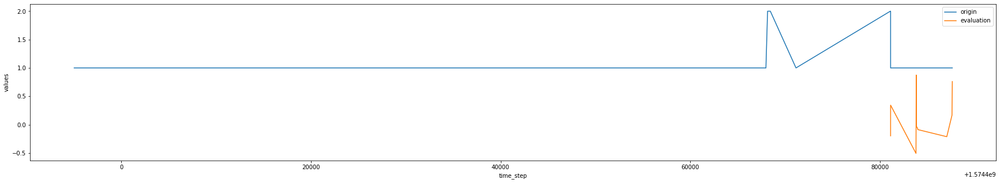

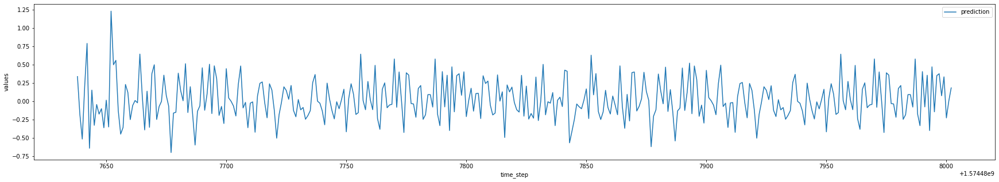

Zoro value files are there so it cannot be predicted


INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmpgkt56hoe', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020669644C48>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Could not find trained model in model_dir

{'times': array([1.57412327e+09, 1.57412488e+09, 1.57412492e+09, 1.57412494e+09,
       1.57412495e+09, 1.57412533e+09, 1.57412966e+09, 1.57421385e+09,
       1.57421386e+09, 1.57421405e+09, 1.57421406e+09, 1.57421408e+09,
       1.57421812e+09, 1.57421853e+09, 1.57429028e+09, 1.57429031e+09,
       1.57429032e+09, 1.57429070e+09, 1.57429070e+09, 1.57429220e+09,
       1.57430644e+09, 1.57430652e+09, 1.57432148e+09, 1.57439558e+09,
       1.57439560e+09, 1.57448019e+09, 1.57451972e+09, 1.57451974e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       3, 1, 1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:04:22Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:04:23
INFO:tensorflow:Saving dict for global step 0: average_loss = 2.2453597, covariance = [[[0.742749  ]
  [2.2686822 ]
  [0.71920526]
  [0.6138368 ]
  [0.782339  ]
  [0.5574046 ]
  [0.620629  ]
  [1.2402385 ]
  [1.3914468 ]
  [0.9521918 ]]], global_step = 0, loss = 2.2453597, mean = [[[ 0.11607494]
  [-0.12119993]
  [-0.39529458]
  [-0.34382606]
  [-0.16842541]
  [-0.11933419]
  [ 0.08020911]
  [-0.38520944]
  [ 0.36075625]
  [-0.21199632]

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


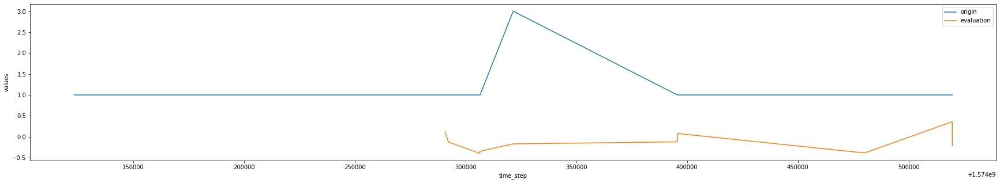

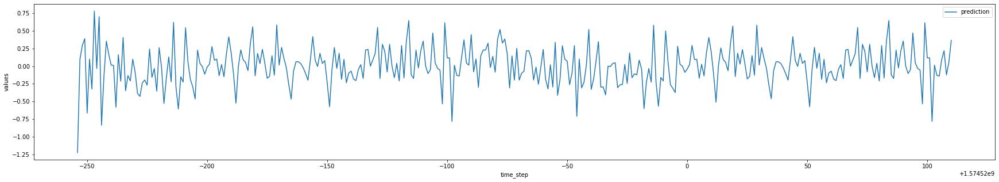

Zoro value files are there so it cannot be predicted


INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\manis\\AppData\\Local\\Temp\\tmprkan__fz', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020671AD6E48>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Could not find trained model in model_dir

{'times': array([1.56171451e+09, 1.56468893e+09, 1.56468948e+09, 1.56468949e+09,
       1.56589558e+09, 1.56625097e+09, 1.56625125e+09, 1.56626035e+09,
       1.56626045e+09, 1.56626057e+09, 1.56637805e+09, 1.56637806e+09,
       1.56638757e+09, 1.56638758e+09, 1.56784651e+09, 1.56784652e+09,
       1.56940654e+09, 1.57395556e+09, 1.57395560e+09, 1.57395957e+09,
       1.57395958e+09, 1.57402898e+09, 1.57402898e+09, 1.57405265e+09,
       1.57405265e+09, 1.57414491e+09, 1.57428554e+09, 1.57428554e+09,
       1.57428565e+09]), 'values': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1])}


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-11-24T23:04:26Z


INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Evaluation [100/1000]
INFO:tensorflow:Evaluation [200/1000]
INFO:tensorflow:Evaluation [300/1000]
INFO:tensorflow:Evaluation [400/1000]
INFO:tensorflow:Evaluation [500/1000]
INFO:tensorflow:Evaluation [600/1000]
INFO:tensorflow:Evaluation [700/1000]
INFO:tensorflow:Evaluation [800/1000]
INFO:tensorflow:Evaluation [900/1000]
INFO:tensorflow:Evaluation [1000/1000]
INFO:tensorflow:Finished evaluation at 2019-11-24-23:04:27
INFO:tensorflow:Saving dict for global step 0: average_loss = 1.4006789, covariance = [[[0.8386338 ]
  [0.8080444 ]
  [1.5494484 ]
  [1.6882675 ]
  [0.83999753]
  [0.41790906]
  [1.2946527 ]
  [0.5987781 ]
  [0.9947992 ]
  [0.5647872 ]]], global_step = 0, loss = 1.4006789, mean = [[[ 0.02237058]
  [ 0.0450966 ]
  [ 0.46280193]
  [-0.93595797]
  [ 0.03679946]
  [ 0.12499518]
  [ 0.4218199 ]
  [ 0.5465543 ]
  [ 0.19801497]
  [ 0.10169666]

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


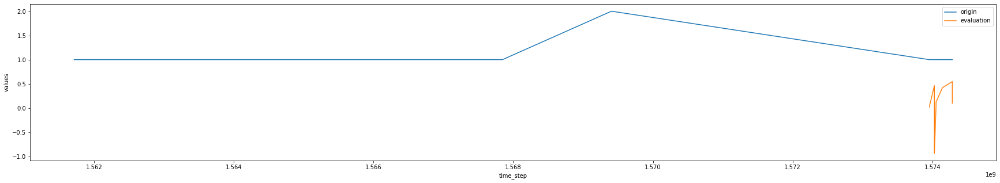

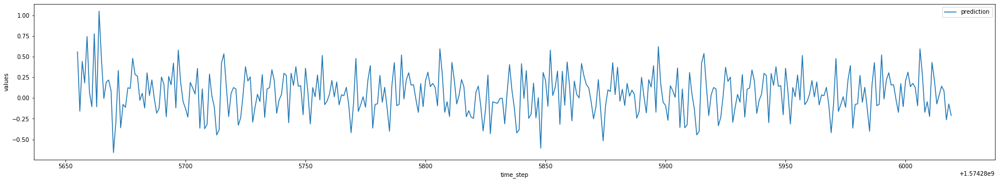

In [152]:

getreleasescv(repos_df)
tensorflowrelease()
print("Zoro value files are there so it cannot be predicted")
#getreleasescv(repos_dfmaterial)
#tensorflowrelease()
getreleasescv(repos_dfangularcli)
tensorflowrelease()
print("Zoro value files are there so it cannot be predicted")
#getreleasescv(repos_dfangulargooglemaps)
#tensorflowrelease()
getreleasescv(repos_dfd3)
tensorflowrelease()

### StatsModel

In [153]:
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error
import numpy
from statsmodels.tsa.seasonal import seasonal_decompose

def parser(x):
    return datetime.strptime(x, '%Y-%m-%d')
def timeseries(csv_file):
    series = read_csv(csv_file, header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parser)
    X = series.values
    size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(1,0,0))
        model_fit = model.fit(disp=0)
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
    error = mean_squared_error(test, predictions)
    print('Test MSE: %.3f' % error)
    # plot
    pyplot.plot(test)
    pyplot.plot(predictions, color='red')
    pyplot.show()
    
    result = seasonal_decompose(list(predictions), model='additive', freq=1)
    result.plot()
    pyplot.show()

#### Req 8.1 : The day of the week maximum number of issues created

predicted=13.086276, expected=8.000000
predicted=12.928589, expected=8.000000
predicted=12.780521, expected=13.000000
predicted=14.920769, expected=10.000000
predicted=13.556546, expected=26.000000
predicted=20.412395, expected=9.000000
predicted=13.468854, expected=13.000000
predicted=15.008015, expected=12.000000
predicted=14.576599, expected=12.000000
predicted=14.537144, expected=18.000000
predicted=16.924771, expected=16.000000
predicted=16.136370, expected=12.000000
predicted=14.535153, expected=15.000000
predicted=15.708470, expected=18.000000
predicted=16.897925, expected=15.000000
predicted=15.714420, expected=11.000000
predicted=14.108941, expected=13.000000
predicted=14.871411, expected=13.000000
predicted=14.848436, expected=15.000000
predicted=15.633286, expected=18.000000
predicted=16.830090, expected=12.000000
predicted=14.445458, expected=12.000000
predicted=14.412745, expected=16.000000
predicted=15.993073, expected=8.000000
predicted=12.797983, expected=20.000000
pred

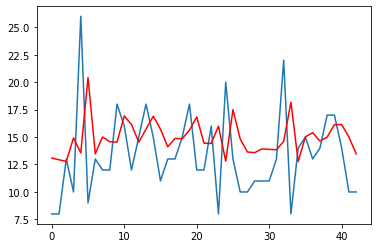

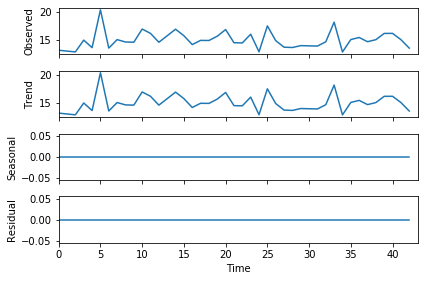

In [154]:
# repo:angular/angular
timeseries("issues_created_1.csv")

predicted=2.009812, expected=2.000000
predicted=2.009717, expected=2.000000
predicted=2.009624, expected=3.000000
predicted=2.348625, expected=2.000000
predicted=2.015822, expected=2.000000
predicted=2.015675, expected=2.000000
predicted=2.015530, expected=3.000000
predicted=2.351117, expected=2.000000
predicted=2.021456, expected=2.000000
predicted=2.021263, expected=2.000000
predicted=2.021073, expected=2.000000
predicted=2.020887, expected=2.000000
predicted=2.020703, expected=3.000000
predicted=2.352798, expected=1.000000
predicted=1.705137, expected=1.000000
predicted=1.692862, expected=1.000000
predicted=1.681011, expected=1.000000
predicted=1.669561, expected=1.000000
predicted=1.658493, expected=1.000000
predicted=1.647789, expected=1.000000
predicted=1.637429, expected=1.000000
predicted=1.627398, expected=6.000000
predicted=3.283409, expected=1.000000
predicted=1.741010, expected=1.000000
predicted=1.730011, expected=1.000000
predicted=1.719335, expected=1.000000
predicted=1.

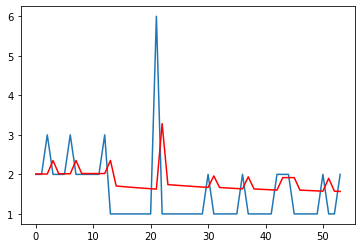

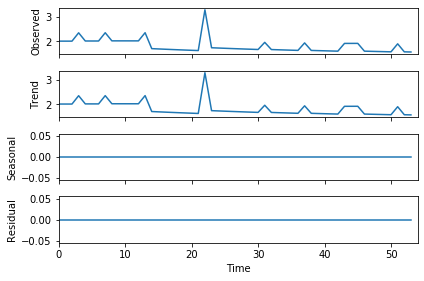

In [155]:
# repo:angular/material
timeseries("issues_created_2.csv")

predicted=12.650790, expected=6.000000
predicted=12.529554, expected=6.000000
predicted=12.412695, expected=9.000000
predicted=12.912559, expected=8.000000
predicted=12.657671, expected=7.000000
predicted=12.384295, expected=10.000000
predicted=12.930303, expected=10.000000
predicted=12.895180, expected=14.000000
predicted=13.688055, expected=21.000000
predicted=15.130906, expected=13.000000
predicted=13.547907, expected=10.000000
predicted=12.929827, expected=10.000000
predicted=12.896321, expected=9.000000
predicted=12.655761, expected=7.000000
predicted=12.189575, expected=8.000000
predicted=12.332565, expected=8.000000
predicted=12.277594, expected=8.000000
predicted=12.224009, expected=10.000000
predicted=12.612368, expected=9.000000
predicted=12.365247, expected=7.000000
predicted=11.882492, expected=7.000000
predicted=11.818574, expected=5.000000
predicted=11.293030, expected=5.000000
predicted=11.195311, expected=8.000000
predicted=11.825441, expected=6.000000
predicted=11.3011

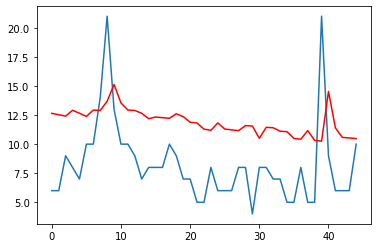

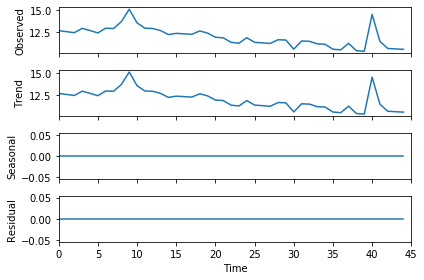

In [156]:
# repo:angular/angular-cli
timeseries("issues_created_3.csv")

predicted=2.343144, expected=1.000000
predicted=1.736927, expected=1.000000
predicted=1.722665, expected=2.000000
predicted=1.909506, expected=2.000000
predicted=1.910485, expected=3.000000
predicted=2.104908, expected=2.000000
predicted=1.920931, expected=1.000000
predicted=1.730429, expected=2.000000
predicted=1.913854, expected=1.000000
predicted=1.726842, expected=1.000000
predicted=1.713803, expected=1.000000
predicted=1.701226, expected=1.000000
predicted=1.689088, expected=1.000000
predicted=1.677366, expected=1.000000
predicted=1.666039, expected=1.000000
predicted=1.655087, expected=1.000000
predicted=1.644493, expected=2.000000
predicted=1.865411, expected=2.000000
predicted=1.866699, expected=1.000000
predicted=1.644298, expected=1.000000
predicted=1.634287, expected=2.000000
predicted=1.856285, expected=2.000000
predicted=1.857617, expected=2.000000
predicted=1.858924, expected=3.000000
predicted=2.087979, expected=2.000000
predicted=1.868364, expected=4.000000
predicted=2.

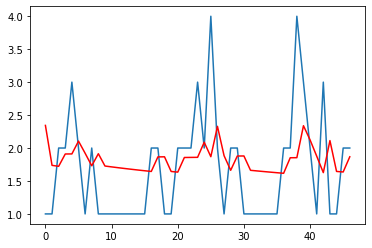

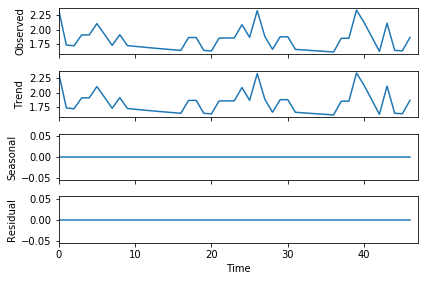

In [157]:
# repo:SebastianM/angular-google-maps
timeseries("issues_created_4.csv")

predicted=1.154933, expected=1.000000
predicted=1.149805, expected=1.000000
predicted=1.145009, expected=3.000000
predicted=1.458627, expected=1.000000
predicted=1.207272, expected=1.000000
predicted=1.201027, expected=1.000000
predicted=1.195149, expected=1.000000
predicted=1.189607, expected=1.000000
predicted=1.184374, expected=1.000000
predicted=1.179423, expected=1.000000
predicted=1.174732, expected=1.000000
predicted=1.170282, expected=2.000000
predicted=1.246266, expected=1.000000
predicted=1.188948, expected=1.000000
predicted=1.184376, expected=1.000000
predicted=1.180020, expected=1.000000
predicted=1.175867, expected=1.000000
predicted=1.171902, expected=1.000000
Test MSE: 0.270


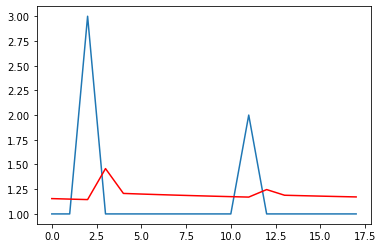

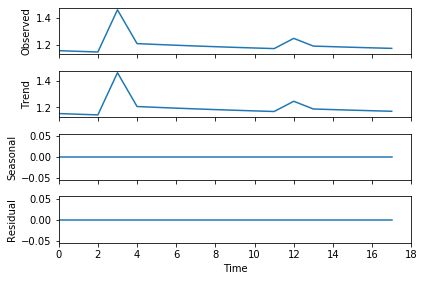

In [158]:
# repo:d3/d3
timeseries("issues_created_5.csv")

#### Req 8.2 : The day of the week maximum number of issues closed

predicted=16.549286, expected=9.000000
predicted=15.696753, expected=9.000000
predicted=15.500520, expected=8.000000
predicted=15.081132, expected=21.000000
predicted=17.789486, expected=13.000000
predicted=16.193175, expected=16.000000
predicted=16.760192, expected=12.000000
predicted=15.934939, expected=10.000000
predicted=15.433663, expected=12.000000
predicted=15.762062, expected=9.000000
predicted=15.015877, expected=21.000000
predicted=17.566571, expected=15.000000
predicted=16.339418, expected=10.000000
predicted=15.260204, expected=14.000000
predicted=16.042217, expected=17.000000
predicted=16.659312, expected=12.000000
predicted=15.600572, expected=17.000000
predicted=16.622089, expected=11.000000
predicted=15.363334, expected=18.000000
predicted=16.784072, expected=6.000000
predicted=14.345832, expected=11.000000
predicted=15.237035, expected=11.000000
predicted=15.167403, expected=22.000000
predicted=17.452067, expected=12.000000
predicted=15.446570, expected=19.000000
predi

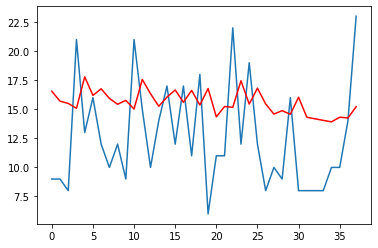

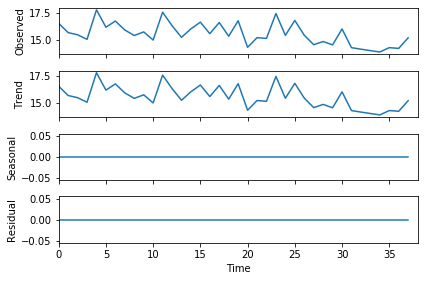

In [159]:
# repo:angular/angular
timeseries("issues_closed_1.csv")

predicted=2.324441, expected=1.000000
predicted=2.037064, expected=5.000000
predicted=3.093762, expected=4.000000
predicted=2.876039, expected=3.000000
predicted=2.620810, expected=3.000000
predicted=2.626201, expected=3.000000
predicted=2.631439, expected=1.000000
predicted=2.096185, expected=1.000000
predicted=2.070814, expected=3.000000
predicted=2.607291, expected=3.000000
predicted=2.612582, expected=3.000000
predicted=2.617733, expected=2.000000
predicted=2.351398, expected=2.000000
predicted=2.346829, expected=2.000000
predicted=2.342378, expected=1.000000
predicted=2.062486, expected=3.000000
predicted=2.595758, expected=1.000000
predicted=2.069961, expected=4.000000
predicted=2.830672, expected=3.000000
predicted=2.592929, expected=6.000000
predicted=3.381411, expected=3.000000
predicted=2.627310, expected=1.000000
predicted=2.127790, expected=2.000000
predicted=2.366318, expected=2.000000
predicted=2.362086, expected=1.000000
predicted=2.101812, expected=1.000000
predicted=2.

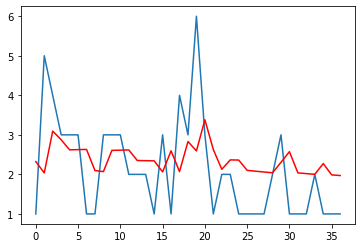

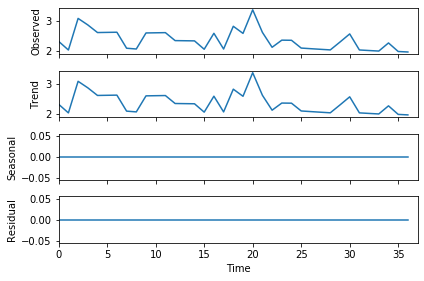

In [160]:
# repo:angular/material
timeseries("issues_closed_2.csv")

predicted=14.140959, expected=5.000000
predicted=13.855521, expected=6.000000
predicted=13.870550, expected=10.000000
predicted=14.799701, expected=8.000000
predicted=14.153359, expected=4.000000
predicted=12.843601, expected=14.000000
predicted=15.606896, expected=8.000000
predicted=13.863946, expected=8.000000
predicted=13.748758, expected=12.000000
predicted=14.845540, expected=15.000000
predicted=15.695332, expected=16.000000
predicted=15.981321, expected=12.000000
predicted=14.807186, expected=12.000000
predicted=14.771362, expected=10.000000
predicted=14.138586, expected=11.000000
predicted=14.380839, expected=8.000000
predicted=13.419232, expected=11.000000
predicted=14.260492, expected=5.000000
predicted=12.342997, expected=5.000000
predicted=12.172360, expected=5.000000
predicted=12.009548, expected=5.000000
predicted=11.854051, expected=10.000000
predicted=13.453296, expected=11.000000
predicted=13.751215, expected=6.000000
predicted=11.996182, expected=6.000000
predicted=11.

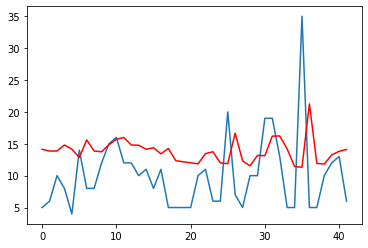

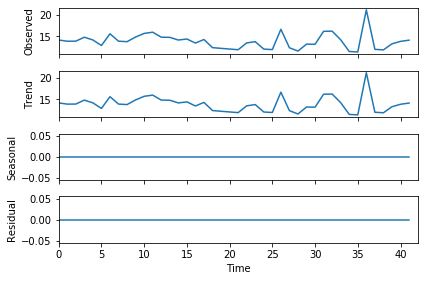

In [161]:
# repo:angular/angular-cli
timeseries("issues_closed_3.csv")

predicted=2.908048, expected=1.000000
predicted=2.880368, expected=1.000000
predicted=2.853476, expected=1.000000
predicted=2.827342, expected=3.000000
predicted=2.872121, expected=11.000000
predicted=3.149693, expected=1.000000
predicted=2.914543, expected=4.000000
predicted=2.980776, expected=1.000000
predicted=2.905305, expected=1.000000
predicted=2.880265, expected=1.000000
predicted=2.855876, expected=2.000000
predicted=2.863597, expected=1.000000
predicted=2.822101, expected=1.000000
predicted=2.799332, expected=1.000000
predicted=2.777133, expected=3.000000
predicted=2.820629, expected=7.000000
predicted=2.950534, expected=2.000000
predicted=2.837594, expected=1.000000
predicted=2.796851, expected=1.000000
predicted=2.775833, expected=1.000000
predicted=2.755304, expected=2.000000
predicted=2.768434, expected=2.000000
predicted=2.760164, expected=1.000000
predicted=2.719252, expected=1.000000
predicted=2.700227, expected=1.000000
predicted=2.681618, expected=1.000000
predicted=2

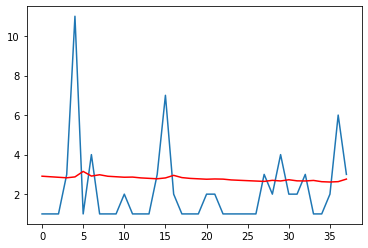

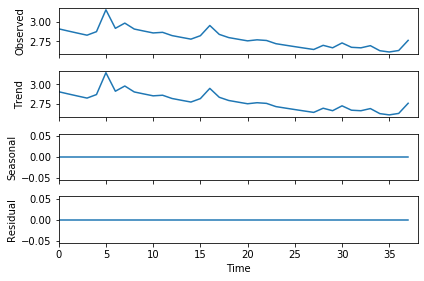

In [162]:
# repo:SebastianM/angular-google-maps
timeseries("issues_closed_4.csv")

predicted=1.538945, expected=2.000000
predicted=1.567763, expected=1.000000
predicted=1.593333, expected=1.000000
predicted=1.553613, expected=1.000000
predicted=1.518988, expected=1.000000
predicted=1.488525, expected=2.000000
predicted=1.517627, expected=1.000000
predicted=1.510981, expected=1.000000
predicted=1.484217, expected=1.000000
predicted=1.460165, expected=1.000000
predicted=1.438428, expected=1.000000
predicted=1.418685, expected=1.000000
predicted=1.400670, expected=1.000000
Test MSE: 0.248


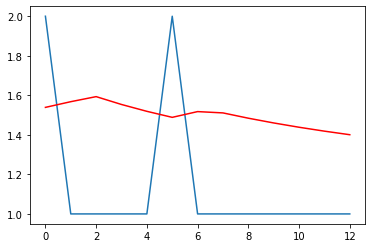

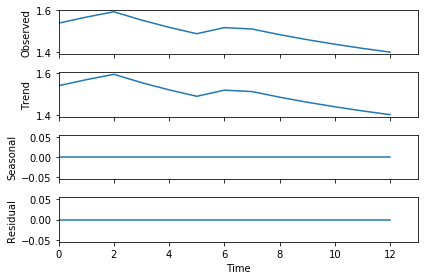

In [163]:
# repo:d3/d3
timeseries("issues_closed_5.csv")

#### Req 8.3 : The month of the year that has maximum number of issues closed

In [164]:
df_list_new[0]['closed_month_year'] = pd.to_datetime(df_list_new[0]['closed_at']).dt.to_period('M')
df_list_new[1]['closed_month_year'] = pd.to_datetime(df_list_new[1]['closed_at']).dt.to_period('M')
df_list_new[2]['closed_month_year'] = pd.to_datetime(df_list_new[2]['closed_at']).dt.to_period('M')
df_list_new[3]['closed_month_year'] = pd.to_datetime(df_list_new[3]['closed_at']).dt.to_period('M')
df_list_new[4]['closed_month_year'] = pd.to_datetime(df_list_new[4]['closed_at']).dt.to_period('M')

In [165]:
Max_angular = df_list_new[0].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_material = df_list_new[1].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_angularCli = df_list_new[2].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_angularmaps = df_list_new[3].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)
Max_d3 = df_list_new[4].groupby('closed_month_year').count()['issue_number'].idxmax(axis=0, skipna = True)

In [166]:
print("The month of the year that has maximum number of issues closed for angular repository :",Max_angular.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed for material repository :",Max_material.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed angular-cli repository :",Max_angularCli.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed angular-google-maps repository :",Max_angularmaps.strftime('%B %F'))
print("The month of the year that has maximum number of issues closed d3 repository :",Max_d3.strftime('%B %F'))

The month of the year that has maximum number of issues closed for angular repository : May 2018
The month of the year that has maximum number of issues closed for material repository : January 2018
The month of the year that has maximum number of issues closed angular-cli repository : October 2018
The month of the year that has maximum number of issues closed angular-google-maps repository : November 2018
The month of the year that has maximum number of issues closed d3 repository : March 2018


#### Req 8.4 : Plot the created issues forecast by calling the Prophet.plot method and passing in your forecast dataframe.

In [167]:
def parse_date(x):
    print(x)
    return datetime.strptime(x, '%Y-%m-%d')

def stat_fun_1(series):
    X = series.values
    size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions_data = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(1,0,0))
        model_fit = model.fit(disp=0)
        output = model_fit.forecast()
        yhat = output[0]
        predictions_data.append(yhat)
        obs = test[t]
        history.append(obs)
        #print('predicted=%f, expected=%f' % (yhat, obs))
    error = mean_squared_error(test, predictions_data)
    print('Test MSE: %.3f' % error)
    # plot
    pyplot.plot(test)
    pyplot.plot(predictions_data, color='red')
    pyplot.show()
    result = seasonal_decompose(list(predictions_data), model='additive', freq=1)
    result.plot()
    pyplot.show()
    
def statsmodel_dataframe_created(temp_df):
    b = temp_df.groupby(['created_at'])['created_at']
    b1 = b.describe()
    temp = pd.DataFrame()
    temp = b1[['top', 'count']]
    temp.columns = ['ds', 'y']
    return temp

angular_sm_df = pd.DataFrame(statsmodel_dataframe_created(df_1))
material_sm_df = pd.DataFrame(statsmodel_dataframe_created(df_2))
angular_cli_sm_df = pd.DataFrame(statsmodel_dataframe_created(df_3))
angular_google_sm_df = pd.DataFrame(statsmodel_dataframe_created(df_4))
d3_sm_df = pd.DataFrame(statsmodel_dataframe_created(df_5))

angular_sm_df.to_csv('angular_sm_created.csv', sep = ',', encoding = 'utf-8', index = False)
material_sm_df.to_csv('material_sm_created.csv', sep = ',', encoding = 'utf-8', index = False)
angular_cli_sm_df.to_csv('angular_cli_sm_created.csv', sep = ',', encoding = 'utf-8', index = False)
angular_google_sm_df.to_csv('angular_google_maps_sm_created.csv', sep = ',', encoding = 'utf-8', index = False)
d3_sm_df.to_csv('d3_sm_created.csv', sep = ',', encoding = 'utf-8', index = False)

['2017-11-24' '2017-11-25' '2017-11-26' '2017-11-27' '2017-11-28'
 '2017-11-29' '2017-11-30' '2017-12-01' '2017-12-02' '2017-12-03'
 '2017-12-04' '2017-12-05' '2017-12-06' '2017-12-07' '2017-12-08'
 '2017-12-09' '2017-12-10' '2017-12-11' '2017-12-12' '2017-12-13'
 '2017-12-14' '2017-12-15' '2017-12-16' '2017-12-17' '2017-12-18'
 '2017-12-19' '2017-12-20' '2017-12-21' '2017-12-22' '2017-12-23'
 '2017-12-24' '2017-12-25' '2017-12-26' '2017-12-27' '2017-12-28'
 '2017-12-29' '2017-12-30' '2017-12-31' '2018-01-01' '2018-01-02'
 '2018-01-03' '2018-01-04' '2018-01-05' '2018-01-06' '2018-01-07'
 '2018-01-08' '2018-01-09' '2018-01-10' '2018-01-11' '2018-01-12'
 '2018-01-13' '2018-01-14' '2018-01-15' '2018-01-16' '2018-01-17'
 '2018-01-18' '2018-01-19' '2018-01-20' '2018-01-21' '2018-01-22'
 '2018-01-23' '2018-01-24' '2018-01-25' '2018-01-26' '2018-01-27'
 '2018-01-28' '2018-01-29' '2018-01-30' '2018-01-31' '2018-02-01'
 '2018-02-02' '2018-02-03' '2018-02-04' '2018-02-05' '2018-02-06'
 '2018-02-

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Test MSE: 19.443


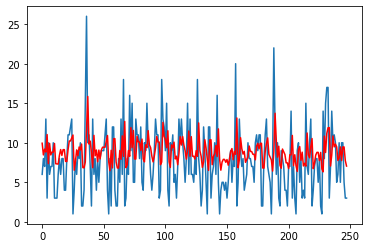

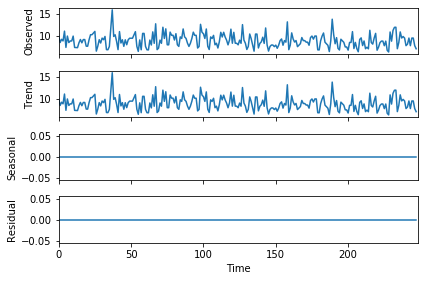

In [168]:
#repo: angular
series = read_csv('angular_sm_created.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2017-11-24' '2017-11-27' '2017-11-29' '2017-12-01' '2017-12-05'
 '2017-12-07' '2017-12-08' '2017-12-10' '2017-12-11' '2017-12-12'
 '2017-12-13' '2017-12-14' '2017-12-17' '2017-12-20' '2017-12-21'
 '2017-12-22' '2017-12-24' '2017-12-25' '2017-12-27' '2017-12-28'
 '2017-12-29' '2017-12-30' '2018-01-02' '2018-01-03' '2018-01-04'
 '2018-01-05' '2018-01-08' '2018-01-09' '2018-01-11' '2018-01-12'
 '2018-01-14' '2018-01-15' '2018-01-16' '2018-01-17' '2018-01-18'
 '2018-01-19' '2018-01-20' '2018-01-21' '2018-01-23' '2018-01-24'
 '2018-01-25' '2018-01-26' '2018-01-28' '2018-01-29' '2018-02-01'
 '2018-02-02' '2018-02-06' '2018-02-07' '2018-02-08' '2018-02-12'
 '2018-02-13' '2018-02-14' '2018-02-15' '2018-02-16' '2018-02-17'
 '2018-02-18' '2018-02-21' '2018-02-22' '2018-02-27' '2018-03-01'
 '2018-03-02' '2018-03-07' '2018-03-09' '2018-03-11' '2018-03-12'
 '2018-03-15' '2018-03-19' '2018-03-20' '2018-03-21' '2018-03-22'
 '2018-03-23' '2018-03-26' '2018-03-27' '2018-03-28' '2018-03-29'
 '2018-03-

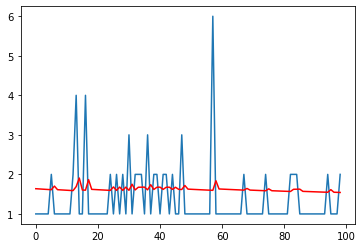

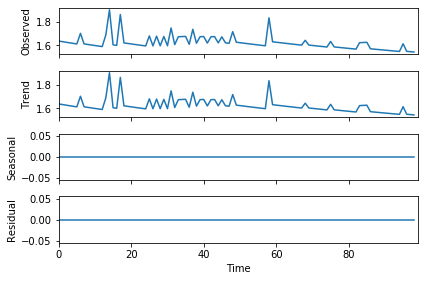

In [169]:
#repo: material
series = read_csv('material_sm_created.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2017-11-24' '2017-11-25' '2017-11-26' '2017-11-27' '2017-11-28'
 '2017-11-29' '2017-11-30' '2017-12-01' '2017-12-02' '2017-12-03'
 '2017-12-04' '2017-12-05' '2017-12-06' '2017-12-07' '2017-12-08'
 '2017-12-09' '2017-12-10' '2017-12-11' '2017-12-12' '2017-12-13'
 '2017-12-14' '2017-12-15' '2017-12-16' '2017-12-17' '2017-12-18'
 '2017-12-19' '2017-12-20' '2017-12-21' '2017-12-22' '2017-12-23'
 '2017-12-24' '2017-12-25' '2017-12-26' '2017-12-27' '2017-12-28'
 '2017-12-29' '2017-12-30' '2017-12-31' '2018-01-01' '2018-01-02'
 '2018-01-03' '2018-01-04' '2018-01-05' '2018-01-06' '2018-01-07'
 '2018-01-08' '2018-01-09' '2018-01-10' '2018-01-11' '2018-01-12'
 '2018-01-13' '2018-01-14' '2018-01-15' '2018-01-16' '2018-01-17'
 '2018-01-18' '2018-01-19' '2018-01-20' '2018-01-21' '2018-01-22'
 '2018-01-23' '2018-01-24' '2018-01-25' '2018-01-26' '2018-01-27'
 '2018-01-28' '2018-01-29' '2018-01-30' '2018-01-31' '2018-02-01'
 '2018-02-02' '2018-02-03' '2018-02-04' '2018-02-05' '2018-02-06'
 '2018-02-

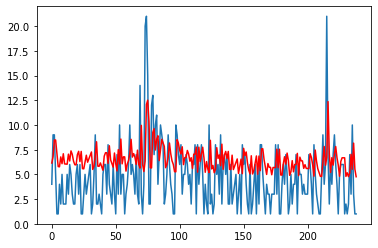

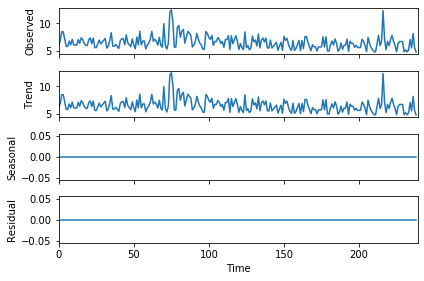

In [170]:
#repo: angular-cli
series = read_csv('angular_cli_sm_created.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2017-11-24' '2017-11-26' '2017-11-27' '2017-11-29' '2017-11-30'
 '2017-12-02' '2017-12-07' '2017-12-09' '2017-12-11' '2017-12-13'
 '2017-12-15' '2017-12-16' '2017-12-18' '2017-12-19' '2017-12-20'
 '2017-12-22' '2017-12-24' '2017-12-25' '2018-01-01' '2018-01-03'
 '2018-01-07' '2018-01-09' '2018-01-10' '2018-01-11' '2018-01-13'
 '2018-01-15' '2018-01-16' '2018-01-22' '2018-01-24' '2018-01-25'
 '2018-01-26' '2018-01-31' '2018-02-02' '2018-02-04' '2018-02-05'
 '2018-02-06' '2018-02-07' '2018-02-08' '2018-02-12' '2018-02-14'
 '2018-02-15' '2018-02-17' '2018-02-19' '2018-02-21' '2018-02-22'
 '2018-02-23' '2018-02-26' '2018-02-27' '2018-02-28' '2018-03-01'
 '2018-03-02' '2018-03-03' '2018-03-04' '2018-03-06' '2018-03-08'
 '2018-03-09' '2018-03-10' '2018-03-12' '2018-03-13' '2018-03-15'
 '2018-03-16' '2018-03-19' '2018-03-20' '2018-03-21' '2018-03-22'
 '2018-03-26' '2018-03-27' '2018-03-29' '2018-03-30' '2018-04-04'
 '2018-04-05' '2018-04-06' '2018-04-15' '2018-04-17' '2018-04-18'
 '2018-04-

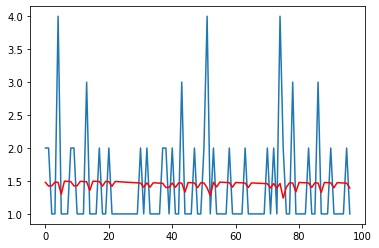

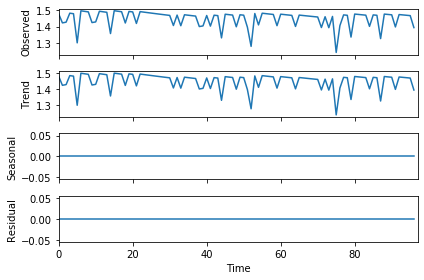

In [171]:
#repo: angular-google-maps
series = read_csv('angular_google_maps_sm_created.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2017-11-29' '2017-12-01' '2017-12-08' '2017-12-13' '2017-12-18'
 '2018-01-02' '2018-01-05' '2018-01-12' '2018-01-16' '2018-01-20'
 '2018-01-23' '2018-01-26' '2018-01-28' '2018-01-29' '2018-01-30'
 '2018-02-04' '2018-02-05' '2018-02-07' '2018-02-08' '2018-02-14'
 '2018-02-19' '2018-02-26' '2018-02-28' '2018-03-01' '2018-03-02'
 '2018-03-06' '2018-03-07' '2018-03-08' '2018-03-09' '2018-03-15'
 '2018-03-16' '2018-03-19' '2018-03-20' '2018-03-22' '2018-03-23'
 '2018-03-27' '2018-03-28' '2018-03-29' '2018-04-16' '2018-04-17'
 '2018-04-25' '2018-04-27' '2018-04-30' '2019-07-30' '2019-08-01'
 '2019-08-02' '2019-08-11' '2019-08-12' '2019-08-15' '2019-08-16'
 '2019-08-27' '2019-08-28' '2019-08-30' '2019-09-17' '2019-10-08'
 '2019-10-18' '2019-10-23' '2019-11-05' '2019-11-15' '2019-11-18'
 '2019-11-21']
2017-11-29
2017-12-01
2017-12-08
2017-12-13
2017-12-18
2018-01-02
2018-01-05
2018-01-12
2018-01-16
2018-01-20
2018-01-23
2018-01-26
2018-01-28
2018-01-29
2018-01-30
2018-02-04
2018-02-05
2018-0

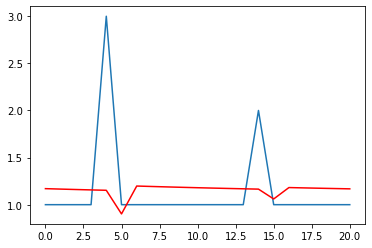

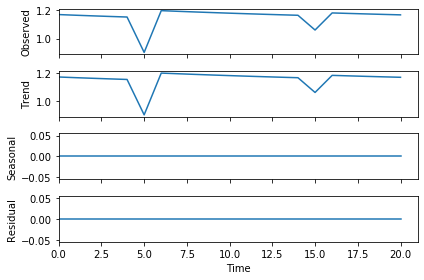

In [172]:
#repo: d3
series = read_csv('d3_sm_created.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

#### Req 8.5 : Plot the closed issues forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

In [173]:
def parse_date(x):
    print(x)
    return datetime.strptime(x, '%Y-%m-%d')

def stat_fun_1(series):
    X = series.values
    size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions_data = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(1,0,0))
        model_fit = model.fit(disp=0)
        output = model_fit.forecast()
        yhat = output[0]
        predictions_data.append(yhat)
        obs = test[t]
        history.append(obs)
        #print('predicted=%f, expected=%f' % (yhat, obs))
    error = mean_squared_error(test, predictions_data)
    print('Test MSE: %.3f' % error)
    # plot
    pyplot.plot(test)
    pyplot.plot(predictions_data, color='red')
    pyplot.show()
    result = seasonal_decompose(list(predictions_data), model='additive', freq=1)
    result.plot()
    pyplot.show()
    
def statsmodel_dataframe_closed(temp_df):
    b = temp_df.groupby(['closed_at'])['closed_at']
    b1 = b.describe()
    temp = pd.DataFrame()
    temp = b1[['top', 'count']]
    temp.columns = ['ds', 'y']
    return temp

angular_sm_df = pd.DataFrame(statsmodel_dataframe_closed(df_1))
material_sm_df = pd.DataFrame(statsmodel_dataframe_closed(df_2))
angular_cli_sm_df = pd.DataFrame(statsmodel_dataframe_closed(df_3))
angular_google_sm_df = pd.DataFrame(statsmodel_dataframe_closed(df_4))
d3_sm_df = pd.DataFrame(statsmodel_dataframe_closed(df_5))

angular_sm_df.to_csv('angular_sm_closed.csv', sep = ',', encoding = 'utf-8', index = False)
material_sm_df.to_csv('material_sm_closed.csv', sep = ',', encoding = 'utf-8', index = False)
angular_cli_sm_df.to_csv('angular_cli_sm_closed.csv', sep = ',', encoding = 'utf-8', index = False)
angular_google_sm_df.to_csv('angular_google_maps_sm_closed.csv', sep = ',', encoding = 'utf-8', index = False)
d3_sm_df.to_csv('d3_sm_closed.csv', sep = ',', encoding = 'utf-8', index = False)

['2017-11-24' '2017-11-26' '2017-11-27' '2017-11-28' '2017-11-29'
 '2017-11-30' '2017-12-01' '2017-12-02' '2017-12-03' '2017-12-04'
 '2017-12-05' '2017-12-06' '2017-12-07' '2017-12-08' '2017-12-09'
 '2017-12-10' '2017-12-11' '2017-12-12' '2017-12-13' '2017-12-14'
 '2017-12-15' '2017-12-18' '2017-12-19' '2017-12-20' '2017-12-21'
 '2017-12-22' '2017-12-23' '2017-12-24' '2017-12-25' '2017-12-26'
 '2017-12-27' '2017-12-28' '2017-12-29' '2017-12-30' '2017-12-31'
 '2018-01-01' '2018-01-02' '2018-01-03' '2018-01-04' '2018-01-05'
 '2018-01-06' '2018-01-07' '2018-01-08' '2018-01-09' '2018-01-10'
 '2018-01-11' '2018-01-12' '2018-01-13' '2018-01-14' '2018-01-15'
 '2018-01-16' '2018-01-17' '2018-01-18' '2018-01-19' '2018-01-20'
 '2018-01-22' '2018-01-23' '2018-01-24' '2018-01-25' '2018-01-26'
 '2018-01-27' '2018-01-28' '2018-01-29' '2018-01-30' '2018-01-31'
 '2018-02-01' '2018-02-02' '2018-02-04' '2018-02-05' '2018-02-06'
 '2018-02-07' '2018-02-08' '2018-02-09' '2018-02-10' '2018-02-12'
 '2018-02-

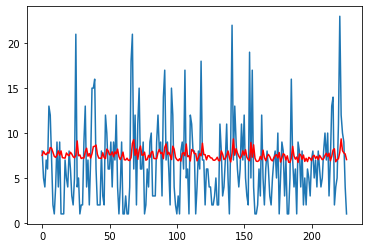

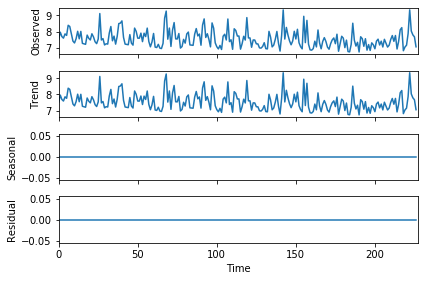

In [174]:
#repo: angular
series = read_csv('angular_sm_closed.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2017-11-27' '2017-11-28' '2017-12-10' '2017-12-13' '2017-12-21'
 '2017-12-27' '2018-01-05' '2018-01-10' '2018-01-11' '2018-01-13'
 '2018-01-14' '2018-01-16' '2018-01-17' '2018-01-19' '2018-01-20'
 '2018-01-21' '2018-01-22' '2018-01-24' '2018-01-26' '2018-01-29'
 '2018-02-08' '2018-02-11' '2018-02-12' '2018-02-13' '2018-02-18'
 '2018-02-20' '2018-02-26' '2018-02-27' '2018-03-01' '2018-03-05'
 '2018-03-12' '2018-03-16' '2018-03-21' '2018-03-22' '2018-03-23'
 '2018-03-25' '2018-03-26' '2018-03-27' '2018-03-30' '2018-04-05'
 '2018-04-07' '2018-04-09' '2018-04-10' '2018-04-11' '2018-04-17'
 '2018-04-18' '2018-04-19' '2018-04-21' '2018-04-23' '2018-04-25'
 '2018-04-27' '2018-05-03' '2018-05-15' '2018-05-16' '2018-05-17'
 '2018-05-19' '2018-05-24' '2018-05-25' '2018-05-26' '2018-05-27'
 '2018-05-29' '2018-05-30' '2018-05-31' '2018-06-05' '2018-06-08'
 '2018-06-10' '2018-06-12' '2018-06-13' '2018-06-14' '2018-06-19'
 '2018-06-20' '2018-06-21' '2018-06-22' '2018-06-26' '2018-06-29'
 '2018-07-

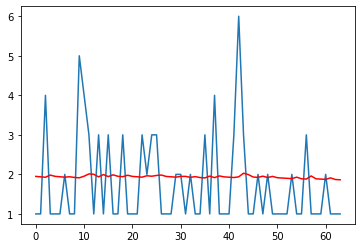

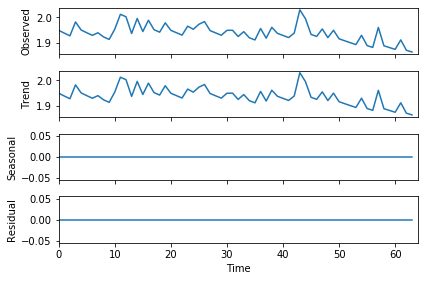

In [175]:
#repo: material
series = read_csv('material_sm_closed.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2017-11-24' '2017-11-25' '2017-11-26' '2017-11-27' '2017-11-28'
 '2017-11-30' '2017-12-01' '2017-12-02' '2017-12-03' '2017-12-04'
 '2017-12-05' '2017-12-06' '2017-12-07' '2017-12-08' '2017-12-11'
 '2017-12-12' '2017-12-13' '2017-12-14' '2017-12-16' '2017-12-17'
 '2017-12-18' '2017-12-19' '2017-12-20' '2017-12-21' '2017-12-22'
 '2017-12-23' '2017-12-25' '2017-12-26' '2017-12-27' '2017-12-28'
 '2017-12-29' '2017-12-30' '2018-01-01' '2018-01-02' '2018-01-03'
 '2018-01-04' '2018-01-05' '2018-01-07' '2018-01-08' '2018-01-09'
 '2018-01-10' '2018-01-11' '2018-01-12' '2018-01-13' '2018-01-15'
 '2018-01-16' '2018-01-17' '2018-01-18' '2018-01-19' '2018-01-20'
 '2018-01-21' '2018-01-22' '2018-01-23' '2018-01-24' '2018-01-25'
 '2018-01-26' '2018-01-27' '2018-01-29' '2018-01-30' '2018-01-31'
 '2018-02-01' '2018-02-02' '2018-02-03' '2018-02-04' '2018-02-05'
 '2018-02-06' '2018-02-07' '2018-02-08' '2018-02-09' '2018-02-12'
 '2018-02-13' '2018-02-14' '2018-02-15' '2018-02-16' '2018-02-18'
 '2018-02-

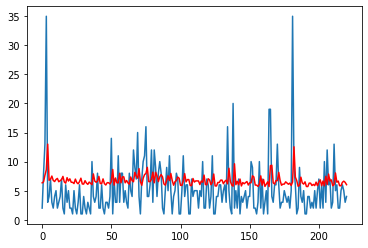

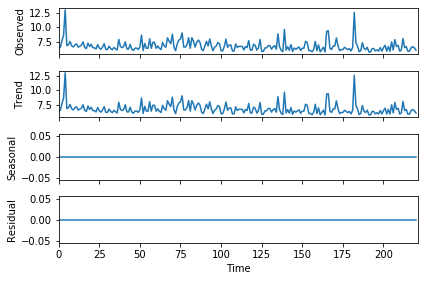

In [176]:
#repo: angular-cli
series = read_csv('angular_cli_sm_closed.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2017-12-02' '2017-12-17' '2017-12-18' '2018-01-03' '2018-01-22'
 '2018-01-31' '2018-02-01' '2018-02-02' '2018-02-13' '2018-02-15'
 '2018-02-21' '2018-02-23' '2018-02-26' '2018-02-28' '2018-03-01'
 '2018-03-02' '2018-03-03' '2018-03-06' '2018-03-07' '2018-03-13'
 '2018-03-18' '2018-03-19' '2018-03-21' '2018-03-27' '2018-04-06'
 '2018-04-16' '2018-04-19' '2018-04-21' '2018-04-30' '2018-05-01'
 '2018-05-18' '2018-05-23' '2018-05-24' '2018-05-30' '2018-06-06'
 '2018-06-07' '2018-06-10' '2018-06-12' '2018-07-02' '2018-07-04'
 '2018-07-22' '2018-07-28' '2018-08-15' '2018-08-21' '2018-09-18'
 '2018-09-19' '2018-09-24' '2018-10-10' '2018-11-14' '2018-11-20'
 '2018-11-22' '2018-11-23' '2018-11-25' '2018-11-30' '2018-12-02'
 '2018-12-03' '2018-12-04' '2018-12-06' '2018-12-08' '2018-12-09'
 '2018-12-12' '2018-12-18' '2018-12-19' '2018-12-23' '2018-12-24'
 '2018-12-30' '2019-01-01' '2019-01-02' '2019-01-06' '2019-01-08'
 '2019-01-10' '2019-01-12' '2019-01-14' '2019-01-15' '2019-01-17'
 '2019-01-

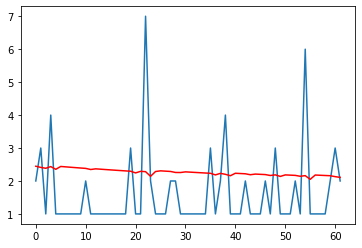

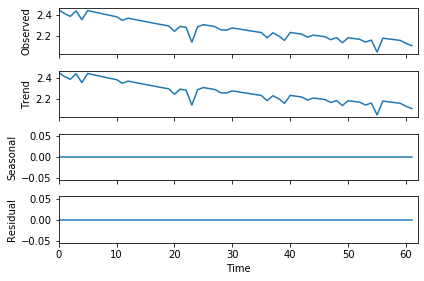

In [177]:
#repo: angular-google-maps
series = read_csv('angular_google_maps_sm_closed.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2017-11-29' '2017-12-01' '2017-12-08' '2017-12-18' '2018-01-08'
 '2018-01-12' '2018-01-16' '2018-01-20' '2018-01-23' '2018-01-28'
 '2018-01-29' '2018-01-30' '2018-02-07' '2018-02-08' '2018-02-19'
 '2018-02-26' '2018-02-28' '2018-03-01' '2018-03-02' '2018-03-07'
 '2018-03-08' '2018-03-09' '2018-03-15' '2018-03-16' '2018-03-19'
 '2018-03-20' '2018-03-22' '2018-03-25' '2018-03-28' '2018-04-16'
 '2018-04-17' '2018-04-25' '2018-04-27' '2018-04-30' '2019-08-01'
 '2019-08-09' '2019-08-10' '2019-08-11' '2019-08-15' '2019-08-16'
 '2019-08-27' '2019-08-28' '2019-08-30' '2019-09-17' '2019-10-08'
 '2019-10-18' '2019-10-23' '2019-11-05' '2019-11-15' '2019-11-18'
 '2019-11-19' '2019-11-21']
2017-11-29
2017-12-01
2017-12-08
2017-12-18
2018-01-08
2018-01-12
2018-01-16
2018-01-20
2018-01-23
2018-01-28
2018-01-29
2018-01-30
2018-02-07
2018-02-08
2018-02-19
2018-02-26
2018-02-28
2018-03-01
2018-03-02
2018-03-07
2018-03-08
2018-03-09
2018-03-15
2018-03-16
2018-03-19
2018-03-20
2018-03-22
2018-03-25
2018

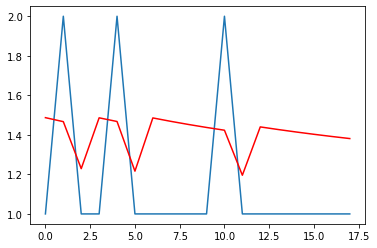

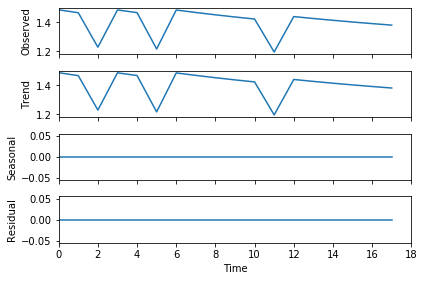

In [178]:
#repo: d3
series = read_csv('d3_sm_closed.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

#### Req 8.6 : Plot the pulls forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

In [183]:
def parse_date(x):
    print(x)
    return datetime.strptime(x, '%Y-%m-%d')

def stat_fun_1(series):
    X = series.values
    size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions_data = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(1,0,0))
        model_fit = model.fit(disp=0)
        output = model_fit.forecast()
        yhat = output[0]
        predictions_data.append(yhat)
        obs = test[t]
        history.append(obs)
        #print('predicted=%f, expected=%f' % (yhat, obs))
    error = mean_squared_error(test, predictions_data)
    print('Test MSE: %.3f' % error)
    # plot
    pyplot.plot(test)
    pyplot.plot(predictions_data, color='red')
    pyplot.show()
    result = seasonal_decompose(list(predictions_data), model='additive', freq=1)
    result.plot()
    pyplot.show()
    
def statsmodel_dataframe_pulls(temp_df):
    b = temp_df.groupby(['created_at'])['created_at']
    b1 = b.describe()
    temp = pd.DataFrame()
    temp = b1[['top', 'count']]
    temp.columns = ['ds', 'y']
    return temp

angular_sm_df = pd.DataFrame(statsmodel_dataframe_pulls(df_list_pull_1))
material_sm_df = pd.DataFrame(statsmodel_dataframe_pulls(df_list_pull_2))
angular_cli_sm_df = pd.DataFrame(statsmodel_dataframe_pulls(df_list_pull_3))
angular_google_sm_df = pd.DataFrame(statsmodel_dataframe_pulls(df_list_pull_4))
d3_sm_df = pd.DataFrame(statsmodel_dataframe_pulls(df_list_pull_5))

angular_sm_df.to_csv('angular_sm_pulls.csv', sep = ',', encoding = 'utf-8', index = False)
material_sm_df.to_csv('material_sm_pulls.csv', sep = ',', encoding = 'utf-8', index = False)
angular_cli_sm_df.to_csv('angular_cli_sm_pulls.csv', sep = ',', encoding = 'utf-8', index = False)
angular_google_sm_df.to_csv('angular_google_maps_sm_pulls.csv', sep = ',', encoding = 'utf-8', index = False)
d3_sm_df.to_csv('d3_sm_pulls.csv', sep = ',', encoding = 'utf-8', index = False)

['2019-08-27' '2019-08-28' '2019-08-29' '2019-08-30' '2019-09-01'
 '2019-09-02' '2019-09-03' '2019-09-04' '2019-09-05' '2019-09-06'
 '2019-09-07' '2019-09-08' '2019-09-09' '2019-09-10' '2019-09-11'
 '2019-09-12' '2019-09-13' '2019-09-14' '2019-09-15' '2019-09-16'
 '2019-09-17' '2019-09-18' '2019-09-19' '2019-09-20' '2019-09-21'
 '2019-09-22' '2019-09-23' '2019-09-24' '2019-09-25' '2019-09-26'
 '2019-09-27' '2019-09-28' '2019-09-29' '2019-09-30' '2019-10-01'
 '2019-10-02' '2019-10-03' '2019-10-04' '2019-10-05' '2019-10-06'
 '2019-10-07' '2019-10-08' '2019-10-09' '2019-10-10' '2019-10-11'
 '2019-10-12' '2019-10-13' '2019-10-14' '2019-10-15' '2019-10-16'
 '2019-10-17' '2019-10-18' '2019-10-19' '2019-10-20' '2019-10-21'
 '2019-10-22' '2019-10-23' '2019-10-24' '2019-10-25' '2019-10-26'
 '2019-10-27' '2019-10-28' '2019-10-29' '2019-10-30' '2019-10-31'
 '2019-11-01' '2019-11-02' '2019-11-03' '2019-11-04' '2019-11-05'
 '2019-11-06' '2019-11-07' '2019-11-08' '2019-11-09' '2019-11-10'
 '2019-11-

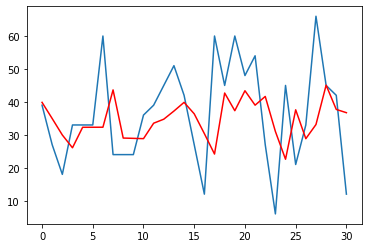

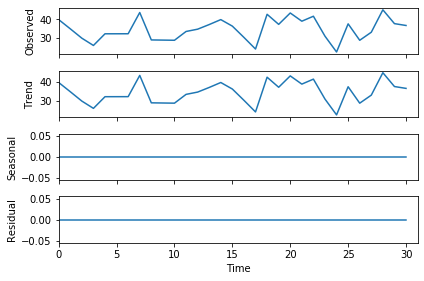

In [184]:
#repo: angular
series = read_csv('angular_sm_pulls.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2016-06-25' '2016-06-26' '2016-06-27' '2016-06-28' '2016-06-29'
 '2016-06-30' '2016-07-01' '2016-07-03' '2016-07-04' '2016-07-05'
 '2016-07-06' '2016-07-07' '2016-07-08' '2016-07-09' '2016-07-10'
 '2016-07-11' '2016-07-12' '2016-07-13' '2016-07-14' '2016-07-15'
 '2016-07-16' '2016-07-17' '2016-07-18' '2016-07-19' '2016-07-20'
 '2016-07-21' '2016-07-22' '2016-07-23' '2016-07-25' '2016-07-26'
 '2016-07-27' '2016-07-28' '2016-07-29' '2016-07-30' '2016-07-31'
 '2016-08-01' '2016-08-02' '2016-08-03' '2016-08-04' '2016-08-05'
 '2016-08-06' '2016-08-08' '2016-08-09' '2016-08-10' '2016-08-11'
 '2016-08-12' '2016-08-13' '2016-08-14' '2016-08-15' '2016-08-16'
 '2016-08-17' '2016-08-18' '2016-08-19' '2016-08-20' '2016-08-21'
 '2016-08-22' '2016-08-23' '2016-08-24' '2016-08-25' '2016-08-26'
 '2016-08-27' '2016-08-28' '2016-08-29' '2016-08-30' '2016-08-31'
 '2016-09-01' '2016-09-02' '2016-09-03' '2016-09-04' '2016-09-05'
 '2016-09-06' '2016-09-07' '2016-09-08' '2016-09-09' '2016-09-10'
 '2016-09-

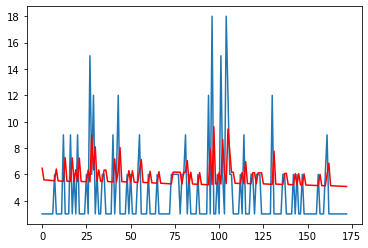

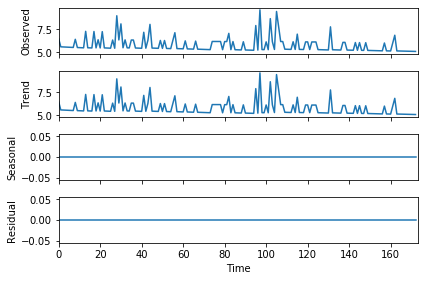

In [185]:
#repo: material
series = read_csv('material_sm_pulls.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2019-04-26' '2019-04-29' '2019-04-30' '2019-05-01' '2019-05-02'
 '2019-05-03' '2019-05-04' '2019-05-05' '2019-05-07' '2019-05-08'
 '2019-05-09' '2019-05-10' '2019-05-11' '2019-05-12' '2019-05-13'
 '2019-05-14' '2019-05-15' '2019-05-16' '2019-05-18' '2019-05-19'
 '2019-05-20' '2019-05-21' '2019-05-22' '2019-05-23' '2019-05-24'
 '2019-05-25' '2019-05-27' '2019-05-28' '2019-05-29' '2019-05-30'
 '2019-05-31' '2019-06-01' '2019-06-02' '2019-06-03' '2019-06-04'
 '2019-06-05' '2019-06-06' '2019-06-07' '2019-06-08' '2019-06-10'
 '2019-06-11' '2019-06-12' '2019-06-13' '2019-06-14' '2019-06-15'
 '2019-06-16' '2019-06-17' '2019-06-18' '2019-06-19' '2019-06-20'
 '2019-06-21' '2019-06-22' '2019-06-23' '2019-06-24' '2019-06-25'
 '2019-06-26' '2019-06-27' '2019-06-28' '2019-06-29' '2019-07-01'
 '2019-07-02' '2019-07-03' '2019-07-04' '2019-07-05' '2019-07-06'
 '2019-07-07' '2019-07-08' '2019-07-09' '2019-07-10' '2019-07-11'
 '2019-07-12' '2019-07-13' '2019-07-14' '2019-07-15' '2019-07-16'
 '2019-07-

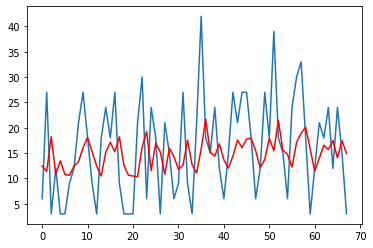

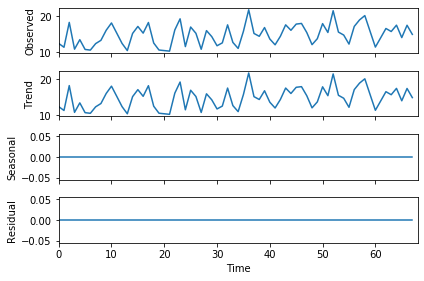

In [186]:
#repo: angular-cli
series = read_csv('angular_cli_sm_pulls.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2015-11-07' '2015-11-12' '2015-11-13' '2015-11-14' '2015-11-16'
 '2015-11-20' '2015-11-24' '2015-11-26' '2015-11-27' '2015-11-28'
 '2015-11-29' '2015-11-30' '2015-12-01' '2015-12-02' '2015-12-03'
 '2015-12-05' '2015-12-06' '2015-12-07' '2015-12-11' '2015-12-13'
 '2015-12-14' '2015-12-15' '2015-12-16' '2015-12-17' '2015-12-18'
 '2015-12-20' '2015-12-24' '2015-12-25' '2015-12-26' '2015-12-29'
 '2016-01-04' '2016-01-05' '2016-01-06' '2016-01-07' '2016-01-08'
 '2016-01-12' '2016-01-13' '2016-01-16' '2016-01-18' '2016-01-19'
 '2016-01-24' '2016-01-25' '2016-01-26' '2016-01-28' '2016-01-30'
 '2016-02-01' '2016-02-02' '2016-02-04' '2016-02-07' '2016-02-08'
 '2016-02-09' '2016-02-10' '2016-02-11' '2016-02-12' '2016-02-13'
 '2016-02-15' '2016-02-16' '2016-02-17' '2016-02-19' '2016-02-21'
 '2016-02-22' '2016-02-23' '2016-02-24' '2016-02-25' '2016-02-27'
 '2016-02-28' '2016-02-29' '2016-03-01' '2016-03-02' '2016-03-03'
 '2016-03-04' '2016-03-05' '2016-03-06' '2016-03-08' '2016-03-09'
 '2016-03-

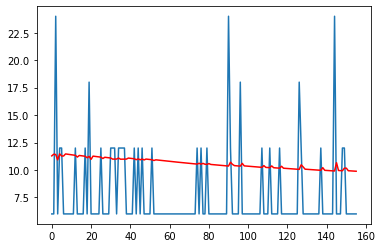

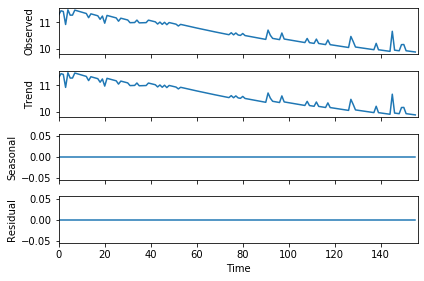

In [187]:
#repo: angular-google-maps 
series = read_csv('angular_google_maps_sm_pulls.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

['2011-07-07' '2011-07-08' '2011-07-11' '2011-07-12' '2011-07-14'
 '2011-07-16' '2011-07-19' '2011-07-22' '2011-07-26' '2011-07-27'
 '2011-08-03' '2011-08-05' '2011-08-11' '2011-08-19' '2011-08-20'
 '2011-08-22' '2011-08-23' '2011-08-24' '2011-08-26' '2011-08-27'
 '2011-08-28' '2011-08-29' '2011-08-31' '2011-09-02' '2011-09-07'
 '2011-09-09' '2011-09-10' '2011-09-11' '2011-09-14' '2011-09-15'
 '2011-09-16' '2011-09-18' '2011-09-19' '2011-09-20' '2011-09-21'
 '2011-09-22' '2011-09-24' '2011-09-26' '2011-09-28' '2011-09-29'
 '2011-09-30' '2011-10-01' '2011-10-03' '2011-10-05' '2011-10-07'
 '2011-10-08' '2011-10-11' '2011-10-13' '2011-10-18' '2011-10-20'
 '2011-10-24' '2011-10-25' '2011-10-27' '2011-11-02' '2011-11-03'
 '2011-11-04' '2011-11-05' '2011-11-09' '2011-11-10' '2011-11-12'
 '2011-11-15' '2011-11-16' '2011-11-23' '2011-12-07' '2011-12-13'
 '2011-12-14' '2011-12-15' '2011-12-26' '2011-12-27' '2011-12-30'
 '2011-12-31' '2012-01-02' '2012-01-09' '2012-01-13' '2012-01-15'
 '2012-01-

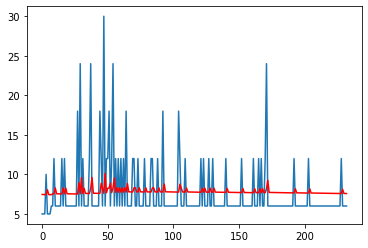

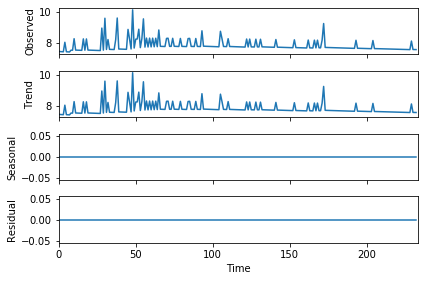

In [188]:
#repo: d3
series = read_csv('d3_sm_pulls.csv', header=0, parse_dates=[0], index_col=0, squeeze=True, date_parser=parse_date)
stat_fun_1(series)

#### Req 8.7 : Plot the commits forecast; use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

In [189]:
def statscommits():
    df_r1_commit = pd.read_csv('commits_i.csv')
    df_r1_commit.set_index('y')
    predict = sm.tsa.seasonal_decompose(df_r1_commit.index, freq=10)
    figure_r1 = predict.plot()
    figure_r1.set_size_inches(15, 8)
    df2 = df_r1_commit
    model = sm.tsa.ARIMA(df2['y'].iloc[1:], order = (5, 0, 1))
    results = model.fit()
    df2['forecast'] = results.fittedvalues
    df2[['y', 'forecast']].plot(figsize=(15,8))

In [190]:
def statsbranch():
    df_r1_branches = pd.read_csv('branches_i.csv')
    df_r1_branches.set_index('y')
    #print(df_r1_branches)
    predict = sm.tsa.seasonal_decompose(df_r1_branches.index, freq=5)
    figure_r1_b = predict.plot()
    figure_r1_b.set_size_inches(15, 8)
    df2_1 = pd.read_csv('branches_i.csv')
    model_r1_b = sm.tsa.ARIMA(df2_1['y'].iloc[1:], order = (5, 0, 1))
    results = model_r1_b.fit(dips=0)
    df2_1['forecast'] = results.fittedvalues
    df2_1[['y', 'forecast']].plot(figsize=(15,8))

In [191]:
def statscontributors():
    df_2 = pd.read_csv('contributors_i.csv')
    df_2.set_index('y')
    #print(df_2)
    predict = sm.tsa.seasonal_decompose(df_2.index, freq=10)
    figure_1 = predict.plot()
    figure_1.set_size_inches(15, 8)
    df2 = df_2
    model_r1_c = sm.tsa.ARIMA(df2['y'].iloc[1:], order = (5, 0, 1))
    results = model_r1_c.fit()
    df2['forecast'] = results.fittedvalues
    df2[['y', 'forecast']].plot(figsize=(15,8))

In [192]:
def statsrelease():
    df_3 = pd.read_csv('releases_i.csv')
    df_3.set_index('y')
    #print(df_2)
    predict = sm.tsa.seasonal_decompose(df_3.index, freq=10)
    figure_3 = predict.plot()
    figure_3.set_size_inches(15, 8)
    df3 = df_3
    model_r1_r = sm.tsa.ARIMA(df3['y'].iloc[1:], order = (5, 0, 1))
    results_r = model_r1_r.fit()
    df3['forecast'] = results_r.fittedvalues
    df3[['y', 'forecast']].plot(figsize=(15,8))

# 8.7 Stats

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\ar_model.py:763: RuntimeWarning:

divide by zero encountered in log

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:651: RuntimeWarning:

divide by zero encountered in arctanh

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:811: RuntimeWarning:

divide by zero encountered in log

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:811: RuntimeWarning:

invalid value encountered in double_scalars

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning:

Inverting 

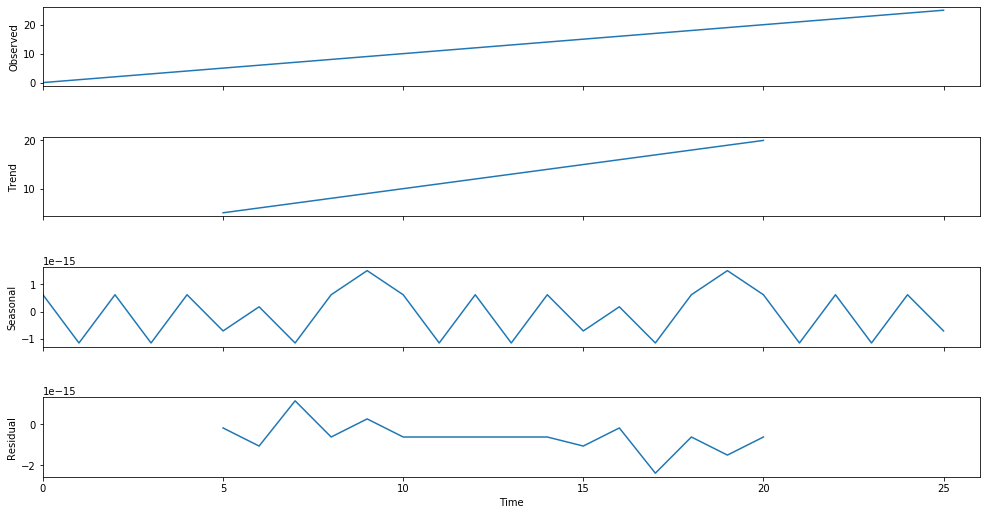

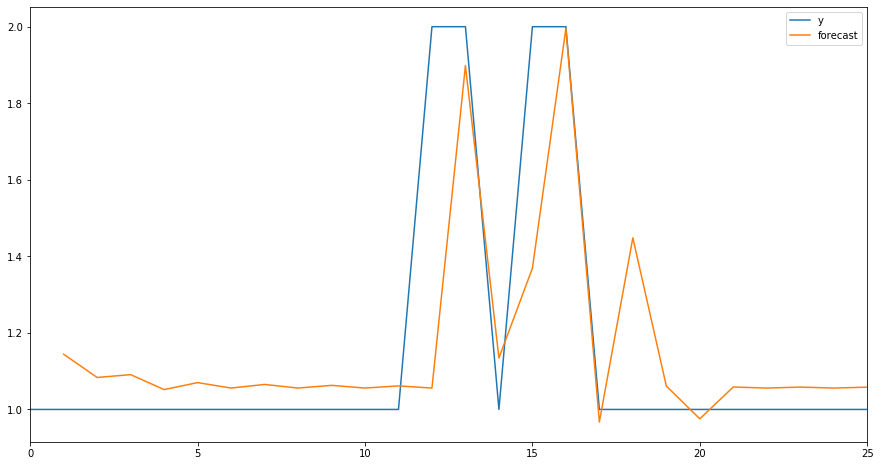

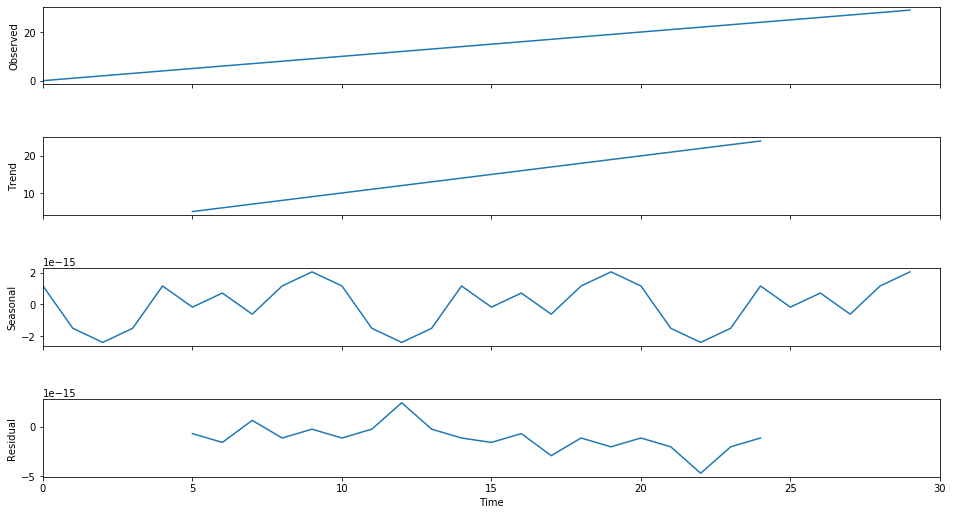

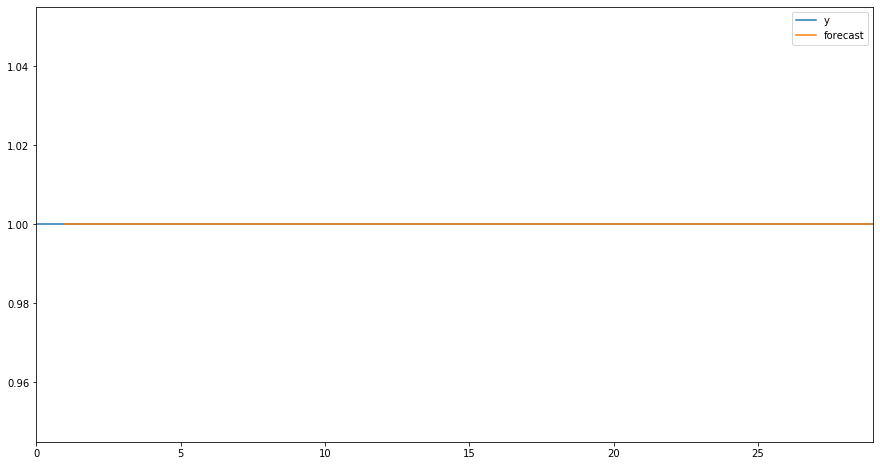

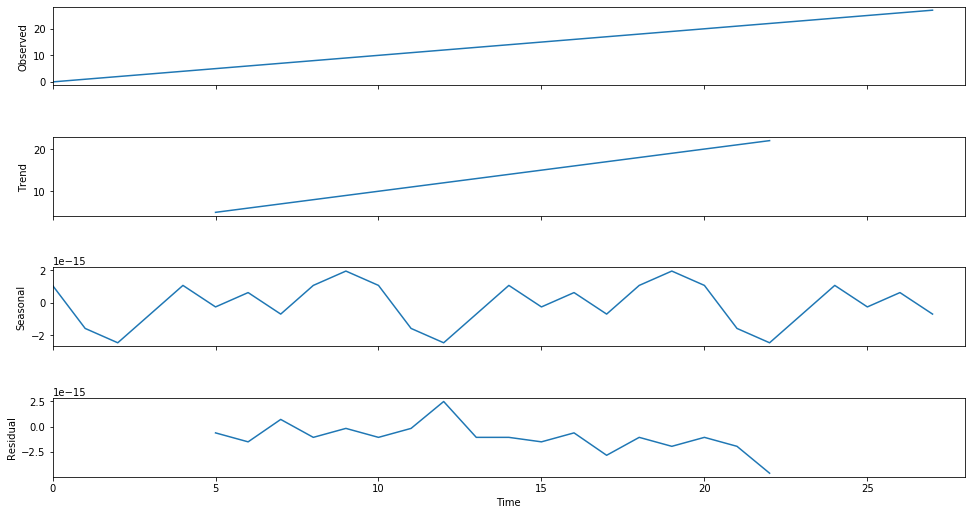

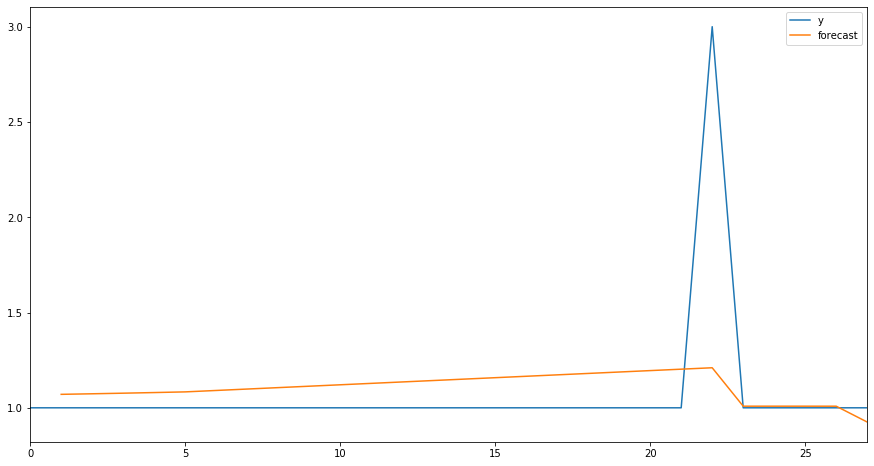

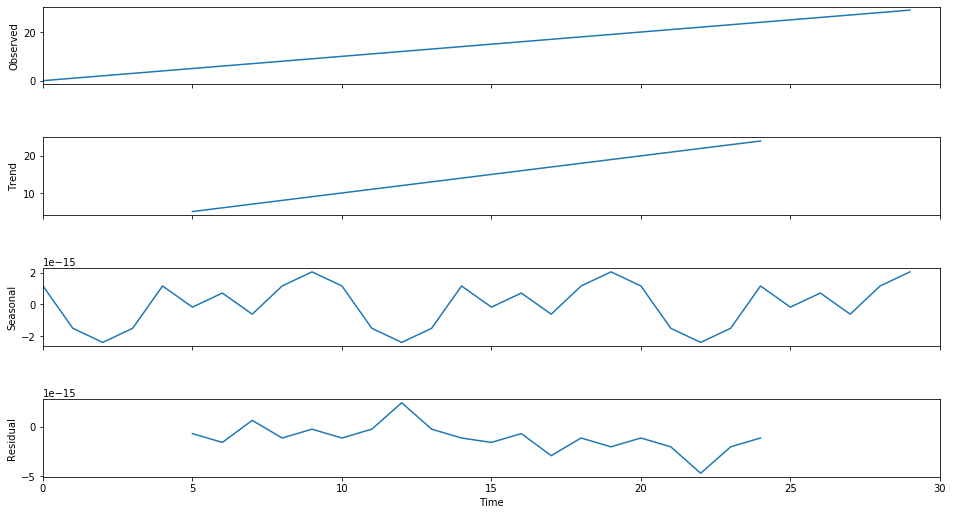

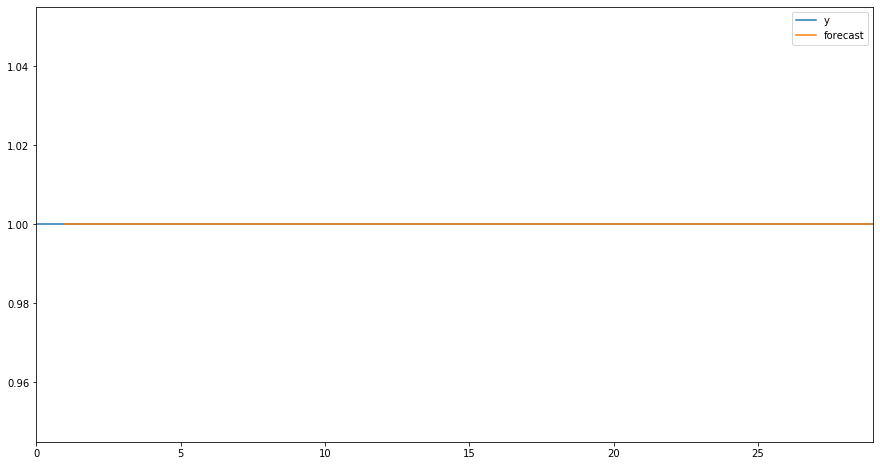

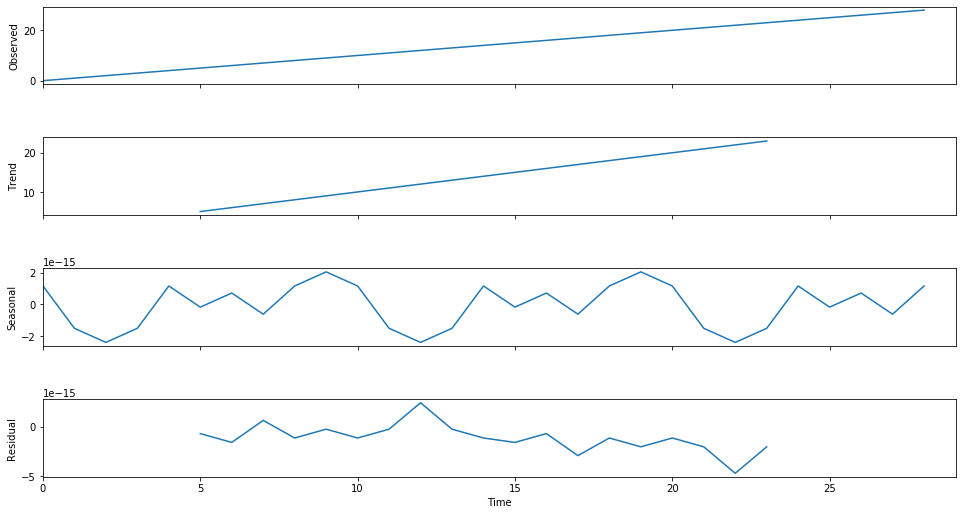

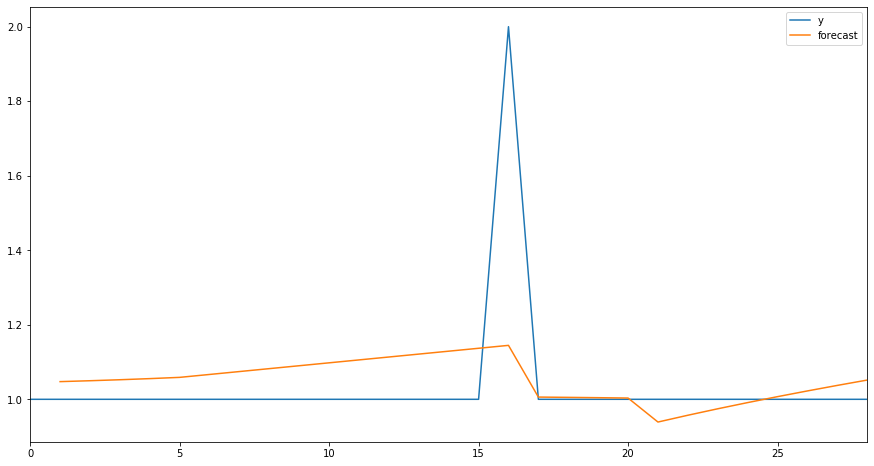

In [193]:
getcommitscsv(repos_df)
statscommits()
getcommitscsv(repos_dfmaterial)
statscommits()
getcommitscsv(repos_dfangularcli)
statscommits()
getcommitscsv(repos_dfangulargooglemaps)
statscommits()
getcommitscsv(repos_dfd3)
statscommits()








# 8.8 Stats

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_ret

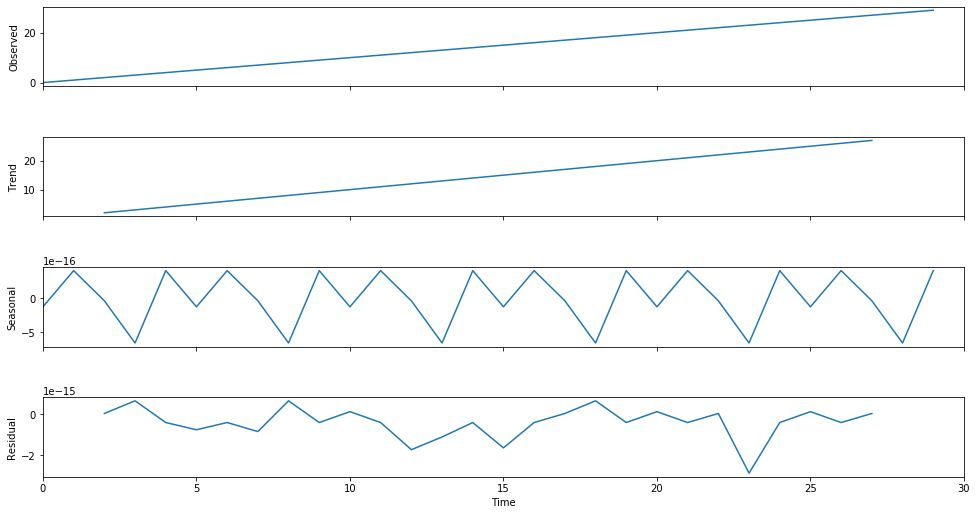

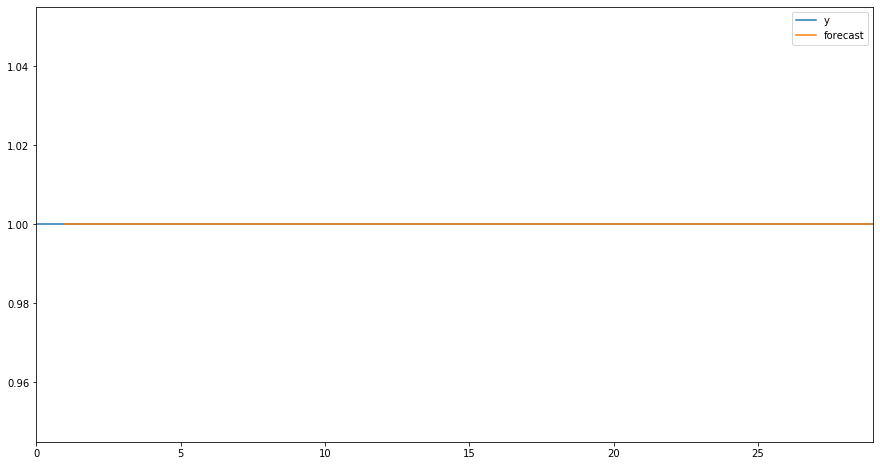

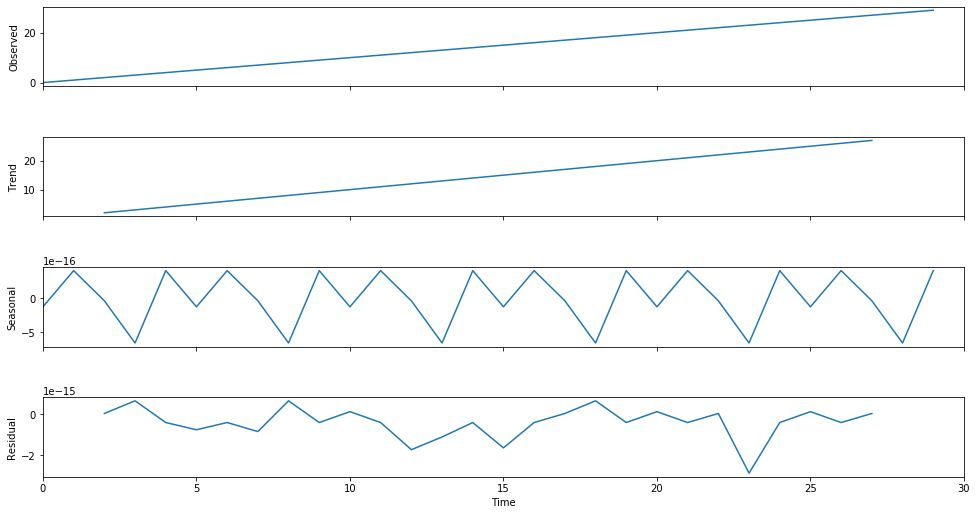

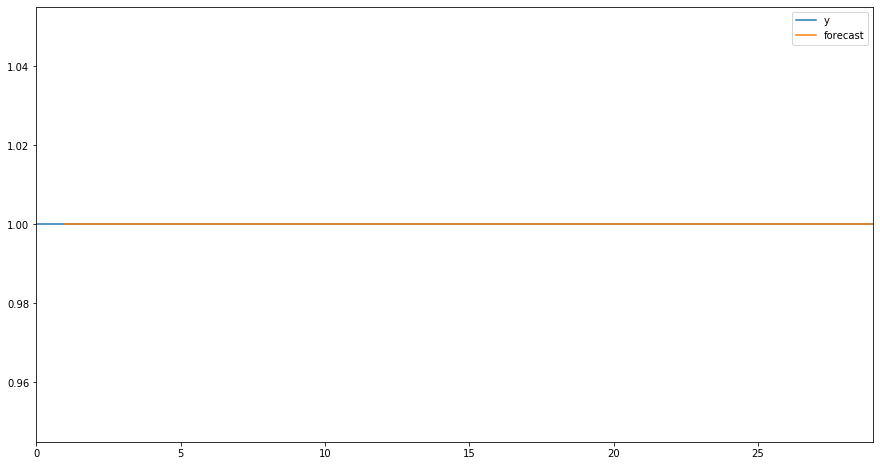

In [194]:
getbranchescsv(repos_df)
#statsbranch()
getbranchescsv(repos_dfmaterial)
statsbranch()
getbranchescsv(repos_dfangularcli)
statsbranch()
getbranchescsv(repos_dfangulargooglemaps)
#statsbranch()
#getbranchescsv(repos_dfd3)
#statsbranch()




# 8.9 Stats

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_ret

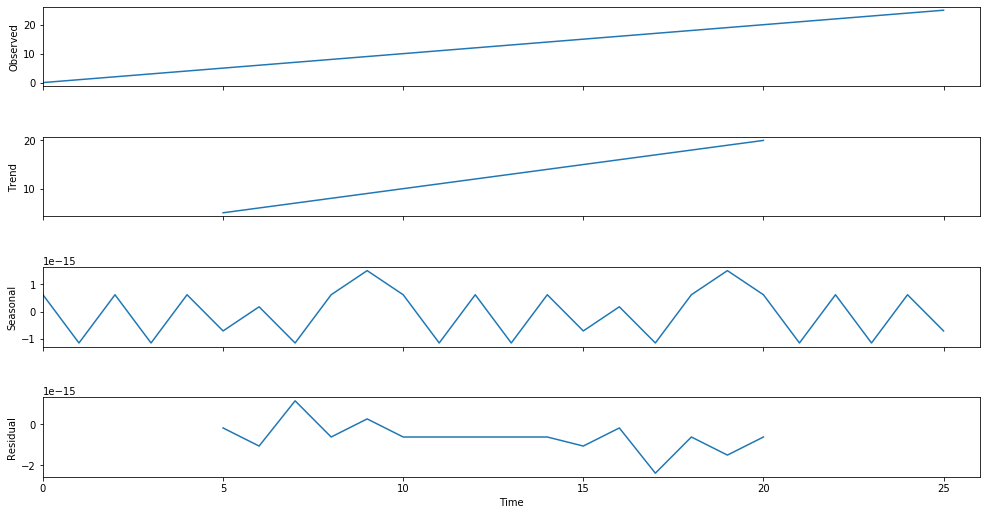

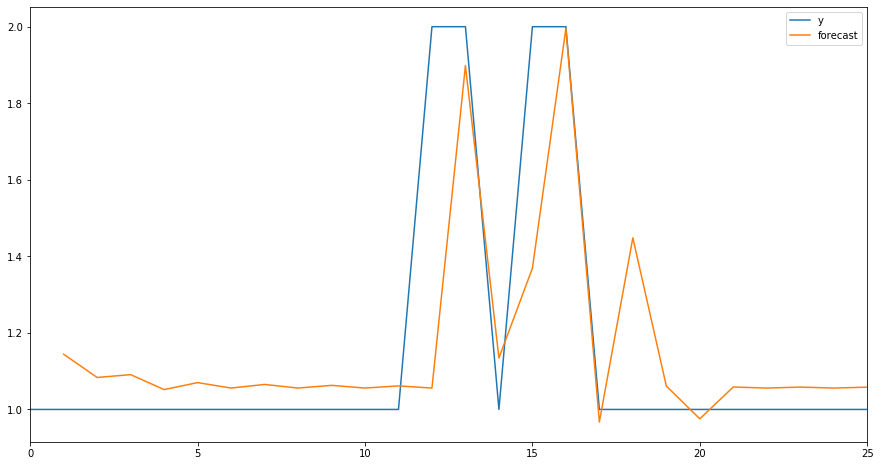

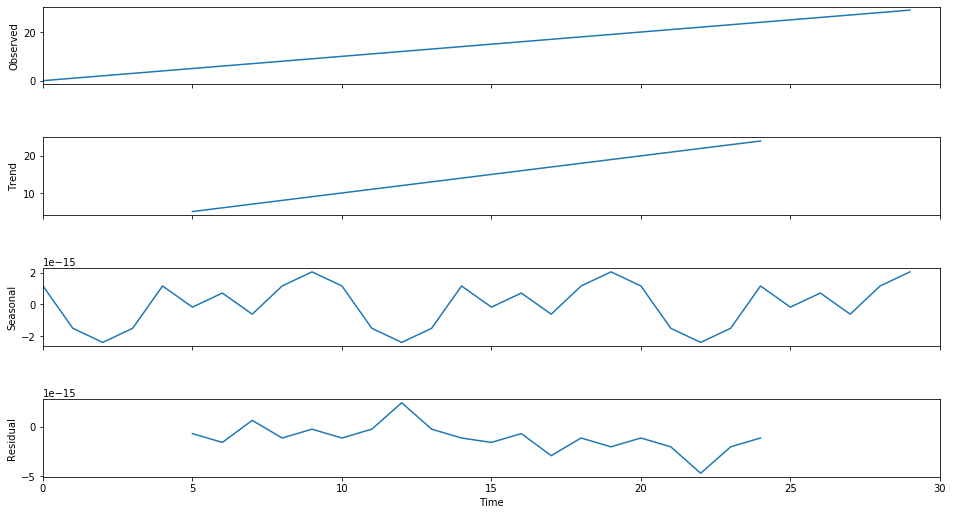

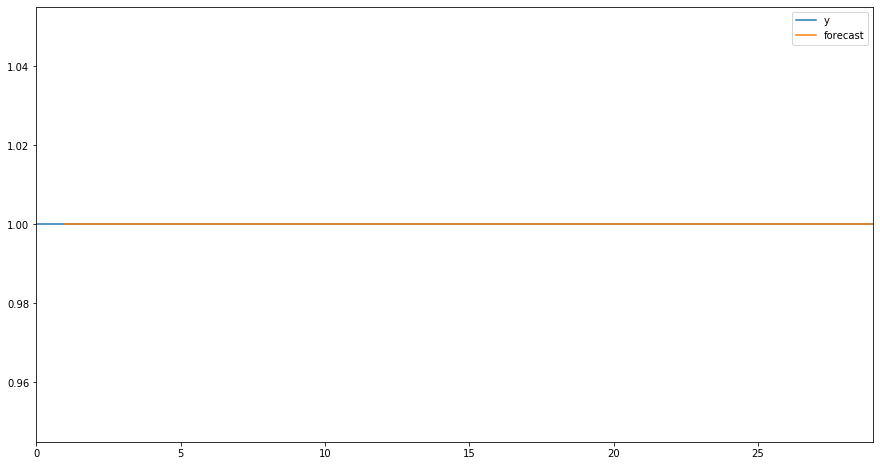

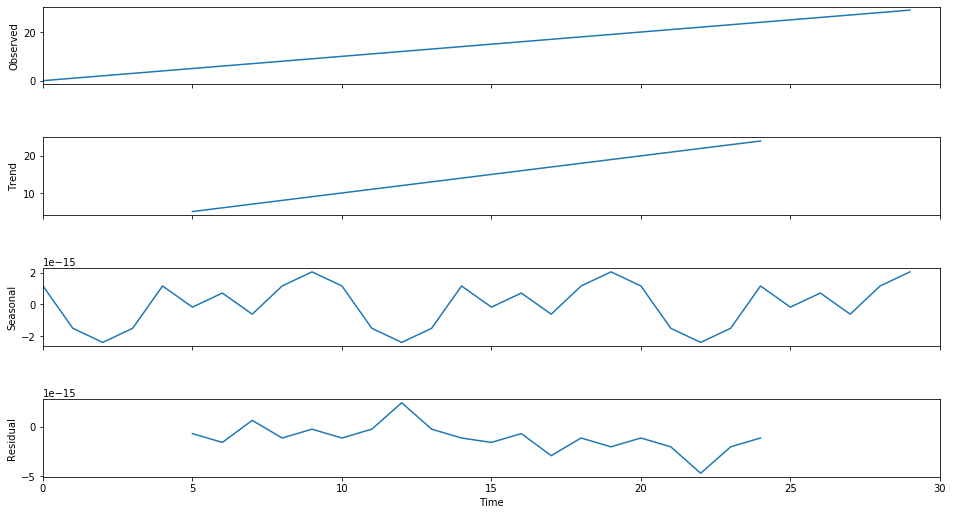

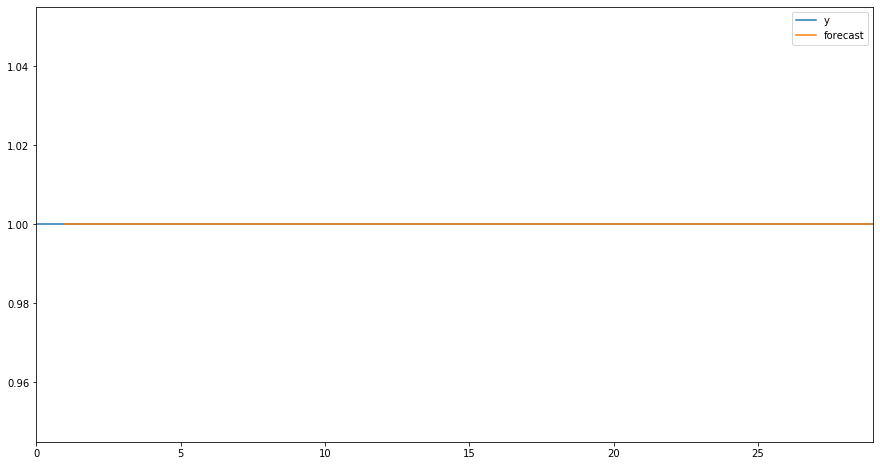

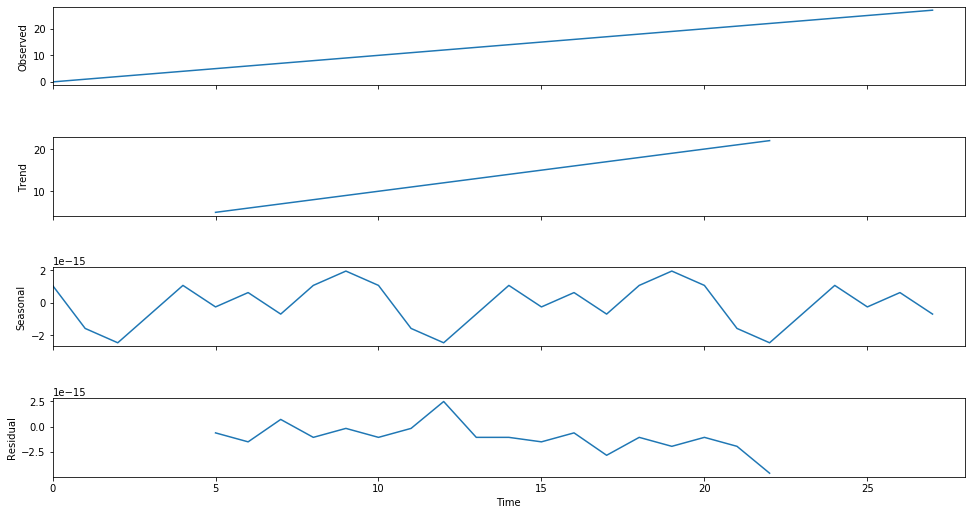

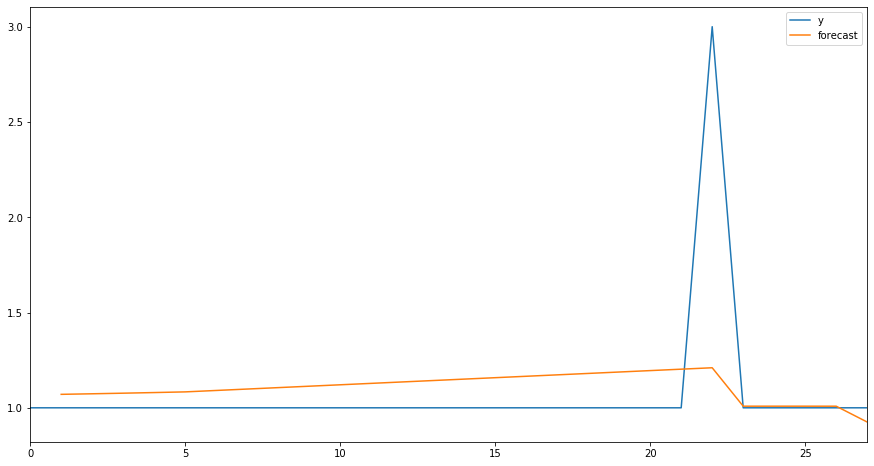

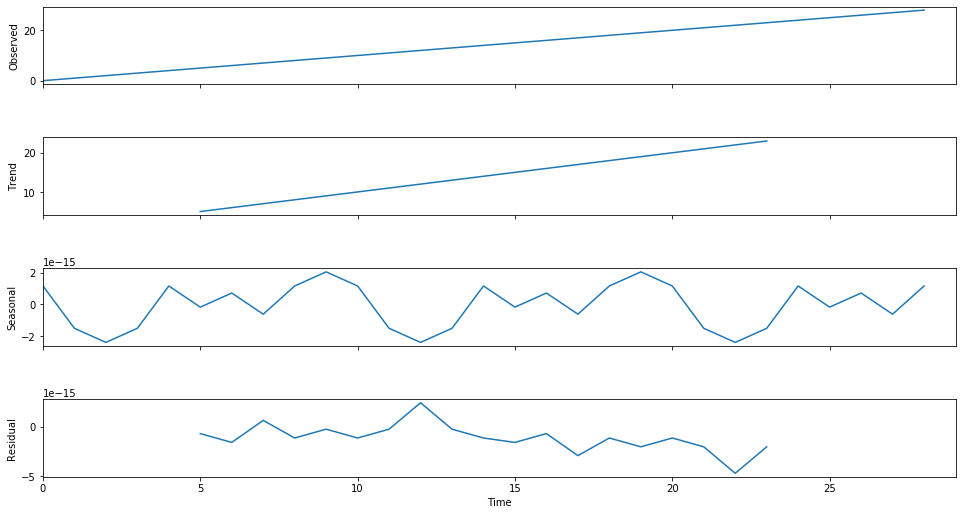

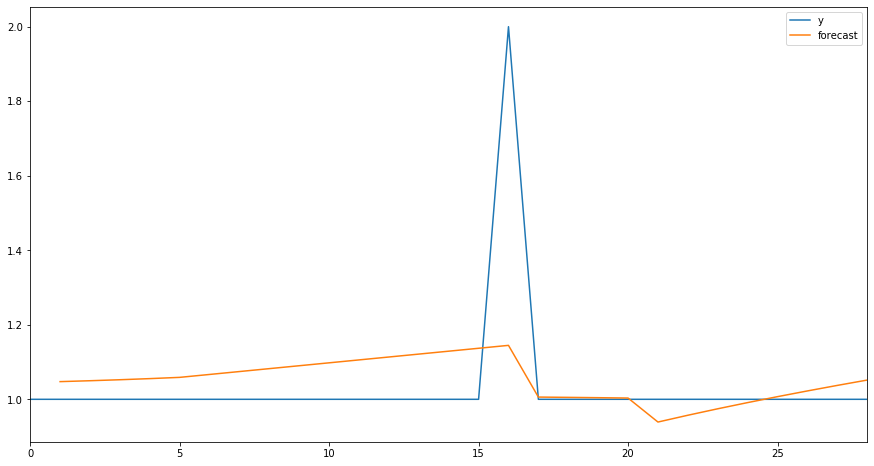

In [195]:
getcontricsv(repos_df)
statscontributors()
getcontricsv(repos_dfmaterial)
statscontributors()
getcontricsv(repos_dfangulargooglemaps)
statscontributors()
getcontricsv(repos_dfangularcli)
statscontributors()

getcontricsv(repos_dfd3)
statscontributors()


# 8.10 Stats

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_ret

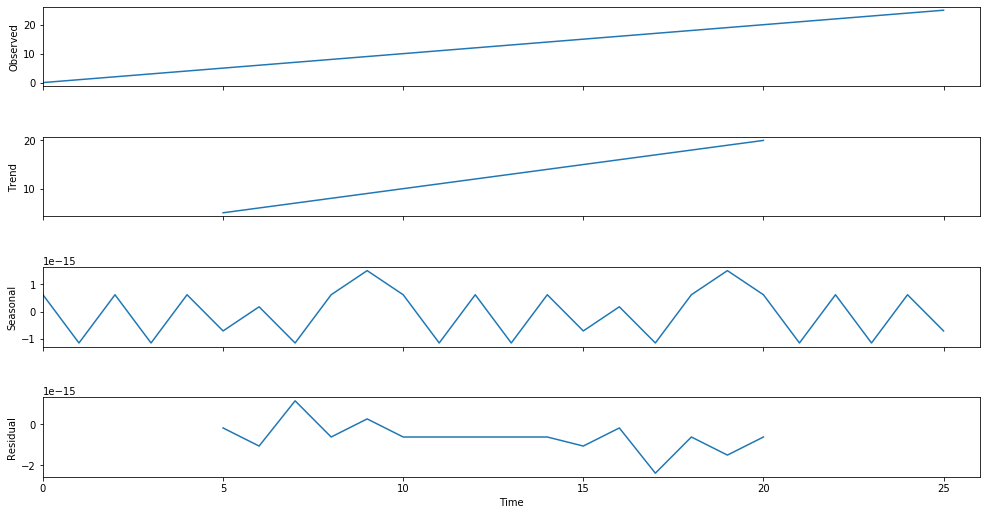

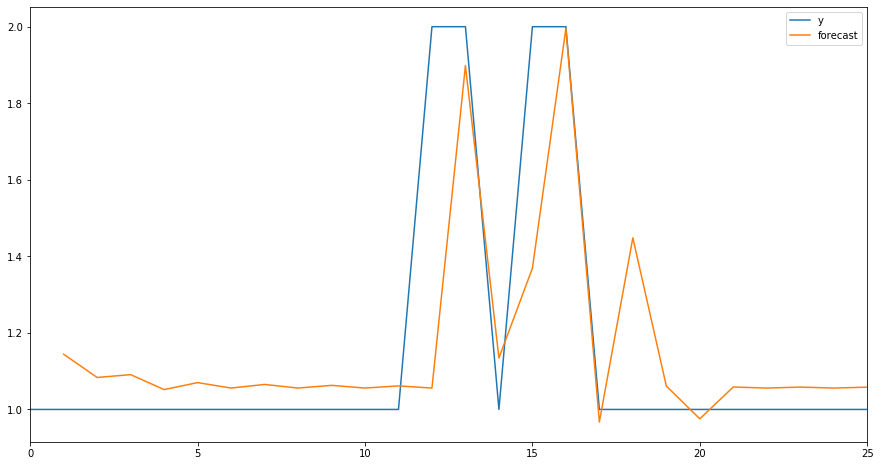

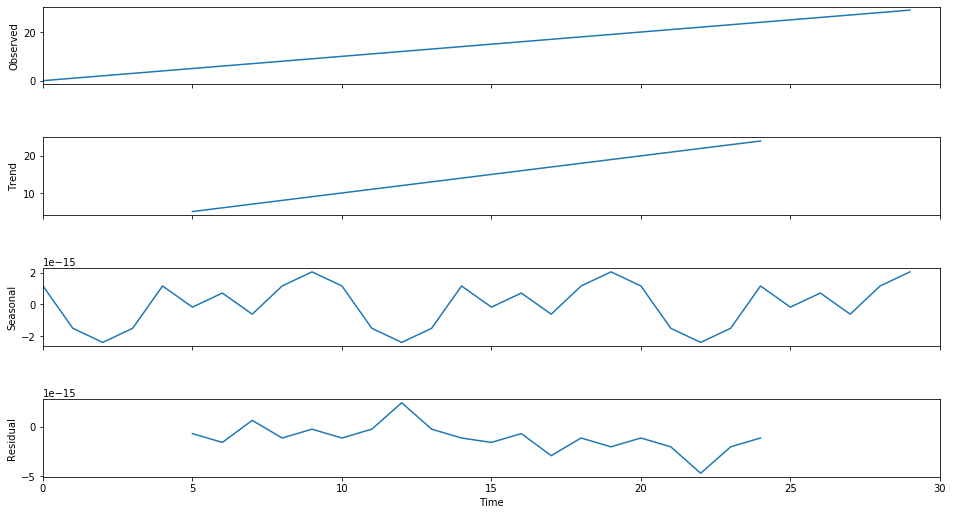

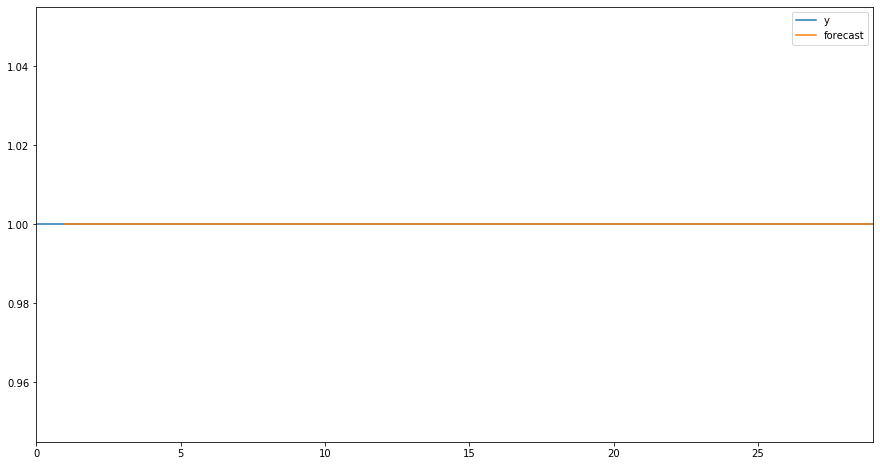

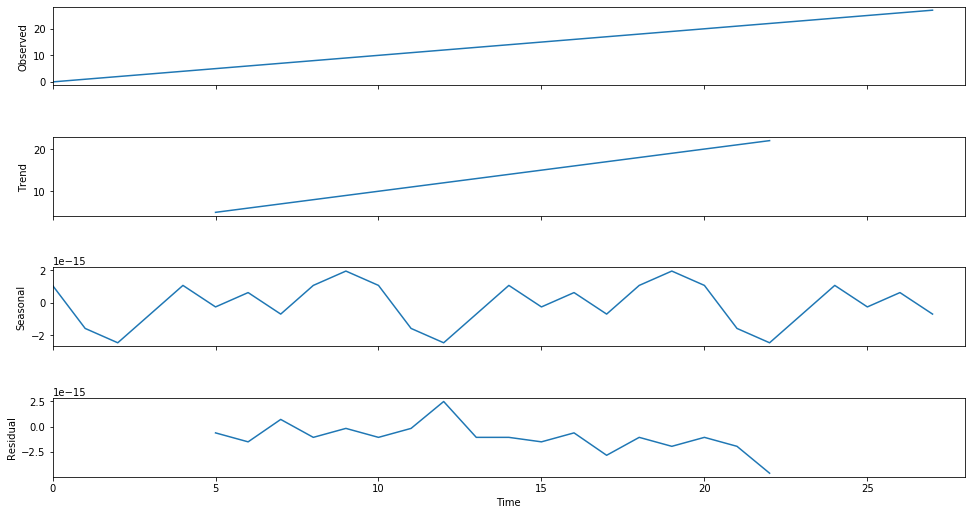

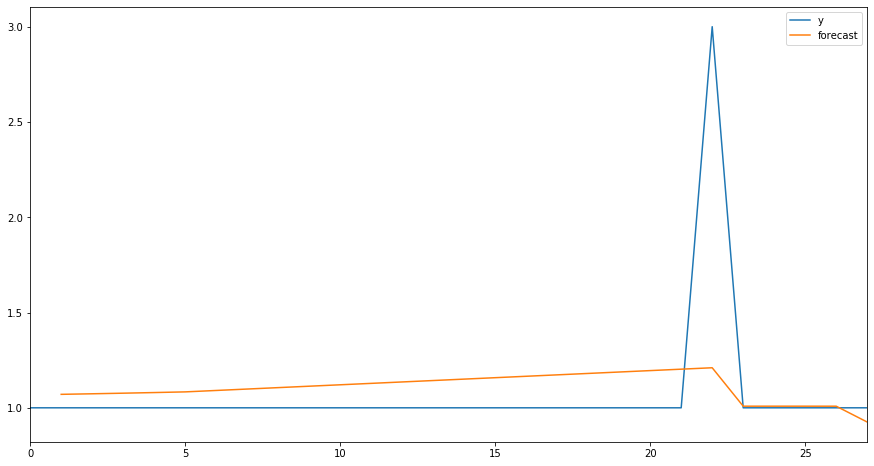

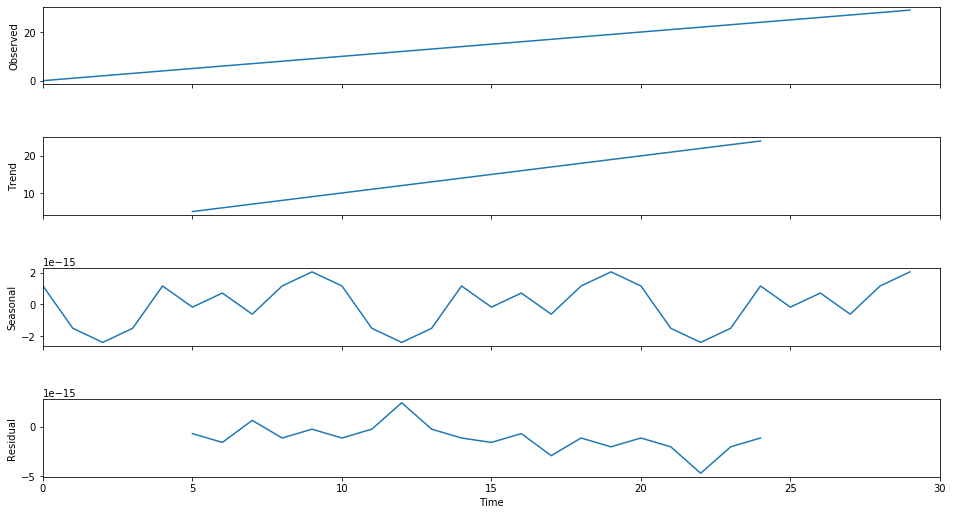

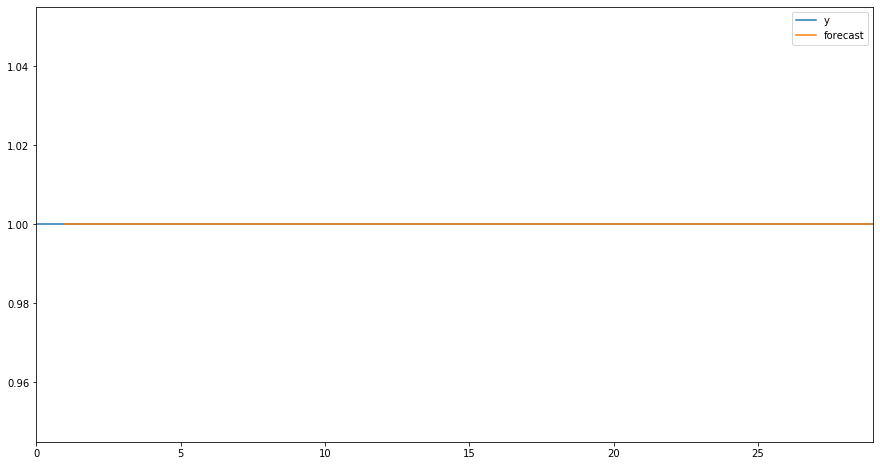

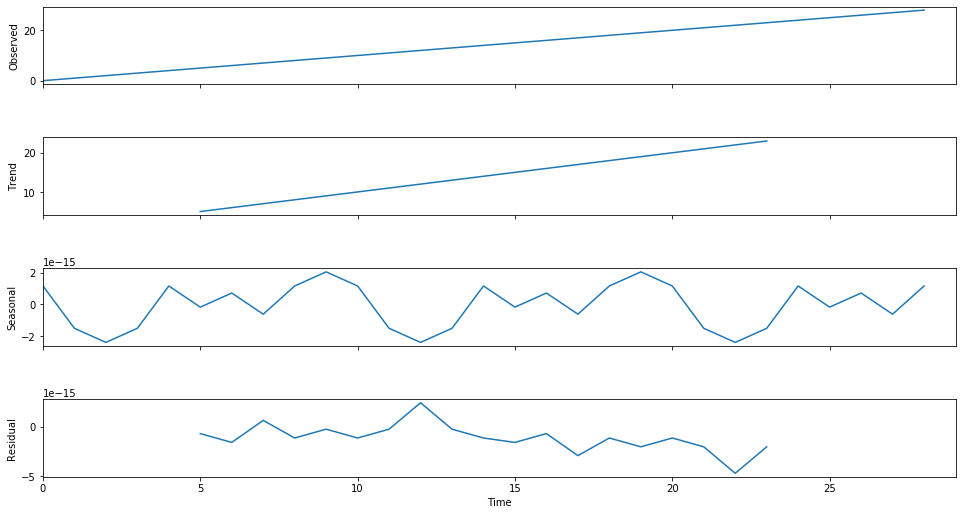

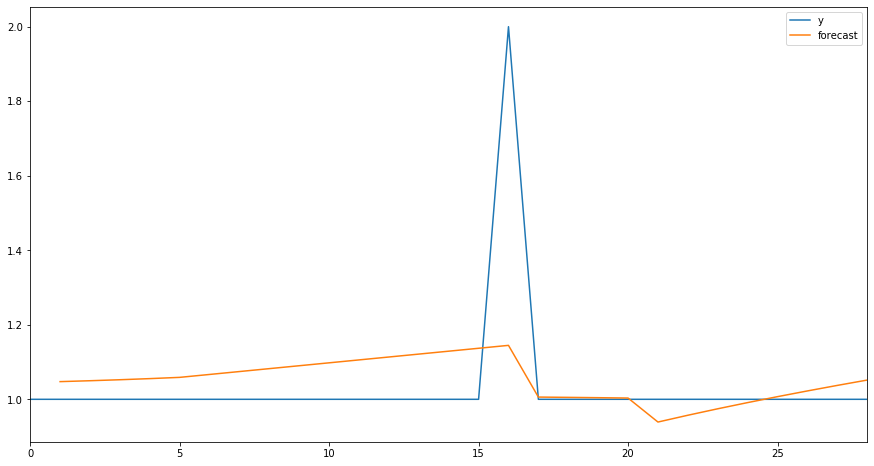

In [196]:
getreleasescv(repos_df)
statsrelease()
getreleasescv(repos_dfmaterial)
statsrelease()
getreleasescv(repos_dfangularcli)
statsrelease()
getreleasescv(repos_dfangulargooglemaps)
statsrelease()
getreleasescv(repos_dfd3)
statsrelease()